In [ ]:
# Copyright (c) Microsoft Corporation. All rights reserved.
# Licensed under the MIT License.

In [1]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima_process import ArmaProcess
from causalimpact import CausalImpact
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.stats

In [3]:
Covid = pd.read_csv('data/covid_data2.csv')
Control = pd.read_csv('data/control_data2.csv')

thr = 6

# post_count is the dictionary containing counts of candidate codes in the post-COVID period
post_count = {}
CodeList = sorted(list(set(Covid['Code'])))
SelCodeList = []
for cc in CodeList:
    covid = Covid[Covid['Code'] == cc]
    control = Control[Control['Code'] == cc]
    x = []

    for ind in list(range(-24,0)) + list(range(2,12)):
        sub_df = covid[covid['RelOnsetMonth']==ind]
        if not sub_df.empty:
            x.append(sub_df.iloc[0]['count'])
        else:
            x.append(0) 
    pre_period = [0, 23]
    post_period = [24, 27]
    pc = sum(x[post_period[0]:post_period[1]])
    if pc >= thr:
        SelCodeList.append(cc)
        post_count[cc] = pc
        
CandiCodes = SelCodeList



--------------------------------------------------------------------
Code = E78


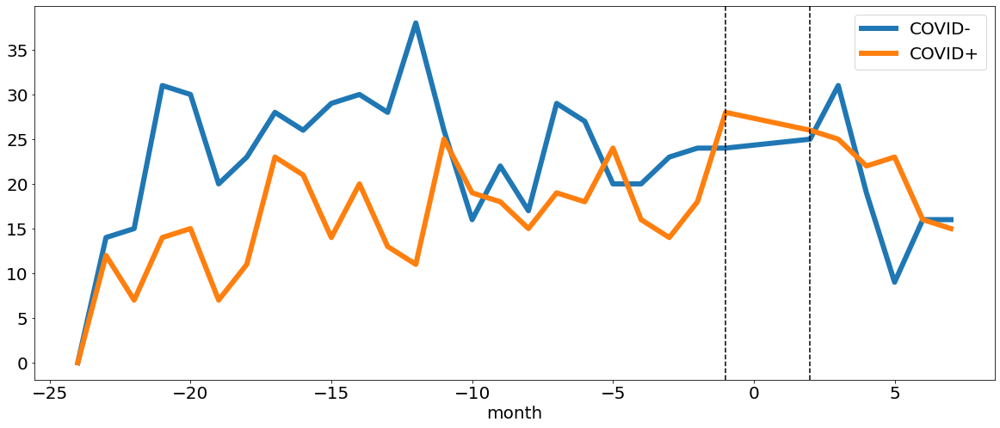

In [5]:
np.random.seed(12345)

pThres = 0.05/len(CandiCodes)

ctr, ctrBon = 0, 0
for cc in CandiCodes:
    if cc!='E78':
        continue
    print()
    print()
    print("--------------------------------------------------------------------")
    print('Code = ' + cc)
    covid = Covid[Covid['Code'] == cc]
    control = Control[Control['Code'] == cc]
    x = []
    z = []
    ttt = list(range(-24,0)) + list(range(2,8))
    plt.rcParams.update({'font.size': 20})
    for ind in ttt:
        sub_df = covid[covid['RelOnsetMonth']==ind]
        if not sub_df.empty:
            x.append(sub_df.iloc[0]['count'])
        else:
            x.append(0)     
    for ind in ttt:
        sub_df = control[control['RelOnsetMonth']==ind]
        if not sub_df.empty:
            z.append(sub_df.iloc[0]['count'])
        else:
            z.append(0)     
    data = pd.DataFrame({'month':ttt, 'COVID+': x, 'COVID-': z}, columns=['month','COVID+', 'COVID-'])
    
    data.plot(x='month',y=['COVID-', 'COVID+'],figsize=(20,8), lw=6)
    
    plt.axvline(-1, linestyle='--', color='k')
    plt.axvline(2, linestyle='--', color='k')
    plt.legend()



--------------------------------------------------------------------
Code = B00
Scipy computed Pearson r: -0.2782937243573679 and p-value: 0.18791709811619767
Causal Impact p-value = 0.01898101898101898
counts in post = 6

Significant without Bonferroni correction

sigma2.irregular    0.962486
sigma2.level        0.000069
beta.covariate     -0.278331
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.75               7.0
Prediction (s.d.)         0.39 (0.64)        1.54 (2.56)
95% CI                    [-0.83, 1.67]      [-3.33, 6.7]

Absolute effect (s.d.)    1.36 (0.64)        5.46 (2.56)
95% CI                    [0.08, 2.58]       [0.3, 10.33]

Relative effect (s.d.)    354.24% (165.97%)  354.24% (165.97%)
95% CI                    [19.55%, 670.13%]  [19.55%, 670.13%]

Posterior tail-area probability p: 0.02
Posterior prob. of a causal effect: 98.1%

For more details run the command: print(impact.

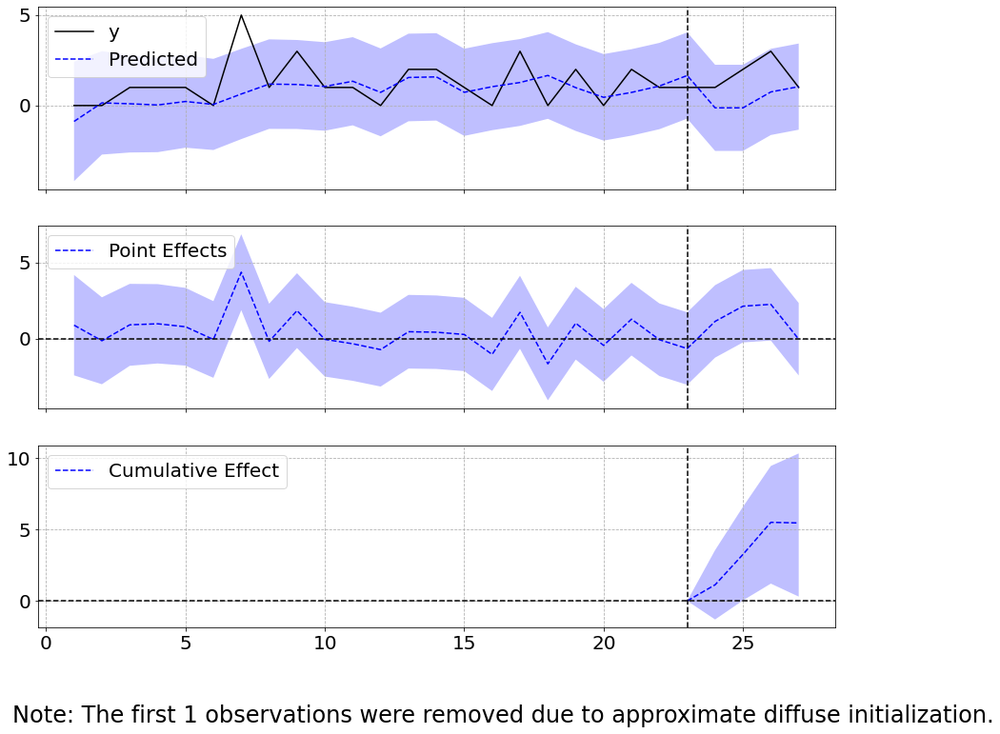



--------------------------------------------------------------------
Code = B35
Scipy computed Pearson r: 0.422286137757968 and p-value: 0.03981894747399326
Causal Impact p-value = 0.20679320679320679
counts in post = 11


sigma2.irregular    0.852385
sigma2.level        0.000144
beta.covariate      0.420647
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    5.0                20.0
Prediction (s.d.)         3.77 (1.6)         15.06 (6.39)
95% CI                    [0.61, 6.87]       [2.45, 27.49]

Absolute effect (s.d.)    1.23 (1.6)         4.94 (6.39)
95% CI                    [-1.87, 4.39]      [-7.49, 17.55]

Relative effect (s.d.)    32.76% (42.39%)    32.76% (42.39%)
95% CI                    [-49.72%, 116.46%] [-49.72%, 116.46%]

Posterior tail-area probability p: 0.21
Posterior prob. of a causal effect: 79.32%

For more details run the command: print(impact.summary('report'))
Analysis report {Ca

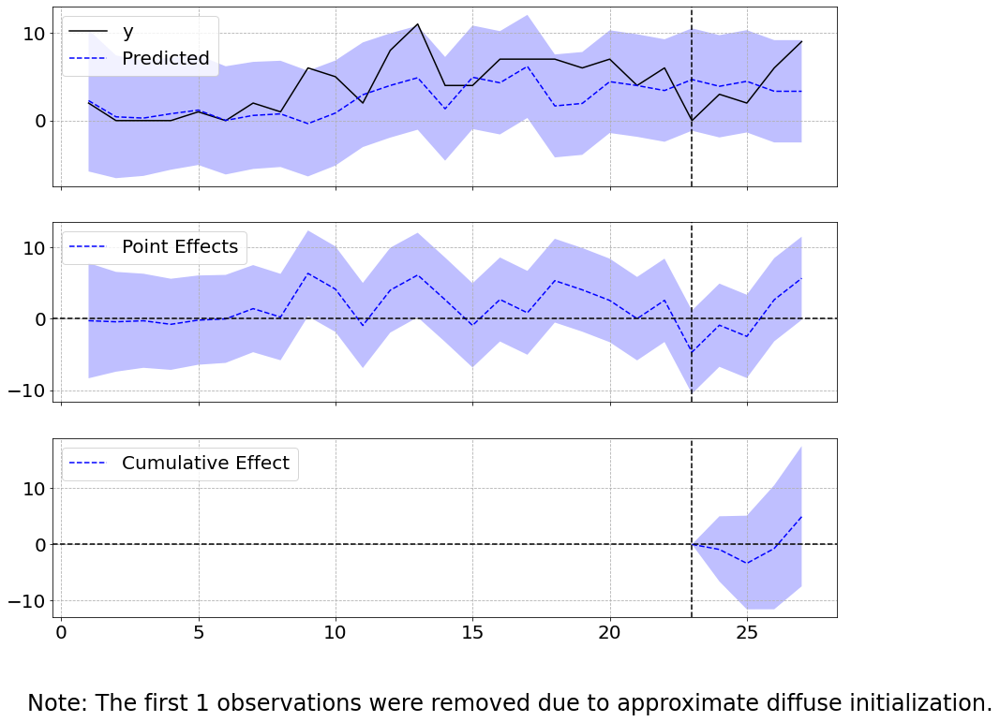



--------------------------------------------------------------------
Code = B96
Scipy computed Pearson r: 0.18281299318380417 and p-value: 0.39253669333589747
Causal Impact p-value = 0.07192807192807193
counts in post = 6


sigma2.irregular    1.008320
sigma2.level        0.000069
beta.covariate      0.182279
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.25               9.0
Prediction (s.d.)         1.23 (0.67)        4.9 (2.66)
95% CI                    [-0.03, 2.58]      [-0.11, 10.33]

Absolute effect (s.d.)    1.02 (0.67)        4.1 (2.66)
95% CI                    [-0.33, 2.28]      [-1.33, 9.11]

Relative effect (s.d.)    83.63% (54.31%)    83.63% (54.31%)
95% CI                    [-27.1%, 185.8%]   [-27.1%, 185.8%]

Posterior tail-area probability p: 0.07
Posterior prob. of a causal effect: 92.81%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

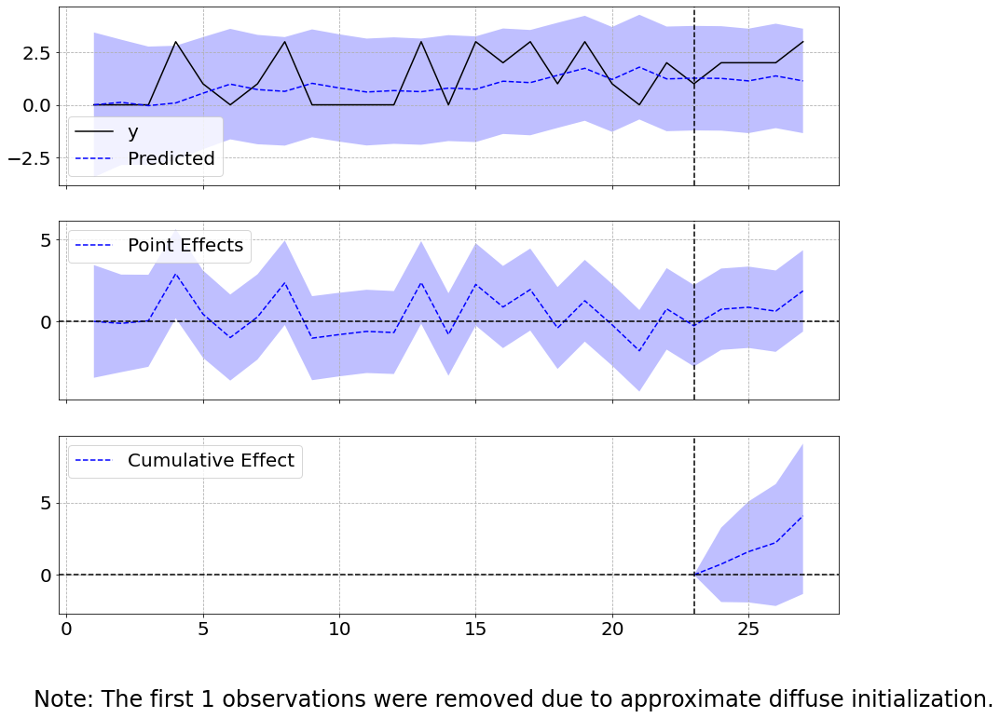



--------------------------------------------------------------------
Code = B97
Scipy computed Pearson r: 0.8164119432305152 and p-value: 1.145180589767299e-06
Causal Impact p-value = 0.3946053946053946
counts in post = 9


sigma2.irregular    0.347320
sigma2.level        0.000144
beta.covariate      0.815864
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.25               9.0
Prediction (s.d.)         2.1 (0.55)         8.39 (2.21)
95% CI                    [1.01, 3.17]       [4.04, 12.69]

Absolute effect (s.d.)    0.15 (0.55)        0.61 (2.21)
95% CI                    [-0.92, 1.24]      [-3.69, 4.96]

Relative effect (s.d.)    7.27% (26.32%)     7.27% (26.32%)
95% CI                    [-43.98%, 59.18%]  [-43.98%, 59.18%]

Posterior tail-area probability p: 0.39
Posterior prob. of a causal effect: 60.54%

For more details run the command: print(impact.summary('report'))
Analysis report {Causal

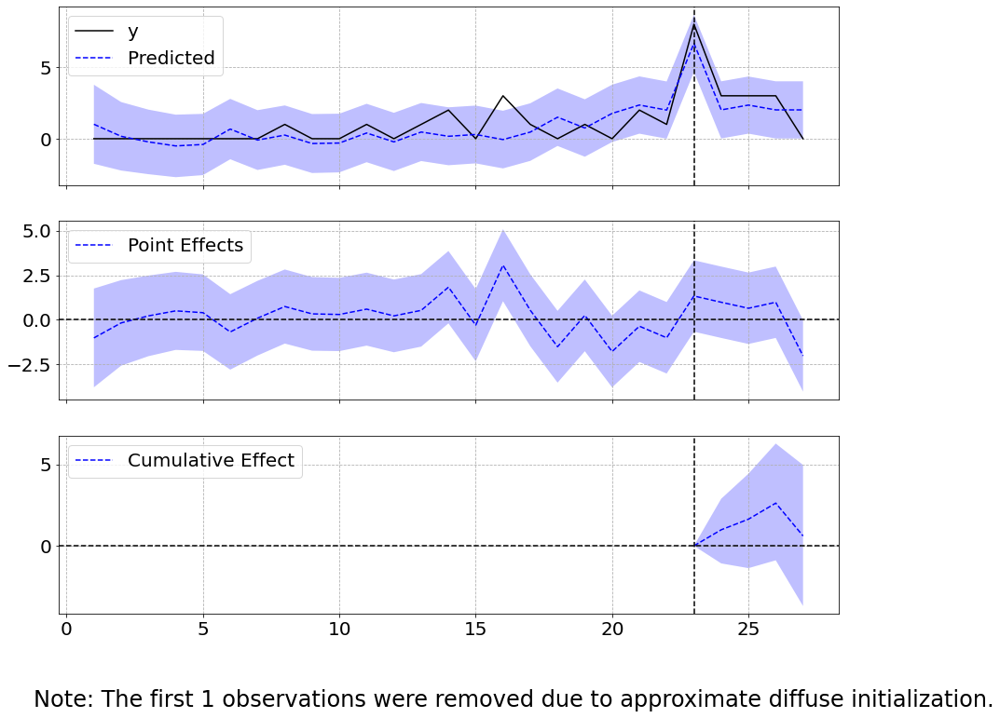



--------------------------------------------------------------------
Code = D50
Scipy computed Pearson r: 0.22198165229771707 and p-value: 0.29717615612499976
Causal Impact p-value = 0.3806193806193806
counts in post = 8


sigma2.irregular    0.988838
sigma2.level        0.000144
beta.covariate      0.220818
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.75               11.0
Prediction (s.d.)         2.5 (1.04)         9.99 (4.14)
95% CI                    [0.35, 4.41]       [1.4, 17.64]

Absolute effect (s.d.)    0.25 (1.04)        1.01 (4.14)
95% CI                    [-1.66, 2.4]       [-6.64, 9.6]

Relative effect (s.d.)    10.12% (41.48%)    10.12% (41.48%)
95% CI                    [-66.48%, 96.11%]  [-66.48%, 96.11%]

Posterior tail-area probability p: 0.38
Posterior prob. of a causal effect: 61.94%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

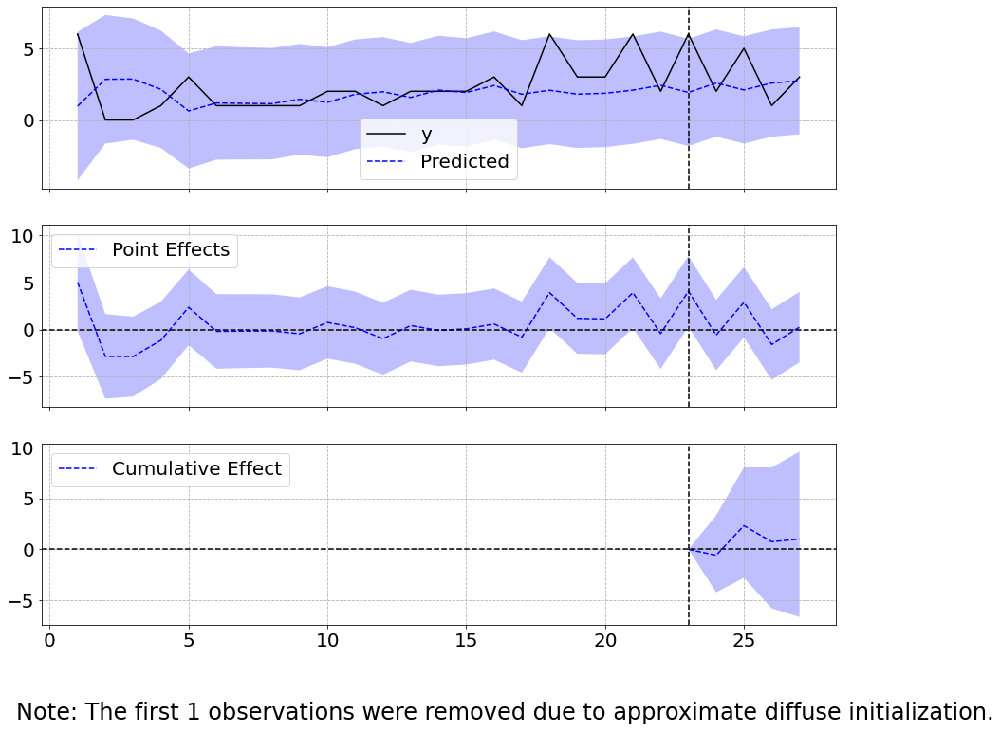



--------------------------------------------------------------------
Code = D64
Scipy computed Pearson r: -0.10045392344354082 and p-value: 0.6404749454094565
Causal Impact p-value = 0.017982017982017984
counts in post = 13

Significant without Bonferroni correction

sigma2.irregular    1.032836
sigma2.level        0.000069
beta.covariate     -0.100778
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.5                14.0
Prediction (s.d.)         1.72 (0.78)        6.88 (3.13)
95% CI                    [0.28, 3.35]       [1.11, 13.39]

Absolute effect (s.d.)    1.78 (0.78)        7.12 (3.13)
95% CI                    [0.15, 3.22]       [0.61, 12.89]

Relative effect (s.d.)    103.4% (45.55%)    103.4% (45.55%)
95% CI                    [8.79%, 187.33%]   [8.79%, 187.33%]

Posterior tail-area probability p: 0.02
Posterior prob. of a causal effect: 98.2%

For more details run the command: print(impac

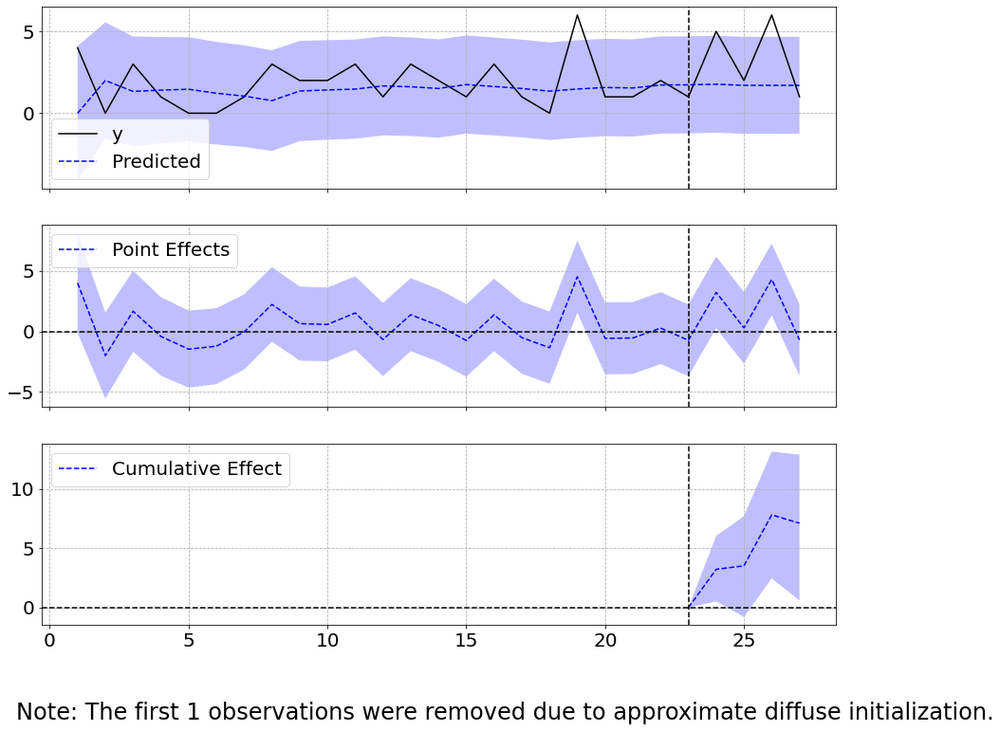



--------------------------------------------------------------------
Code = E03
Scipy computed Pearson r: 0.19561765279645202 and p-value: 0.3596344243365002
Causal Impact p-value = 0.29270729270729273
counts in post = 6


sigma2.irregular    1.003377
sigma2.level        0.000069
beta.covariate      0.195402
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.5                6.0
Prediction (s.d.)         1.97 (0.89)        7.86 (3.58)
95% CI                    [0.23, 3.74]       [0.93, 14.94]

Absolute effect (s.d.)    -0.47 (0.89)       -1.86 (3.58)
95% CI                    [-2.24, 1.27]      [-8.94, 5.07]

Relative effect (s.d.)    -23.69% (45.47%)   -23.69% (45.47%)
95% CI                    [-113.73%, 64.53%] [-113.73%, 64.53%]

Posterior tail-area probability p: 0.29
Posterior prob. of a causal effect: 70.73%

For more details run the command: print(impact.summary('report'))
Analysis report {Cau

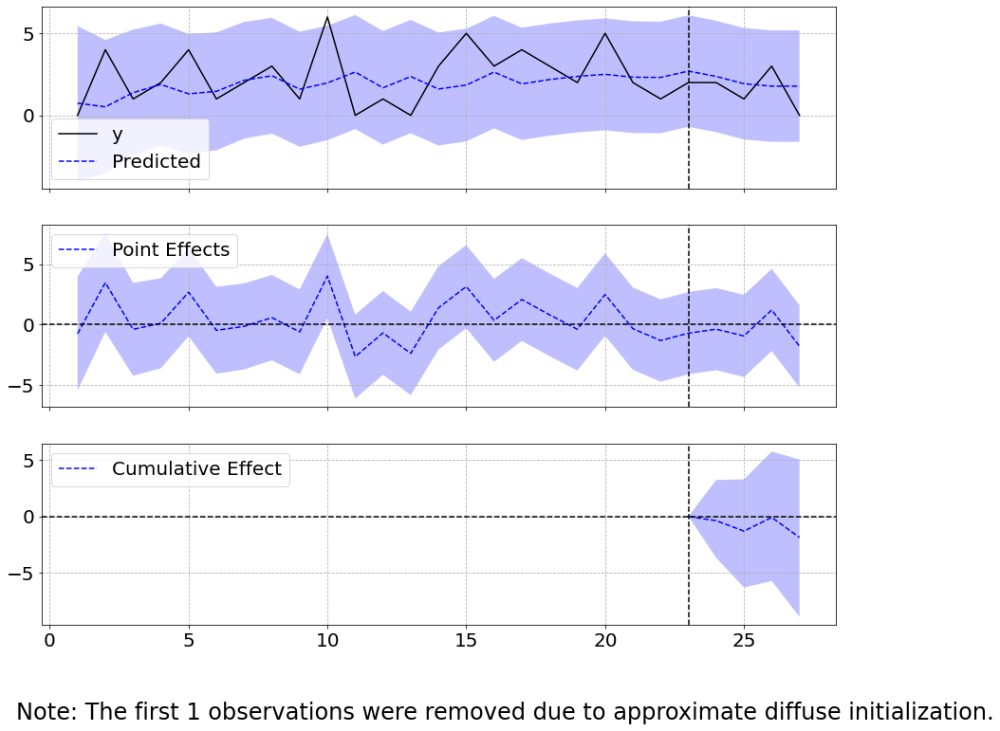



--------------------------------------------------------------------
Code = E55
Scipy computed Pearson r: 0.35459673026040844 and p-value: 0.08909671086086778
Causal Impact p-value = 0.0
counts in post = 37

Passes Bonferroni

sigma2.irregular    0.909773
sigma2.level        0.000144
beta.covariate      0.352886
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    12.5               50.0
Prediction (s.d.)         6.88 (1.52)        27.5 (6.09)
95% CI                    [3.9, 9.87]        [15.61, 39.49]

Absolute effect (s.d.)    5.62 (1.52)        22.5 (6.09)
95% CI                    [2.63, 8.6]        [10.51, 34.39]

Relative effect (s.d.)    81.81% (22.15%)    81.81% (22.15%)
95% CI                    [38.23%, 125.05%]  [38.23%, 125.05%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {

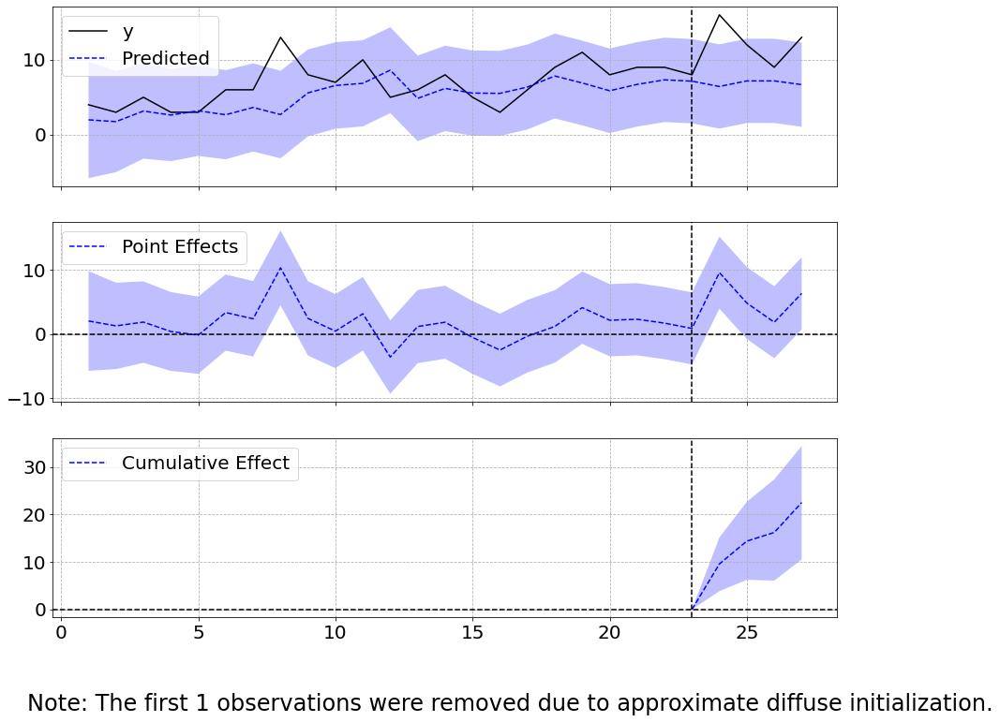



--------------------------------------------------------------------
Code = E66
Scipy computed Pearson r: 0.6878103216374531 and p-value: 0.0002037656241320953
Causal Impact p-value = 0.0
counts in post = 91

Passes Bonferroni

sigma2.irregular    0.548616
sigma2.level        0.000144
beta.covariate      0.685524
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    26.5               106.0
Prediction (s.d.)         16.93 (2.94)       67.71 (11.75)
95% CI                    [11.09, 22.61]     [44.38, 90.43]

Absolute effect (s.d.)    9.57 (2.94)        38.29 (11.75)
95% CI                    [3.89, 15.41]      [15.57, 61.62]

Relative effect (s.d.)    56.55% (17.35%)    56.55% (17.35%)
95% CI                    [22.99%, 91.01%]   [22.99%, 91.01%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis rep

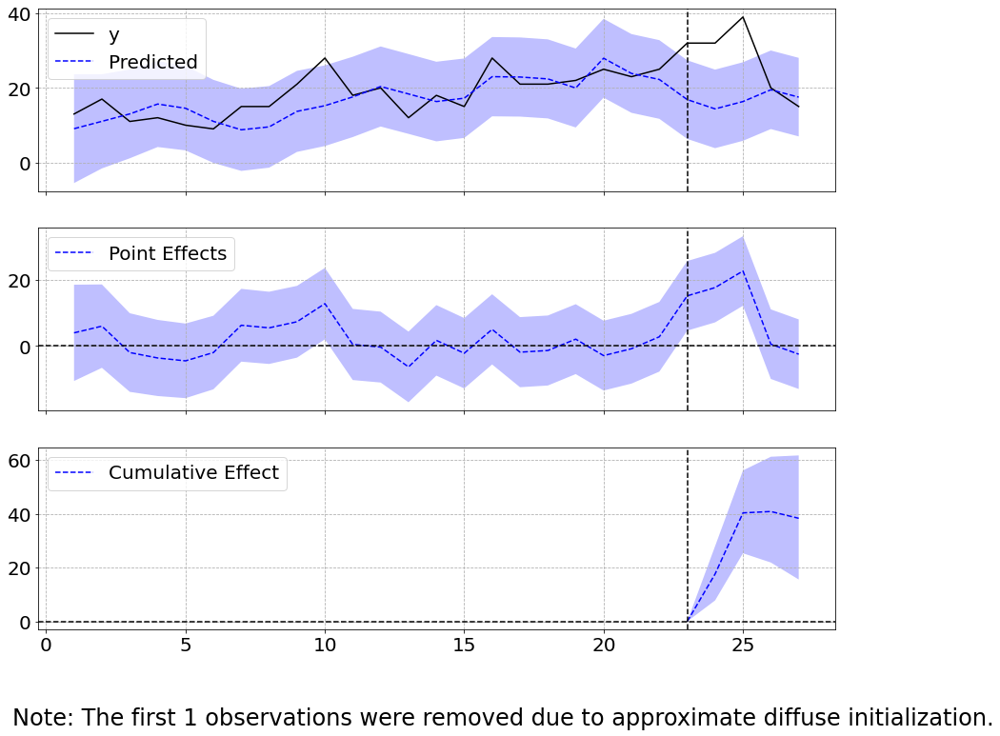



--------------------------------------------------------------------
Code = E78
Scipy computed Pearson r: 0.43744367001121426 and p-value: 0.03254302183938622
Causal Impact p-value = 0.0
counts in post = 73

Passes Bonferroni

sigma2.irregular    0.839032
sigma2.level        0.000144
beta.covariate      0.436601
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    24.0               96.0
Prediction (s.d.)         15.12 (2.92)       60.46 (11.68)
95% CI                    [9.42, 20.86]      [37.67, 83.46]

Absolute effect (s.d.)    8.88 (2.92)        35.54 (11.68)
95% CI                    [3.14, 14.58]      [12.54, 58.33]

Relative effect (s.d.)    58.78% (19.32%)    58.78% (19.32%)
95% CI                    [20.75%, 96.47%]   [20.75%, 96.47%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis repor

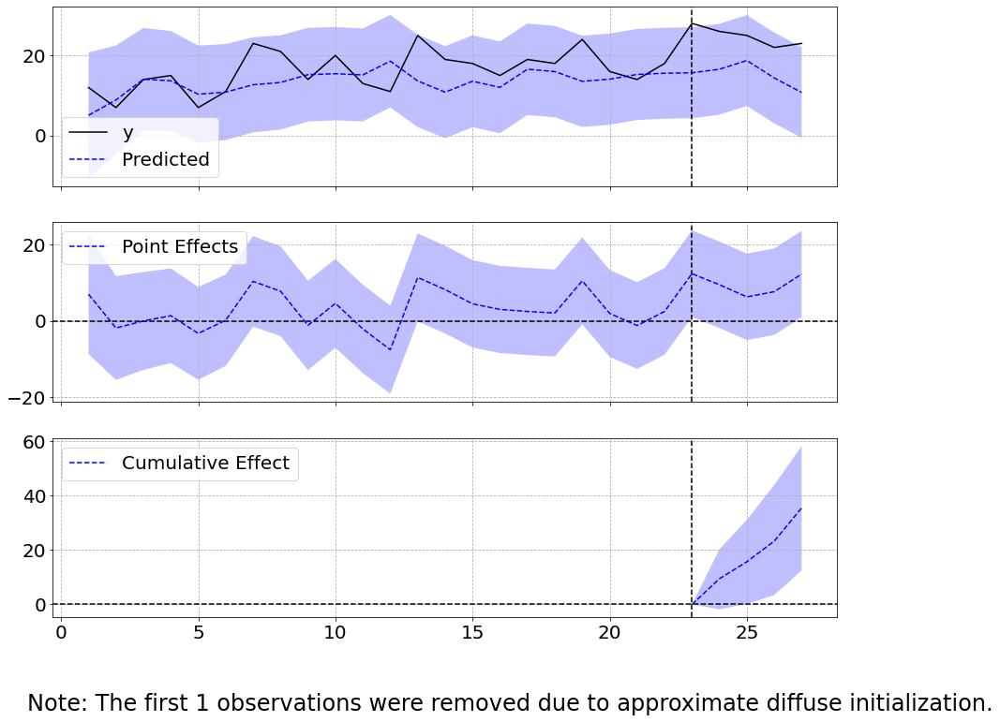



--------------------------------------------------------------------
Code = F32
Scipy computed Pearson r: 0.29725832947573305 and p-value: 0.1583492544539529
Causal Impact p-value = 0.15884115884115885
counts in post = 14


sigma2.irregular    0.947710
sigma2.level        0.000144
beta.covariate      0.294905
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.25               17.0
Prediction (s.d.)         2.95 (1.28)        11.8 (5.12)
95% CI                    [0.5, 5.52]        [2.01, 22.06]

Absolute effect (s.d.)    1.3 (1.28)         5.2 (5.12)
95% CI                    [-1.27, 3.75]      [-5.06, 14.99]

Relative effect (s.d.)    44.11% (43.36%)    44.11% (43.36%)
95% CI                    [-42.91%, 127.06%] [-42.91%, 127.06%]

Posterior tail-area probability p: 0.16
Posterior prob. of a causal effect: 84.12%

For more details run the command: print(impact.summary('report'))
Analysis report {Cau

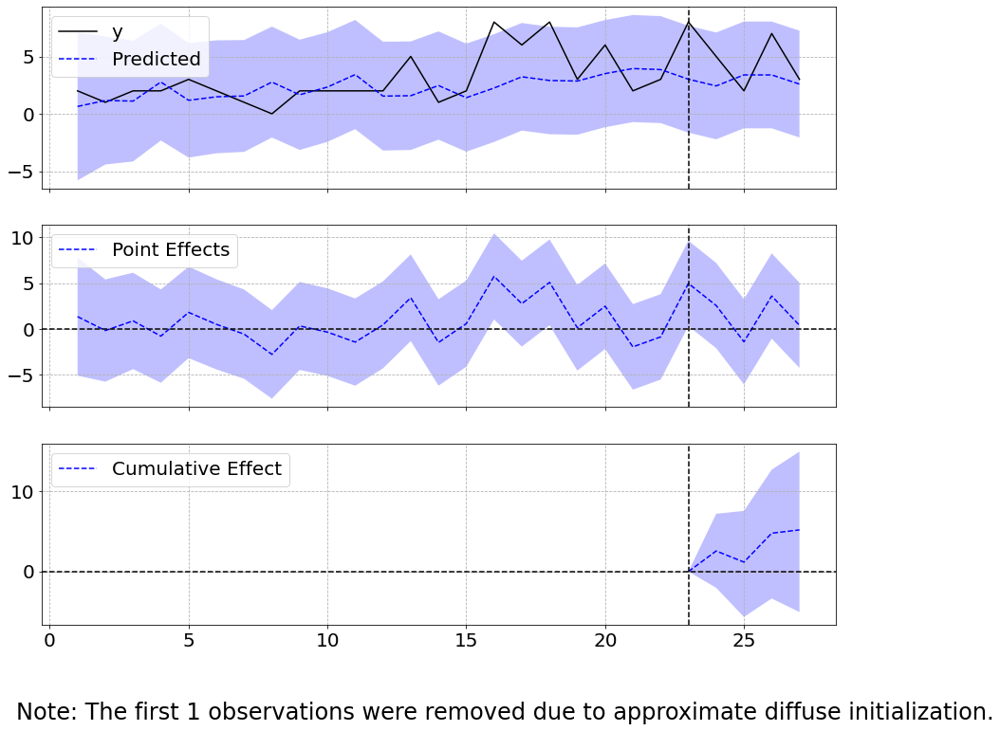



--------------------------------------------------------------------
Code = F41
Scipy computed Pearson r: 0.6627848562343067 and p-value: 0.00041668483234499876
Causal Impact p-value = 0.14185814185814186
counts in post = 20


sigma2.irregular    0.585095
sigma2.level        0.000069
beta.covariate      0.662351
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    7.25               29.0
Prediction (s.d.)         5.81 (1.33)        23.22 (5.31)
95% CI                    [3.23, 8.43]       [12.92, 33.73]

Absolute effect (s.d.)    1.44 (1.33)        5.78 (5.31)
95% CI                    [-1.18, 4.02]      [-4.73, 16.08]

Relative effect (s.d.)    24.87% (22.86%)    24.87% (22.86%)
95% CI                    [-20.38%, 69.23%]  [-20.38%, 69.23%]

Posterior tail-area probability p: 0.14
Posterior prob. of a causal effect: 85.81%

For more details run the command: print(impact.summary('report'))
Analysis report

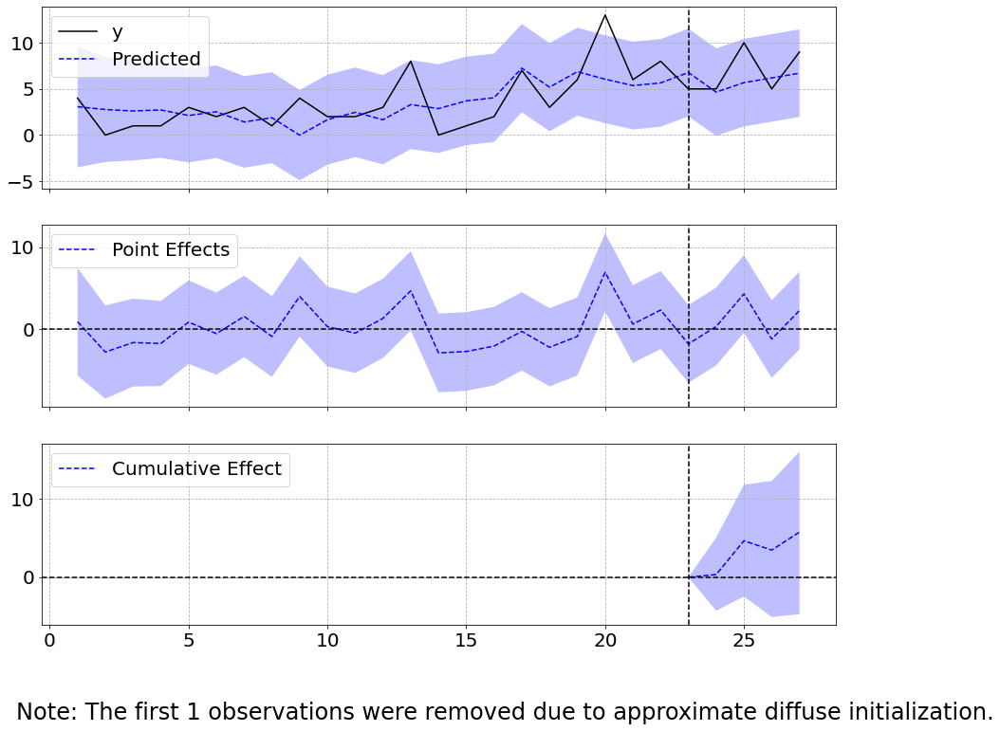



--------------------------------------------------------------------
Code = F43
Scipy computed Pearson r: 0.569276169886174 and p-value: 0.0036915549534196727
Causal Impact p-value = 0.3016983016983017
counts in post = 8


sigma2.irregular    0.705312
sigma2.level        0.000069
beta.covariate      0.569284
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.75               11.0
Prediction (s.d.)         2.35 (0.84)        9.39 (3.35)
95% CI                    [0.69, 3.97]       [2.75, 15.89]

Absolute effect (s.d.)    0.4 (0.84)         1.61 (3.35)
95% CI                    [-1.22, 2.06]      [-4.89, 8.25]

Relative effect (s.d.)    17.11% (35.7%)     17.11% (35.7%)
95% CI                    [-52.08%, 87.84%]  [-52.08%, 87.84%]

Posterior tail-area probability p: 0.3
Posterior prob. of a causal effect: 69.83%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

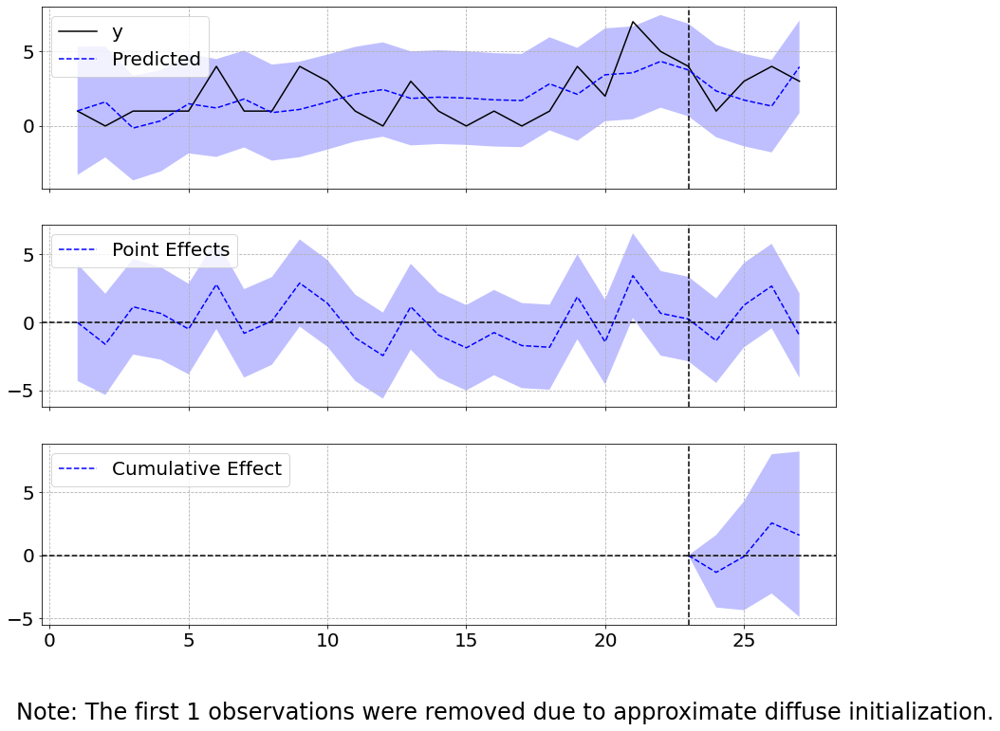



--------------------------------------------------------------------
Code = G43
Scipy computed Pearson r: 0.15253324121932468 and p-value: 0.47674571770912205
Causal Impact p-value = 0.016983016983016984
counts in post = 12

Significant without Bonferroni correction

sigma2.irregular    1.016394
sigma2.level        0.000144
beta.covariate      0.150805
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.5                14.0
Prediction (s.d.)         2.05 (0.68)        8.18 (2.73)
95% CI                    [0.7, 3.38]        [2.81, 13.51]

Absolute effect (s.d.)    1.45 (0.68)        5.82 (2.73)
95% CI                    [0.12, 2.8]        [0.49, 11.19]

Relative effect (s.d.)    71.06% (33.35%)    71.06% (33.35%)
95% CI                    [6.0%, 136.74%]    [6.0%, 136.74%]

Posterior tail-area probability p: 0.02
Posterior prob. of a causal effect: 98.3%

For more details run the command: print(impact

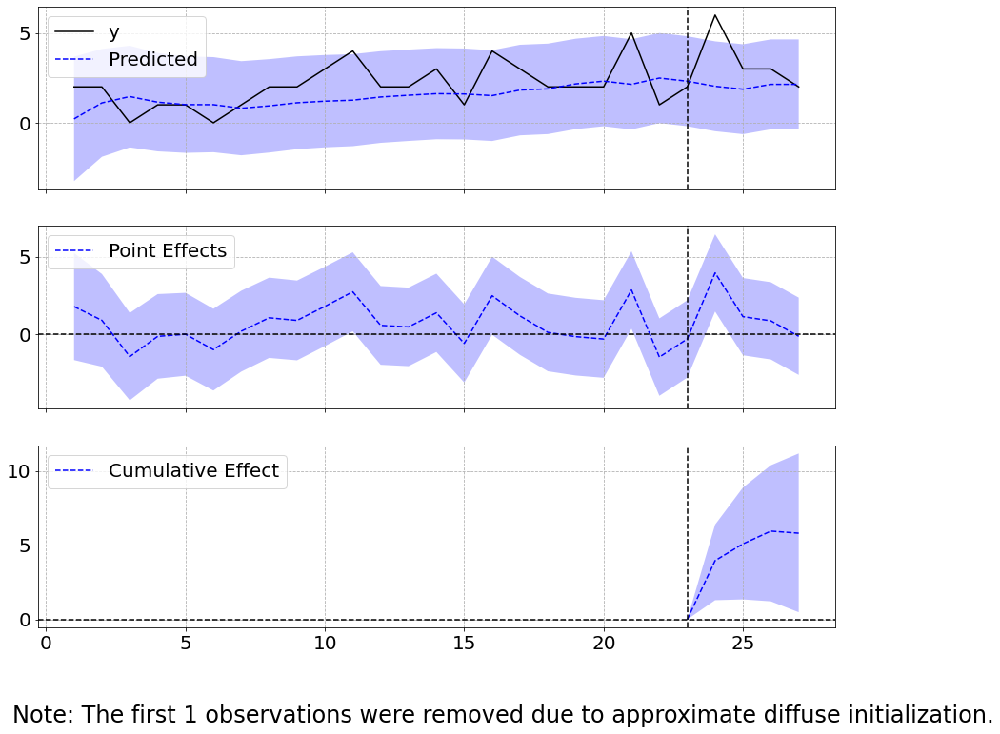



--------------------------------------------------------------------
Code = G44
Scipy computed Pearson r: 0.19859277056036834 and p-value: 0.3522276214054956
Causal Impact p-value = 0.0
counts in post = 12

Passes Bonferroni

sigma2.irregular    1.002391
sigma2.level        0.000069
beta.covariate      0.198531
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.25               17.0
Prediction (s.d.)         1.87 (0.54)        7.47 (2.15)
95% CI                    [0.81, 2.92]       [3.24, 11.67]

Absolute effect (s.d.)    2.38 (0.54)        9.53 (2.15)
95% CI                    [1.33, 3.44]       [5.33, 13.76]

Relative effect (s.d.)    127.63% (28.8%)    127.63% (28.8%)
95% CI                    [71.35%, 184.26%]  [71.35%, 184.26%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {Cau

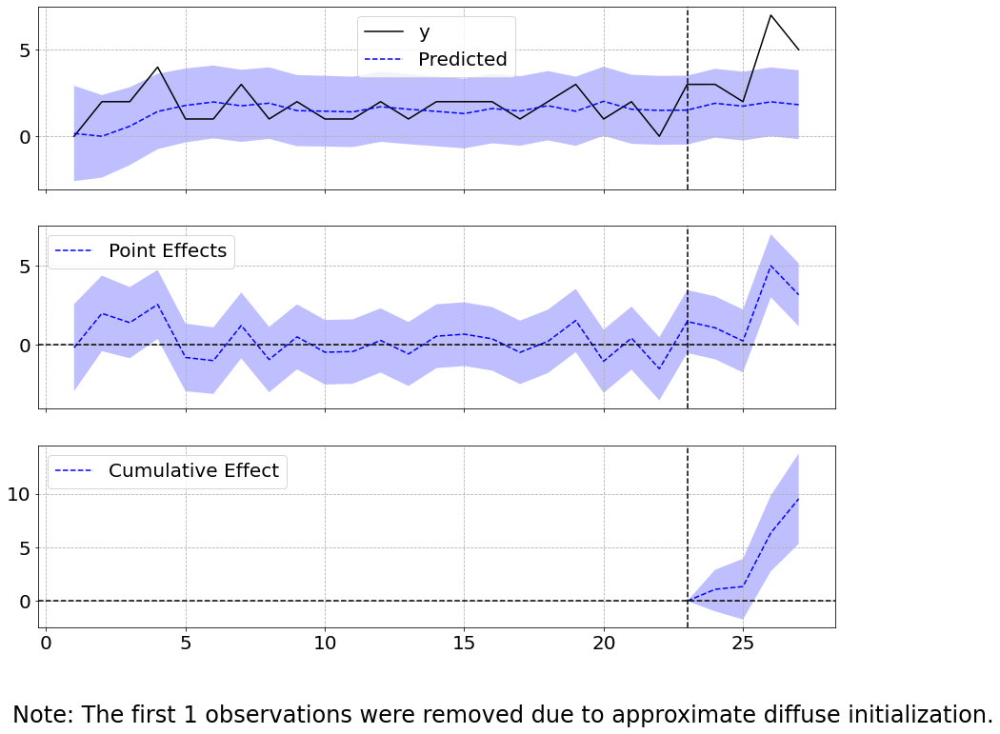



--------------------------------------------------------------------
Code = G47
Scipy computed Pearson r: 0.5196323602276645 and p-value: 0.009256014183474668
Causal Impact p-value = 0.24175824175824176
counts in post = 6


sigma2.irregular    0.761100
sigma2.level        0.000144
beta.covariate      0.518816
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         3.17 (0.96)        12.69 (3.83)
95% CI                    [1.26, 5.02]       [5.05, 20.08]

Absolute effect (s.d.)    -0.67 (0.96)       -2.69 (3.83)
95% CI                    [-2.52, 1.24]      [-10.08, 4.95]

Relative effect (s.d.)    -21.19% (30.22%)   -21.19% (30.22%)
95% CI                    [-79.44%, 39.01%]  [-79.44%, 39.01%]

Posterior tail-area probability p: 0.24
Posterior prob. of a causal effect: 75.82%

For more details run the command: print(impact.summary('report'))
Analysis report {

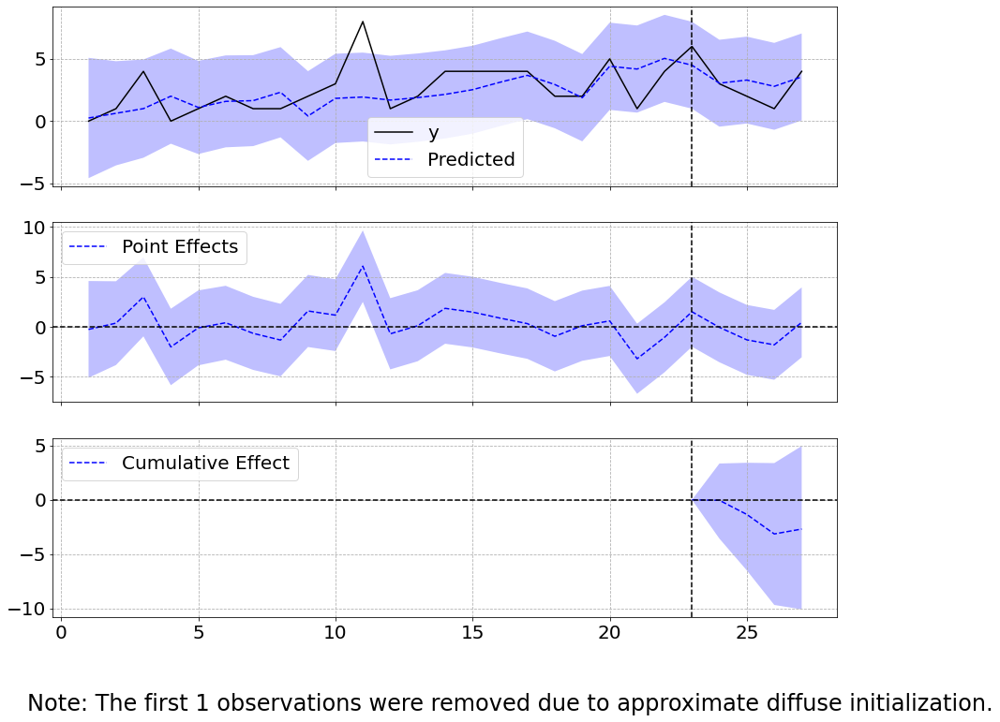



--------------------------------------------------------------------
Code = H10
Scipy computed Pearson r: 0.5311423753356728 and p-value: 0.007569941375941844
Causal Impact p-value = 0.2827172827172827
counts in post = 7


sigma2.irregular    0.748201
sigma2.level        0.000144
beta.covariate      0.529318
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         1.51 (0.71)        6.06 (2.84)
95% CI                    [0.19, 2.98]       [0.78, 11.92]

Absolute effect (s.d.)    0.49 (0.71)        1.94 (2.84)
95% CI                    [-0.98, 1.81]      [-3.92, 7.22]

Relative effect (s.d.)    32.1% (46.93%)     32.1% (46.93%)
95% CI                    [-64.7%, 119.25%]  [-64.7%, 119.25%]

Posterior tail-area probability p: 0.28
Posterior prob. of a causal effect: 71.73%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

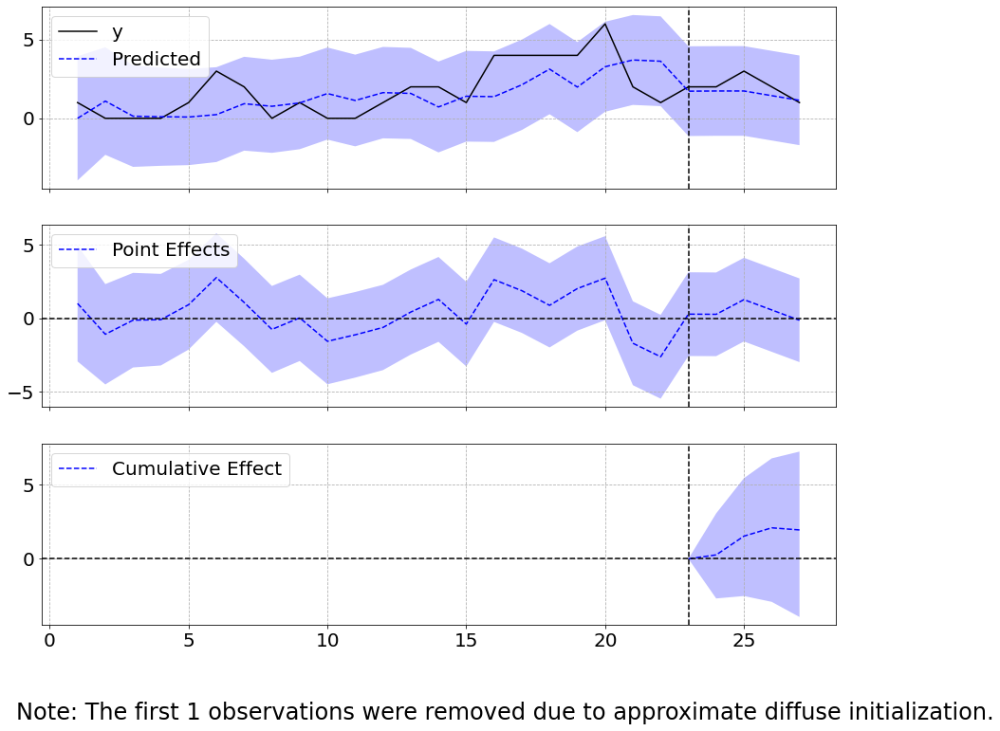



--------------------------------------------------------------------
Code = H52
Scipy computed Pearson r: -0.08918170529536364 and p-value: 0.6785786349763285
Causal Impact p-value = 0.22777222777222778
counts in post = 15


sigma2.irregular    1.032888
sigma2.level        0.000144
beta.covariate     -0.090338
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.25               17.0
Prediction (s.d.)         2.97 (1.58)        11.89 (6.32)
95% CI                    [-0.03, 6.17]      [-0.12, 24.66]

Absolute effect (s.d.)    1.28 (1.58)        5.11 (6.32)
95% CI                    [-1.92, 4.28]      [-7.66, 17.12]

Relative effect (s.d.)    43.03% (53.19%)    43.03% (53.19%)
95% CI                    [-64.48%, 144.01%] [-64.48%, 144.01%]

Posterior tail-area probability p: 0.23
Posterior prob. of a causal effect: 77.22%

For more details run the command: print(impact.summary('report'))
Analysis report 

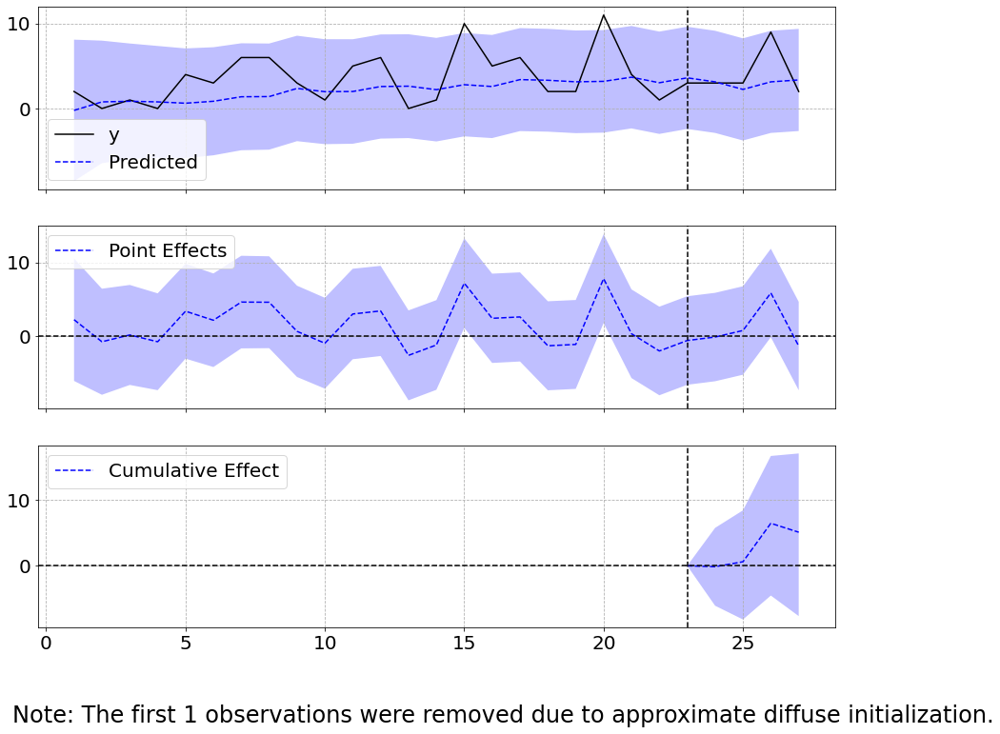



--------------------------------------------------------------------
Code = H60
Scipy computed Pearson r: 0.30446326391295025 and p-value: 0.1480261784525508
Causal Impact p-value = 0.03196803196803197
counts in post = 6

Significant without Bonferroni correction

sigma2.irregular    0.946456
sigma2.level        0.000069
beta.covariate      0.303913
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.75               7.0
Prediction (s.d.)         0.7 (0.56)         2.79 (2.26)
95% CI                    [-0.4, 1.81]       [-1.6, 7.25]

Absolute effect (s.d.)    1.05 (0.56)        4.21 (2.26)
95% CI                    [-0.06, 2.15]      [-0.25, 8.6]

Relative effect (s.d.)    150.81% (80.93%)   150.81% (80.93%)
95% CI                    [-9.09%, 308.16%]  [-9.09%, 308.16%]

Posterior tail-area probability p: 0.03
Posterior prob. of a causal effect: 96.8%

For more details run the command: print(impact.su

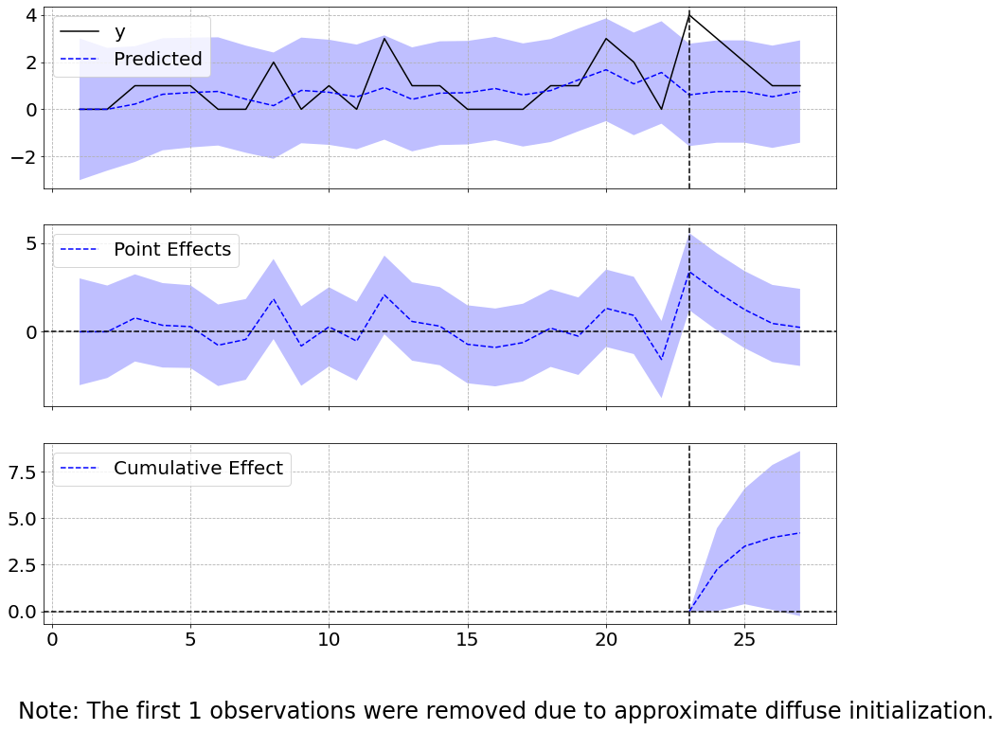



--------------------------------------------------------------------
Code = H61
Scipy computed Pearson r: 0.5769692553098187 and p-value: 0.00316039680291341
Causal Impact p-value = 0.0989010989010989
counts in post = 6


sigma2.irregular    0.688858
sigma2.level        0.000144
beta.covariate      0.574612
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.5                6.0
Prediction (s.d.)         2.12 (0.48)        8.48 (1.91)
95% CI                    [1.21, 3.08]       [4.83, 12.33]

Absolute effect (s.d.)    -0.62 (0.48)       -2.48 (1.91)
95% CI                    [-1.58, 0.29]      [-6.33, 1.17]

Relative effect (s.d.)    -29.22% (22.57%)   -29.22% (22.57%)
95% CI                    [-74.69%, 13.79%]  [-74.69%, 13.79%]

Posterior tail-area probability p: 0.1
Posterior prob. of a causal effect: 90.11%

For more details run the command: print(impact.summary('report'))
Analysis report {Causal

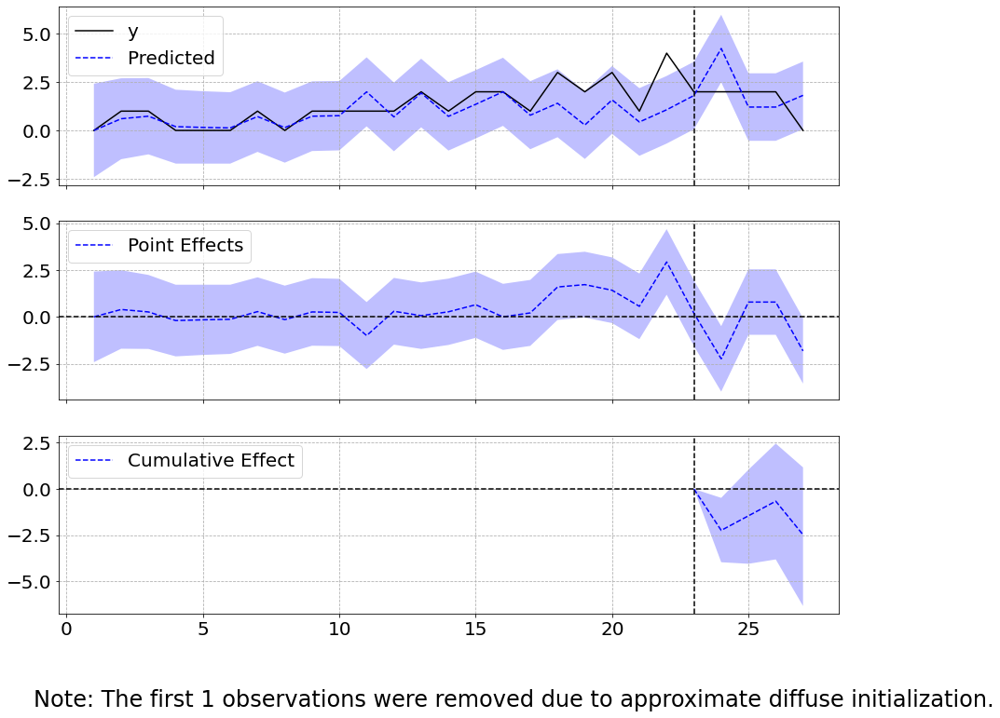



--------------------------------------------------------------------
Code = H65
Scipy computed Pearson r: 0.527021956265855 and p-value: 0.008141380676617236
Causal Impact p-value = 0.17782217782217782
counts in post = 7


sigma2.irregular    0.752170
sigma2.level        0.000144
beta.covariate      0.525357
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         2.91 (0.98)        11.65 (3.9)
95% CI                    [1.15, 4.97]       [4.59, 19.88]

Absolute effect (s.d.)    -0.91 (0.98)       -3.65 (3.9)
95% CI                    [-2.97, 0.85]      [-11.88, 3.41]

Relative effect (s.d.)    -31.31% (33.5%)    -31.31% (33.5%)
95% CI                    [-102.03%, 29.29%] [-102.03%, 29.29%]

Posterior tail-area probability p: 0.18
Posterior prob. of a causal effect: 82.22%

For more details run the command: print(impact.summary('report'))
Analysis report {Caus

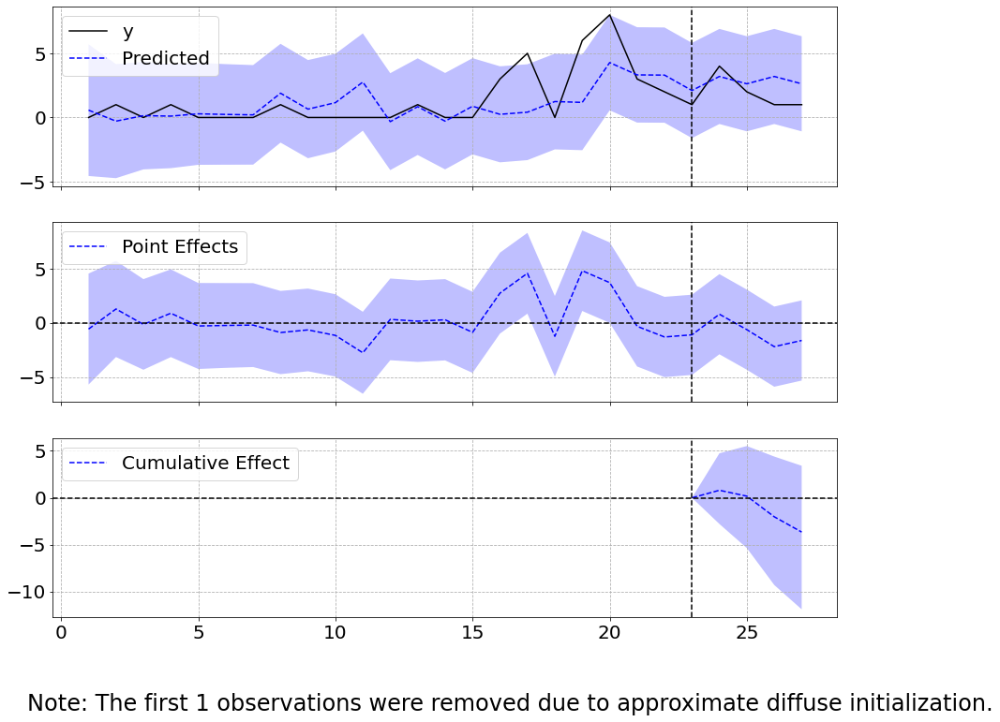



--------------------------------------------------------------------
Code = H66
Scipy computed Pearson r: 0.6837797595505554 and p-value: 0.00022970311142392664
Causal Impact p-value = 0.23876123876123875
counts in post = 7


sigma2.irregular    0.552829
sigma2.level        0.000144
beta.covariate      0.680384
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         2.62 (0.87)        10.46 (3.48)
95% CI                    [0.91, 4.32]       [3.64, 17.26]

Absolute effect (s.d.)    -0.62 (0.87)       -2.46 (3.48)
95% CI                    [-2.32, 1.09]      [-9.26, 4.36]

Relative effect (s.d.)    -23.54% (33.22%)   -23.54% (33.22%)
95% CI                    [-88.52%, 41.68%]  [-88.52%, 41.68%]

Posterior tail-area probability p: 0.24
Posterior prob. of a causal effect: 76.12%

For more details run the command: print(impact.summary('report'))
Analysis report {

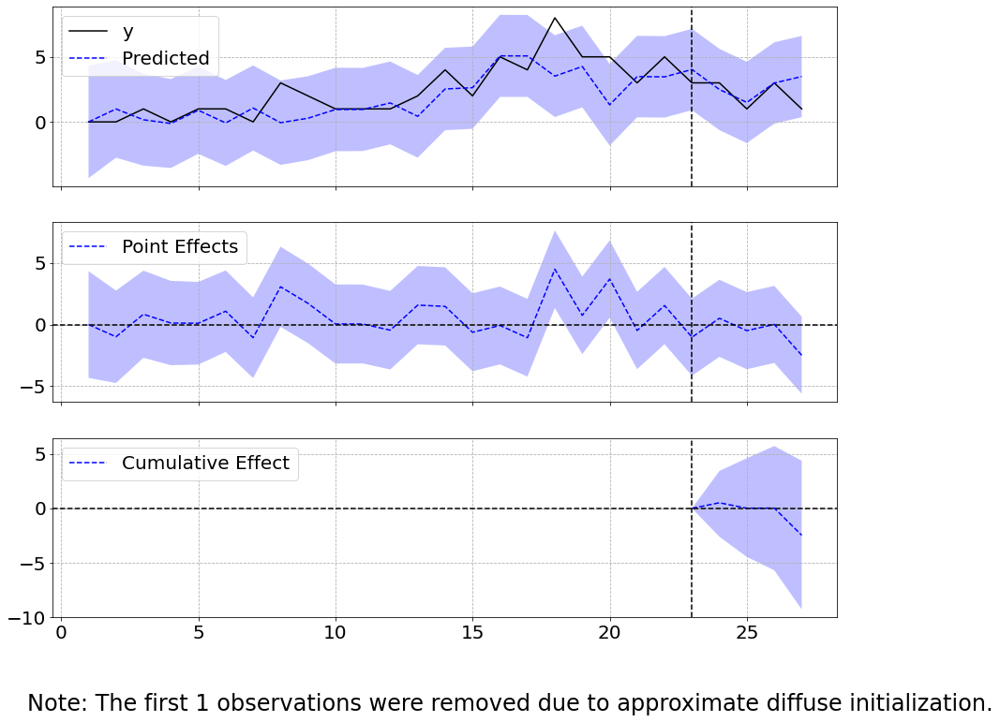



--------------------------------------------------------------------
Code = H81
Scipy computed Pearson r: 0.4872941571738371 and p-value: 0.015726831623124847
Causal Impact p-value = 0.0
counts in post = 8

Passes Bonferroni

sigma2.irregular    0.795789
sigma2.level        0.000069
beta.covariate      0.487217
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         0.54 (0.43)        2.17 (1.74)
95% CI                    [-0.32, 1.38]      [-1.27, 5.53]

Absolute effect (s.d.)    1.46 (0.43)        5.83 (1.74)
95% CI                    [0.62, 2.32]       [2.47, 9.27]

Relative effect (s.d.)    269.31% (80.13%)   269.31% (80.13%)
95% CI                    [114.08%, 428.17%] [114.08%, 428.17%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {Cau

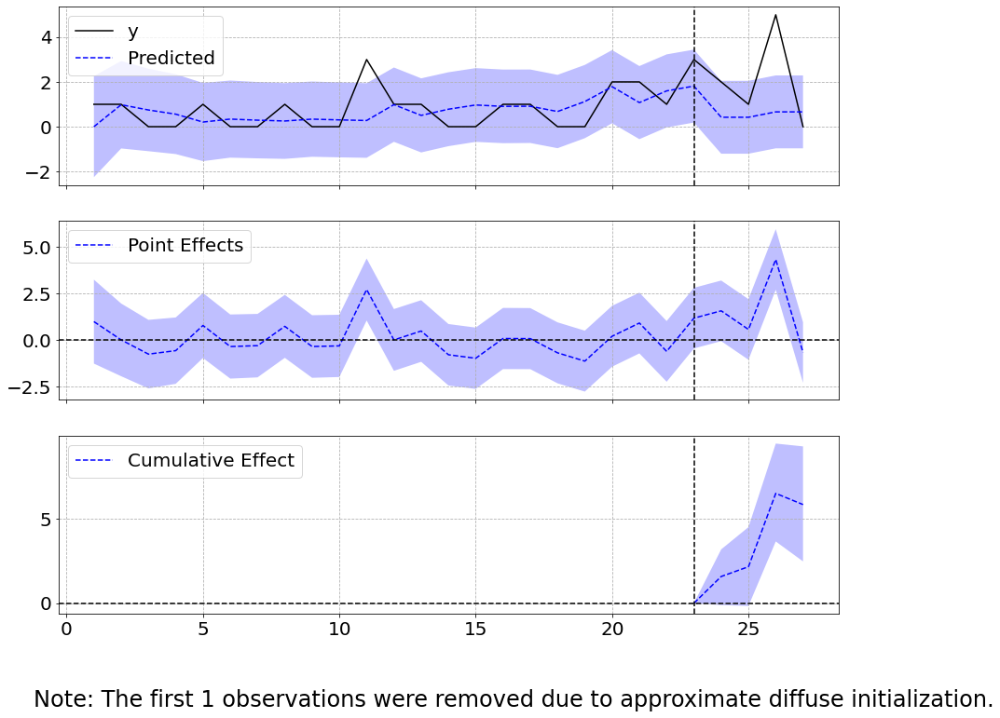



--------------------------------------------------------------------
Code = I10
Scipy computed Pearson r: 0.41697717752439356 and p-value: 0.04265070819627252
Causal Impact p-value = 0.45054945054945056
counts in post = 33


sigma2.irregular    0.860823
sigma2.level        0.000144
beta.covariate      0.415412
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    9.5                38.0
Prediction (s.d.)         9.76 (2.38)        39.06 (9.53)
95% CI                    [5.1, 14.44]       [20.41, 57.75]

Absolute effect (s.d.)    -0.26 (2.38)       -1.06 (9.53)
95% CI                    [-4.94, 4.4]       [-19.75, 17.59]

Relative effect (s.d.)    -2.71% (24.39%)    -2.71% (24.39%)
95% CI                    [-50.58%, 45.03%]  [-50.58%, 45.03%]

Posterior tail-area probability p: 0.45
Posterior prob. of a causal effect: 54.95%

For more details run the command: print(impact.summary('report'))
Analysis report

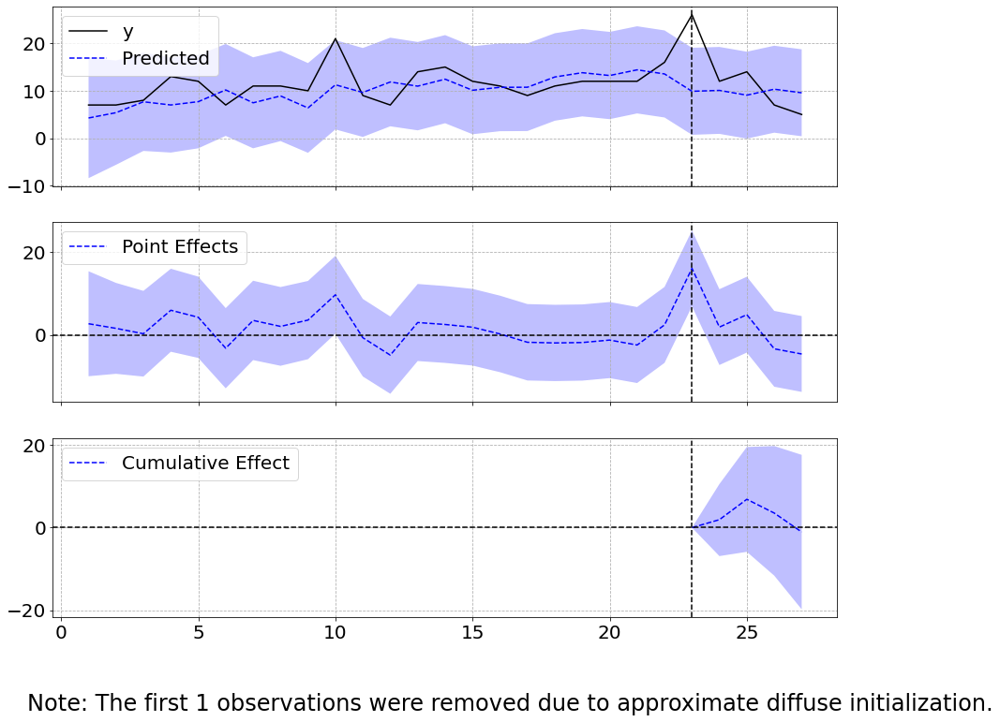



--------------------------------------------------------------------
Code = J00
Scipy computed Pearson r: 0.4581897949526568 and p-value: 0.02434314255012738
Causal Impact p-value = 0.06393606393606394
counts in post = 7


sigma2.irregular    0.824161
sigma2.level        0.000069
beta.covariate      0.457829
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         1.28 (0.78)        5.13 (3.14)
95% CI                    [-0.26, 2.82]      [-1.03, 11.26]

Absolute effect (s.d.)    1.22 (0.78)        4.87 (3.14)
95% CI                    [-0.32, 2.76]      [-1.26, 11.03]

Relative effect (s.d.)    94.86% (61.09%)    94.86% (61.09%)
95% CI                    [-24.61%, 214.85%] [-24.61%, 214.85%]

Posterior tail-area probability p: 0.06
Posterior prob. of a causal effect: 93.61%

For more details run the command: print(impact.summary('report'))
Analysis report {Ca

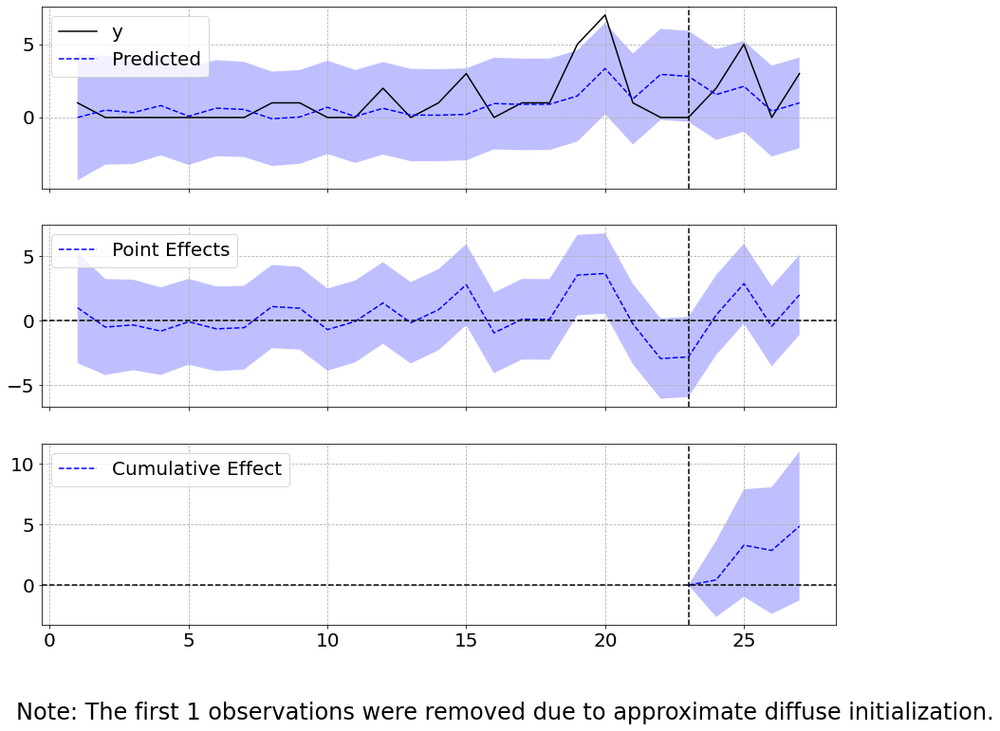



--------------------------------------------------------------------
Code = J02
Scipy computed Pearson r: 0.6749473091099105 and p-value: 0.0002967890453447699
Causal Impact p-value = 0.4405594405594406
counts in post = 13


sigma2.irregular    0.566096
sigma2.level        0.000144
beta.covariate      0.671894
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.5                18.0
Prediction (s.d.)         4.71 (1.56)        18.86 (6.23)
95% CI                    [1.8, 7.91]        [7.21, 31.63]

Absolute effect (s.d.)    -0.21 (1.56)       -0.86 (6.23)
95% CI                    [-3.41, 2.7]       [-13.63, 10.79]

Relative effect (s.d.)    -4.54% (33.04%)    -4.54% (33.04%)
95% CI                    [-72.29%, 57.23%]  [-72.29%, 57.23%]

Posterior tail-area probability p: 0.44
Posterior prob. of a causal effect: 55.94%

For more details run the command: print(impact.summary('report'))
Analysis report 

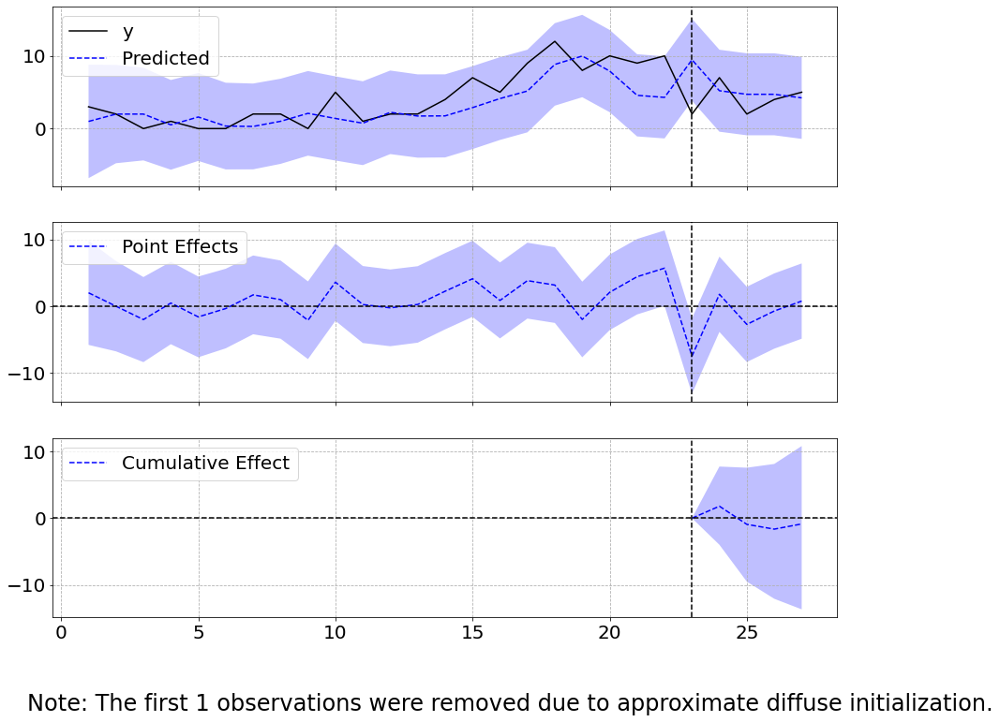



--------------------------------------------------------------------
Code = J06
Scipy computed Pearson r: 0.695716522975182 and p-value: 0.00016020474134049762
Causal Impact p-value = 0.35864135864135865
counts in post = 15


sigma2.irregular    0.536937
sigma2.level        0.000144
beta.covariate      0.692858
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    5.25               21.0
Prediction (s.d.)         4.4 (2.24)         17.61 (8.95)
95% CI                    [0.0, 8.78]        [0.02, 35.1]

Absolute effect (s.d.)    0.85 (2.24)        3.39 (8.95)
95% CI                    [-3.53, 5.25]      [-14.1, 20.98]

Relative effect (s.d.)    19.28% (50.84%)    19.28% (50.84%)
95% CI                    [-80.1%, 119.18%]  [-80.1%, 119.18%]

Posterior tail-area probability p: 0.36
Posterior prob. of a causal effect: 64.14%

For more details run the command: print(impact.summary('report'))
Analysis report {C

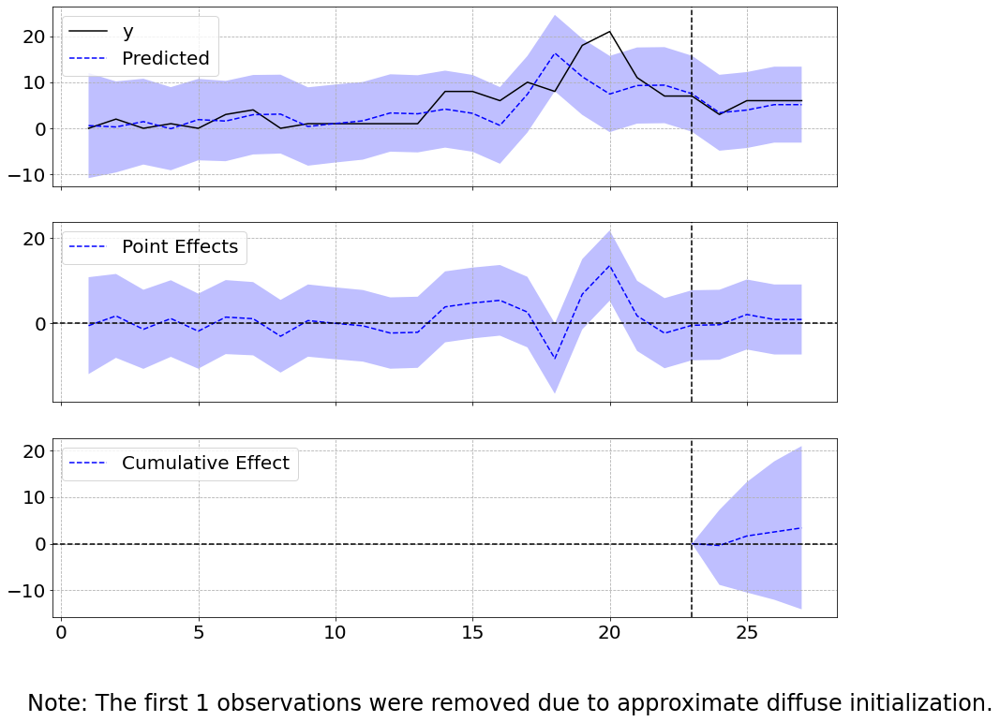



--------------------------------------------------------------------
Code = J30
Scipy computed Pearson r: 0.5589822744541332 and p-value: 0.004518578211044701
Causal Impact p-value = 0.35264735264735264
counts in post = 29


sigma2.irregular    0.717391
sigma2.level        0.000069
beta.covariate      0.558437
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    7.75               31.0
Prediction (s.d.)         7.04 (1.9)         28.16 (7.59)
95% CI                    [3.18, 10.62]      [12.72, 42.46]

Absolute effect (s.d.)    0.71 (1.9)         2.84 (7.59)
95% CI                    [-2.87, 4.57]      [-11.46, 18.28]

Relative effect (s.d.)    10.1% (26.94%)     10.1% (26.94%)
95% CI                    [-40.7%, 64.91%]   [-40.7%, 64.91%]

Posterior tail-area probability p: 0.35
Posterior prob. of a causal effect: 64.74%

For more details run the command: print(impact.summary('report'))
Analysis report {C

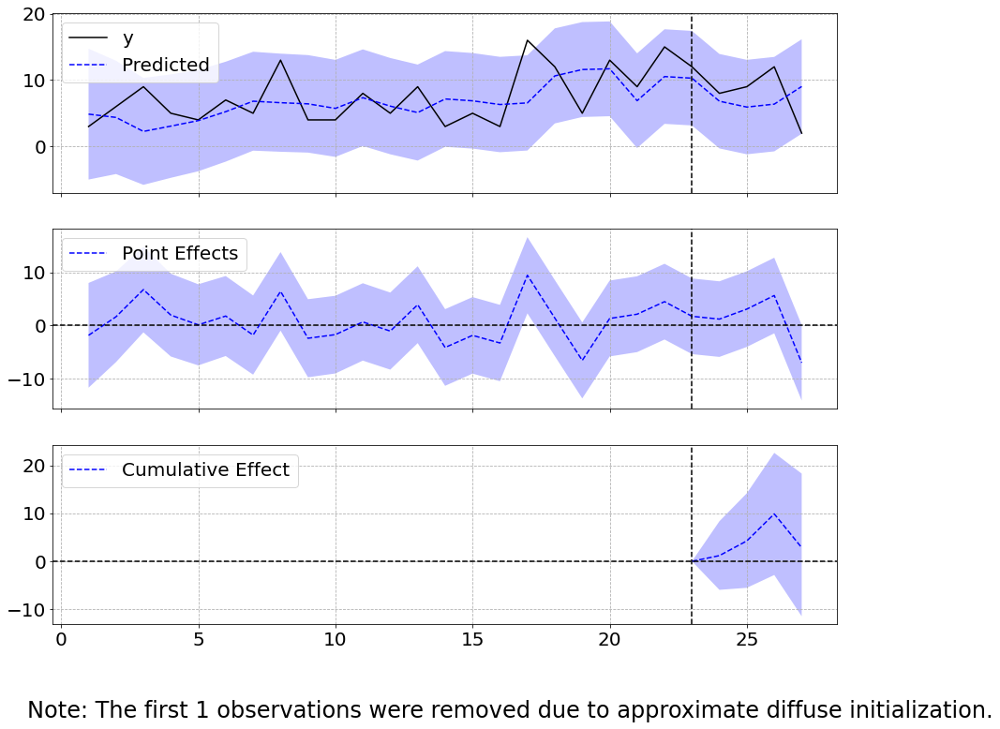



--------------------------------------------------------------------
Code = J45
Scipy computed Pearson r: 0.6348147175541483 and p-value: 0.0008613326877345512
Causal Impact p-value = 0.3256743256743257
counts in post = 18


sigma2.irregular    0.620571
sigma2.level        0.000144
beta.covariate      0.631510
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    6.25               25.0
Prediction (s.d.)         5.71 (1.12)        22.83 (4.49)
95% CI                    [3.53, 7.92]       [14.11, 31.69]

Absolute effect (s.d.)    0.54 (1.12)        2.17 (4.49)
95% CI                    [-1.67, 2.72]      [-6.69, 10.89]

Relative effect (s.d.)    9.5% (19.65%)      9.5% (19.65%)
95% CI                    [-29.32%, 47.7%]   [-29.32%, 47.7%]

Posterior tail-area probability p: 0.33
Posterior prob. of a causal effect: 67.43%

For more details run the command: print(impact.summary('report'))
Analysis report {Cau

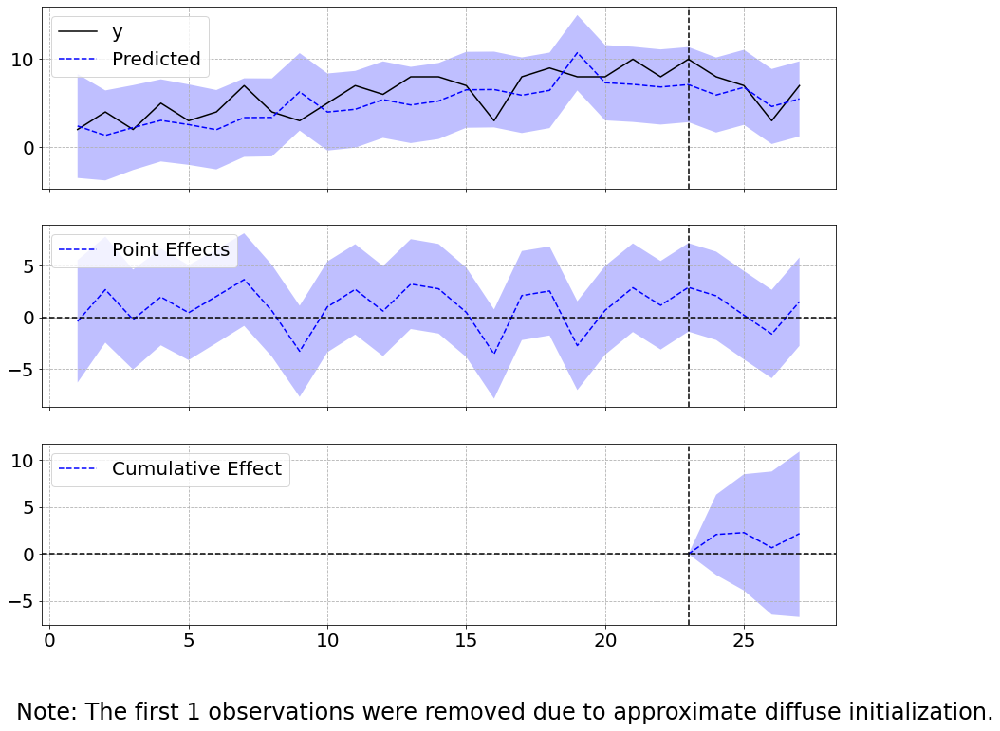



--------------------------------------------------------------------
Code = K21
Scipy computed Pearson r: 0.4354285818048942 and p-value: 0.03344420385428556
Causal Impact p-value = 0.34265734265734266
counts in post = 17


sigma2.irregular    0.844102
sigma2.level        0.000144
beta.covariate      0.434300
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    5.5                22.0
Prediction (s.d.)         4.97 (1.39)        19.89 (5.54)
95% CI                    [2.15, 7.59]       [8.61, 30.35]

Absolute effect (s.d.)    0.53 (1.39)        2.11 (5.54)
95% CI                    [-2.09, 3.35]      [-8.35, 13.39]

Relative effect (s.d.)    10.59% (27.87%)    10.59% (27.87%)
95% CI                    [-41.97%, 67.29%]  [-41.97%, 67.29%]

Posterior tail-area probability p: 0.34
Posterior prob. of a causal effect: 65.73%

For more details run the command: print(impact.summary('report'))
Analysis report {Ca

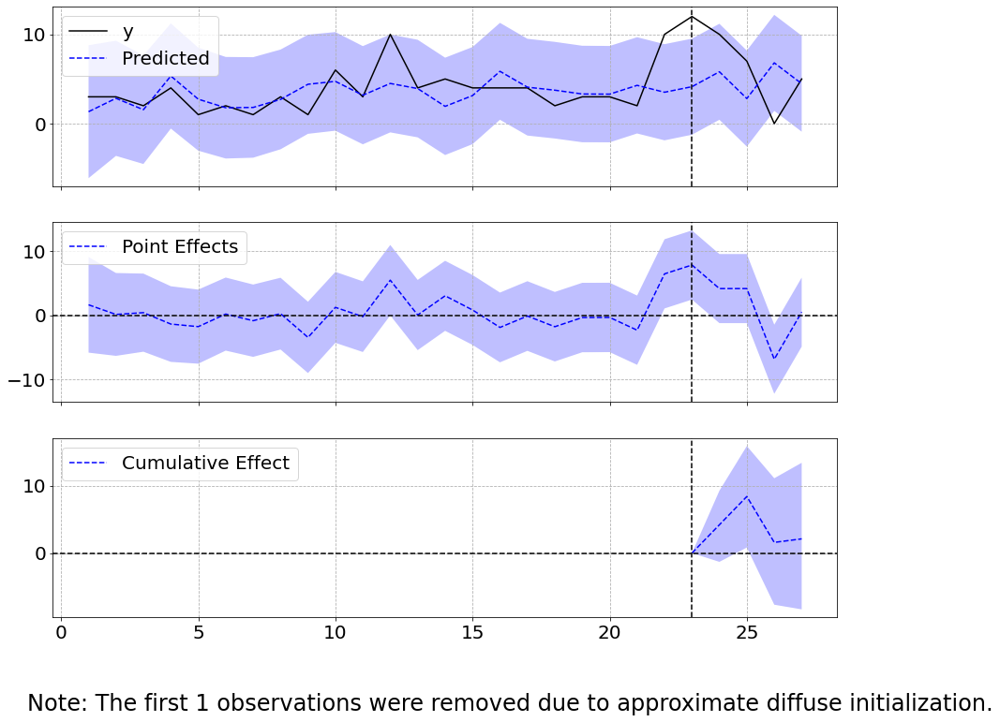



--------------------------------------------------------------------
Code = K29
Scipy computed Pearson r: 0.2215833717732604 and p-value: 0.29806608624147063
Causal Impact p-value = 0.16683316683316685
counts in post = 8


sigma2.irregular    0.990233
sigma2.level        0.000144
beta.covariate      0.221096
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.25               13.0
Prediction (s.d.)         2.4 (0.82)         9.6 (3.3)
95% CI                    [0.73, 3.96]       [2.91, 15.83]

Absolute effect (s.d.)    0.85 (0.82)        3.4 (3.3)
95% CI                    [-0.71, 2.52]      [-2.83, 10.09]

Relative effect (s.d.)    35.44% (34.35%)    35.44% (34.35%)
95% CI                    [-29.53%, 105.13%] [-29.53%, 105.13%]

Posterior tail-area probability p: 0.17
Posterior prob. of a causal effect: 83.32%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

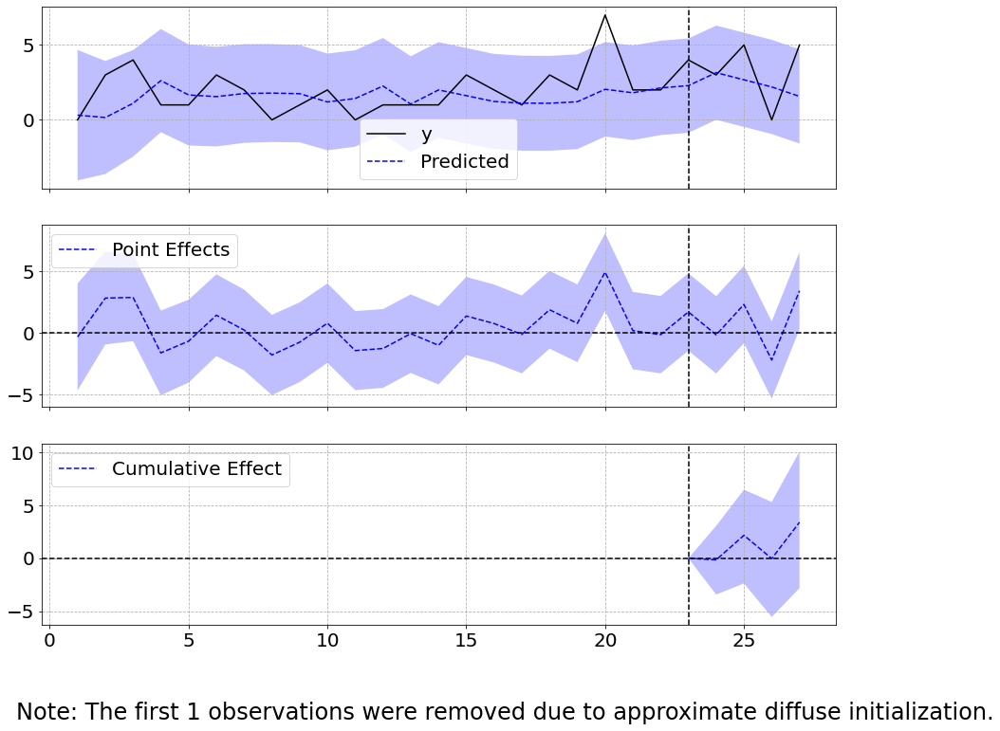



--------------------------------------------------------------------
Code = K59
Scipy computed Pearson r: 0.4236985628374234 and p-value: 0.03909112194346739
Causal Impact p-value = 0.46853146853146854
counts in post = 14


sigma2.irregular    0.853603
sigma2.level        0.000144
beta.covariate      0.422688
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.0                16.0
Prediction (s.d.)         4.03 (1.06)        16.12 (4.23)
95% CI                    [2.0, 6.15]        [8.02, 24.61]

Absolute effect (s.d.)    -0.03 (1.06)       -0.12 (4.23)
95% CI                    [-2.15, 2.0]       [-8.61, 7.98]

Relative effect (s.d.)    -0.73% (26.26%)    -0.73% (26.26%)
95% CI                    [-53.41%, 49.54%]  [-53.41%, 49.54%]

Posterior tail-area probability p: 0.47
Posterior prob. of a causal effect: 53.15%

For more details run the command: print(impact.summary('report'))
Analysis report {Ca

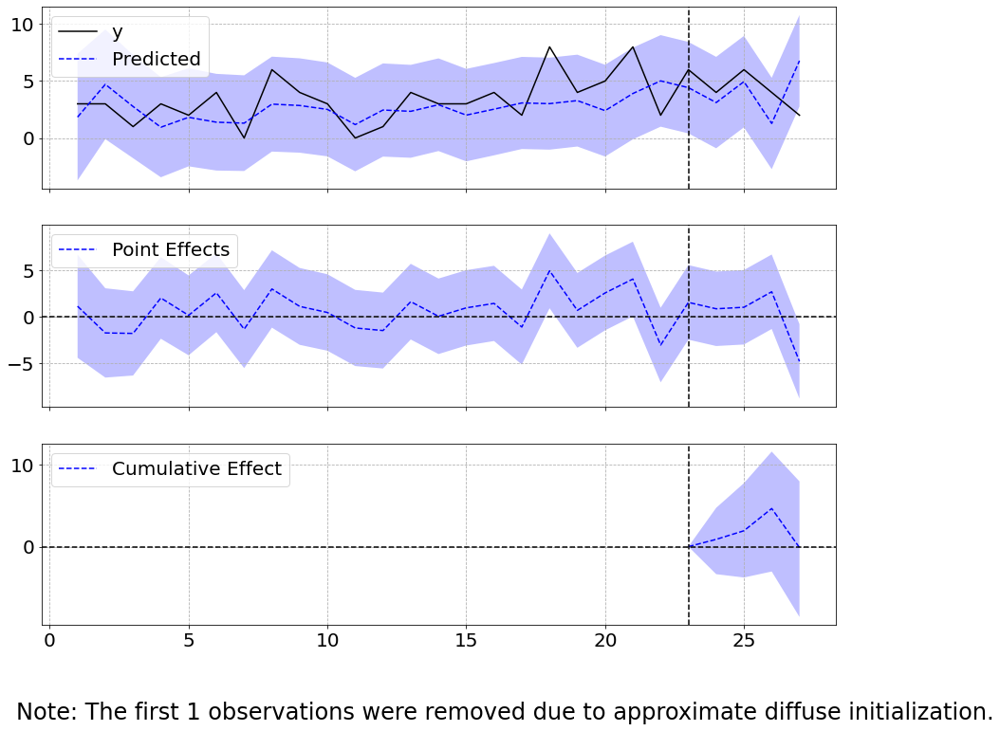



--------------------------------------------------------------------
Code = L03
Scipy computed Pearson r: 0.3259073154822013 and p-value: 0.12014526824035826
Causal Impact p-value = 0.001998001998001998
counts in post = 6

Significant without Bonferroni correction

sigma2.irregular    0.927896
sigma2.level        0.000144
beta.covariate      0.323597
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.5                6.0
Prediction (s.d.)         0.5 (0.32)         1.99 (1.3)
95% CI                    [-0.12, 1.15]      [-0.46, 4.61]

Absolute effect (s.d.)    1.0 (0.32)         4.01 (1.3)
95% CI                    [0.35, 1.62]       [1.39, 6.46]

Relative effect (s.d.)    201.46% (65.08%)   201.46% (65.08%)
95% CI                    [69.65%, 324.76%]  [69.65%, 324.76%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.8%

For more details run the command: print(impact.sum

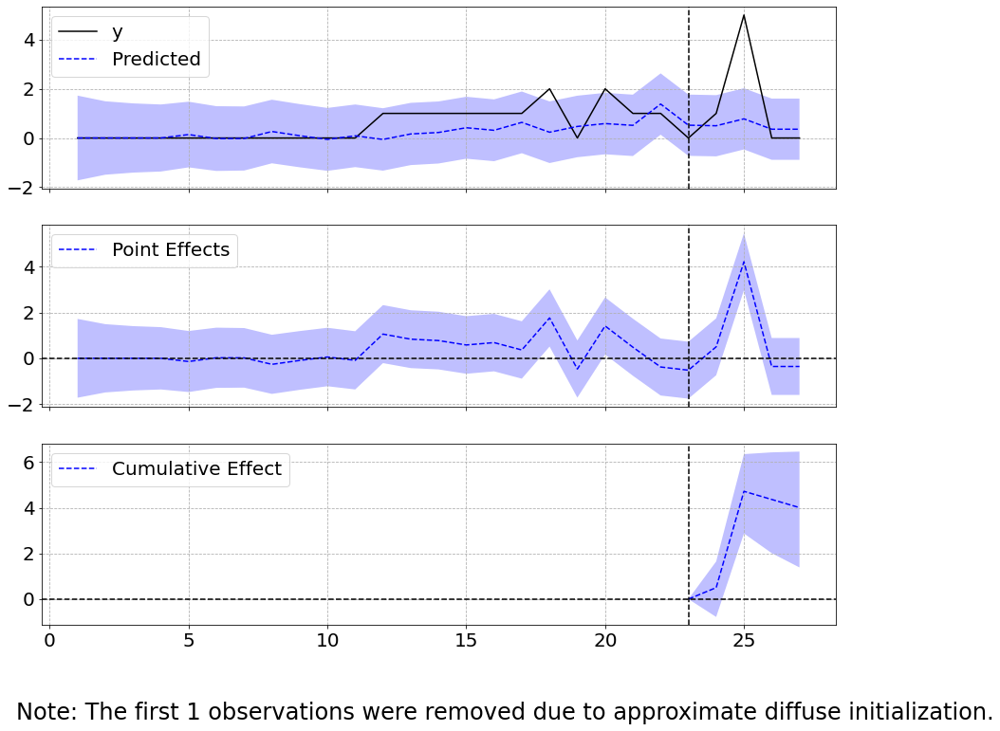



--------------------------------------------------------------------
Code = L20
Scipy computed Pearson r: 0.2882654717871549 and p-value: 0.1719317503608597
Causal Impact p-value = 0.24675324675324675
counts in post = 6


sigma2.irregular    0.955409
sigma2.level        0.000144
beta.covariate      0.287069
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.75               7.0
Prediction (s.d.)         2.38 (0.83)        9.52 (3.31)
95% CI                    [0.7, 3.95]        [2.8, 15.79]

Absolute effect (s.d.)    -0.63 (0.83)       -2.52 (3.31)
95% CI                    [-2.2, 1.05]       [-8.79, 4.2]

Relative effect (s.d.)    -26.49% (34.8%)    -26.49% (34.8%)
95% CI                    [-92.32%, 44.07%]  [-92.32%, 44.07%]

Posterior tail-area probability p: 0.25
Posterior prob. of a causal effect: 75.32%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalIm

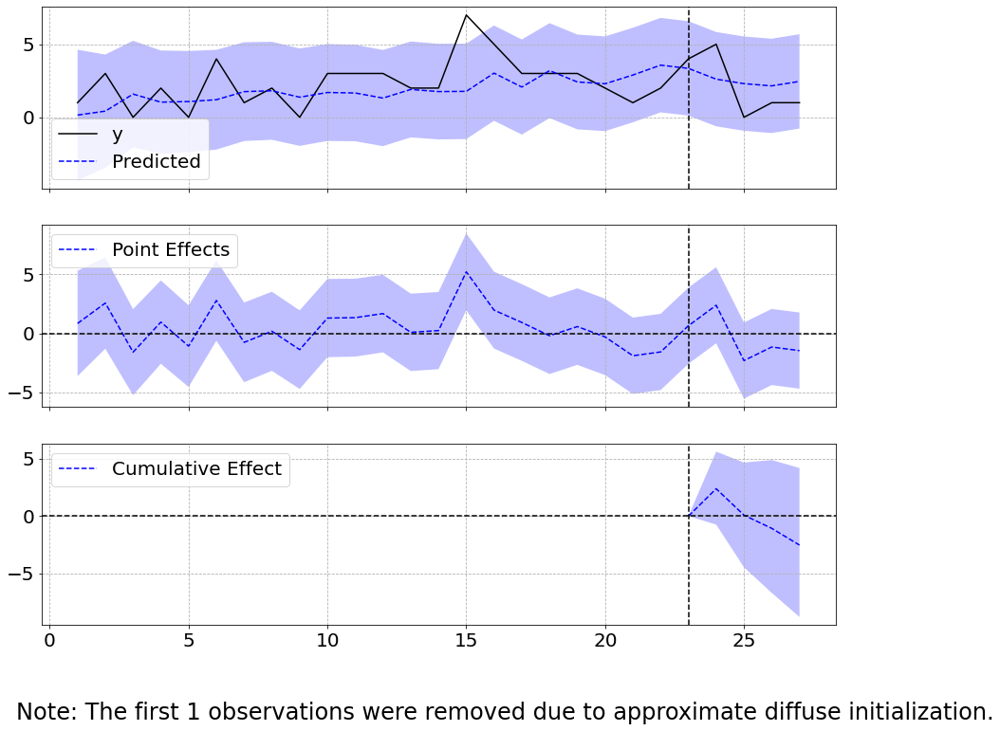



--------------------------------------------------------------------
Code = L30
Scipy computed Pearson r: 0.13828549459929326 and p-value: 0.5193160294035513
Causal Impact p-value = 0.4225774225774226
counts in post = 7


sigma2.irregular    1.014138
sigma2.level        0.000144
beta.covariate      0.136625
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         2.29 (0.93)        9.17 (3.73)
95% CI                    [0.44, 4.1]        [1.77, 16.38]

Absolute effect (s.d.)    0.21 (0.93)        0.83 (3.73)
95% CI                    [-1.6, 2.06]       [-6.38, 8.23]

Relative effect (s.d.)    8.99% (40.64%)     8.99% (40.64%)
95% CI                    [-69.54%, 89.75%]  [-69.54%, 89.75%]

Posterior tail-area probability p: 0.42
Posterior prob. of a causal effect: 57.74%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

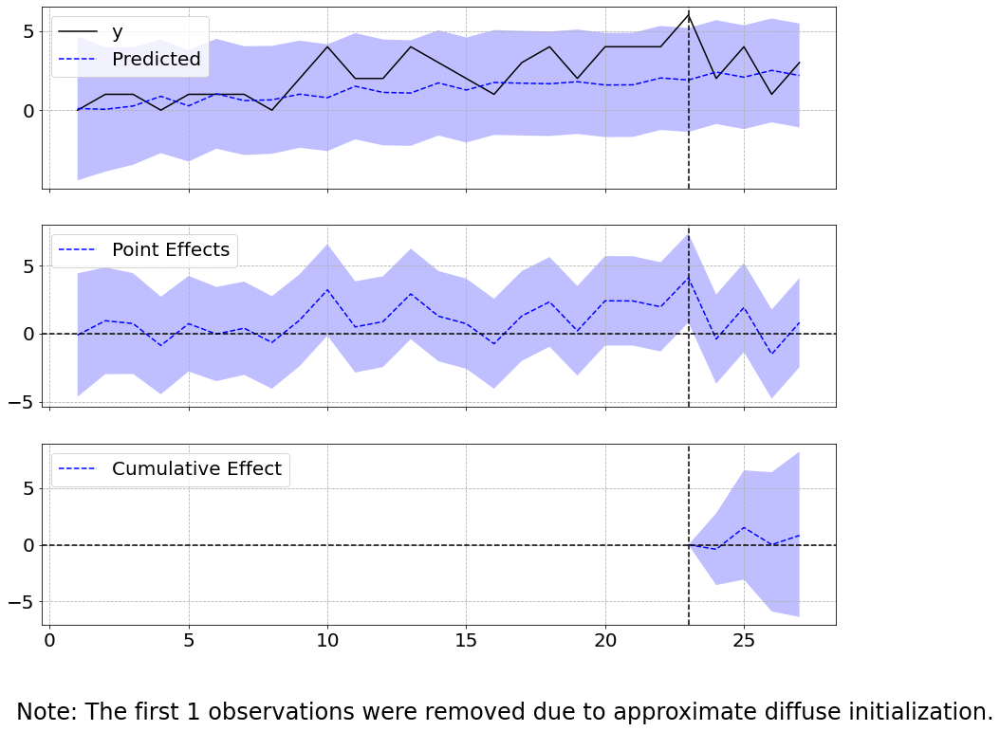



--------------------------------------------------------------------
Code = L65
Scipy computed Pearson r: 6.938893903907228e-18 and p-value: 1.0
Causal Impact p-value = 0.0
counts in post = 6

Passes Bonferroni

sigma2.irregular    1.043419
sigma2.level        0.000069
beta.covariate      0.000154
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.5                6.0
Prediction (s.d.)         0.25 (0.29)        1.0 (1.15)
95% CI                    [-0.33, 0.79]      [-1.33, 3.17]

Absolute effect (s.d.)    1.25 (0.29)        5.0 (1.15)
95% CI                    [0.71, 1.83]       [2.83, 7.33]

Relative effect (s.d.)    498.47% (114.59%)  498.47% (114.59%)
95% CI                    [281.82%, 730.99%] [281.82%, 730.99%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalImpact}


Du

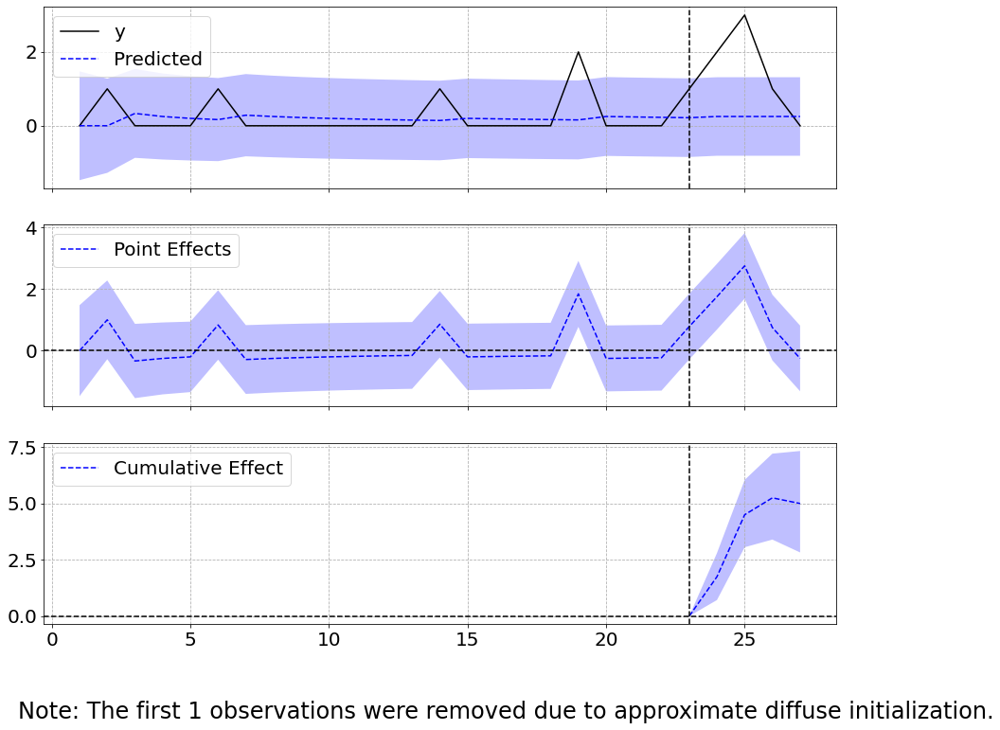



--------------------------------------------------------------------
Code = L73
Scipy computed Pearson r: 0.08565215702208559 and p-value: 0.6906739761401745
Causal Impact p-value = 0.0
counts in post = 8

Passes Bonferroni

sigma2.irregular    1.034633
sigma2.level        0.000144
beta.covariate      0.085093
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         0.38 (0.32)        1.53 (1.28)
95% CI                    [-0.24, 1.01]      [-0.94, 4.06]

Absolute effect (s.d.)    1.62 (0.32)        6.47 (1.28)
95% CI                    [0.99, 2.24]       [3.94, 8.94]

Relative effect (s.d.)    421.96% (83.22%)   421.96% (83.22%)
95% CI                    [257.1%, 583.31%]  [257.1%, 583.31%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {Causa

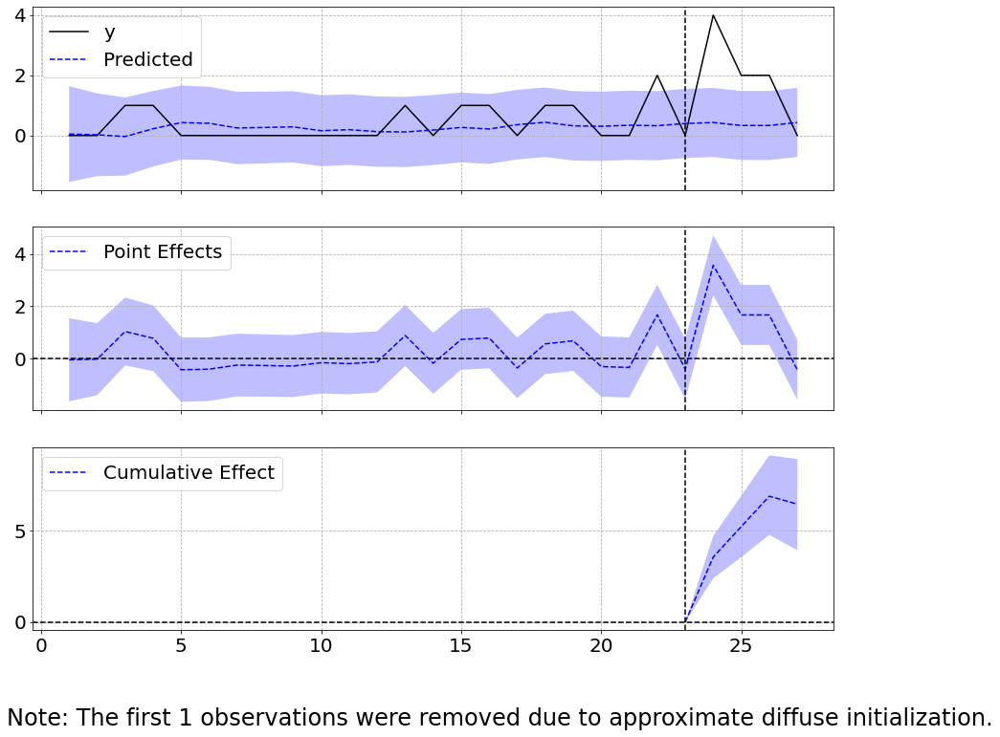



--------------------------------------------------------------------
Code = M25
Scipy computed Pearson r: 0.4490006576221165 and p-value: 0.02774106379421249
Causal Impact p-value = 0.33266733266733267
counts in post = 41


sigma2.irregular    0.830866
sigma2.level        0.000144
beta.covariate      0.447182
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    12.25              49.0
Prediction (s.d.)         11.34 (2.25)       45.36 (9.0)
95% CI                    [6.73, 15.56]      [26.94, 62.23]

Absolute effect (s.d.)    0.91 (2.25)        3.64 (9.0)
95% CI                    [-3.31, 5.52]      [-13.23, 22.06]

Relative effect (s.d.)    8.02% (19.85%)     8.02% (19.85%)
95% CI                    [-29.16%, 48.64%]  [-29.16%, 48.64%]

Posterior tail-area probability p: 0.33
Posterior prob. of a causal effect: 66.73%

For more details run the command: print(impact.summary('report'))
Analysis report {Cau

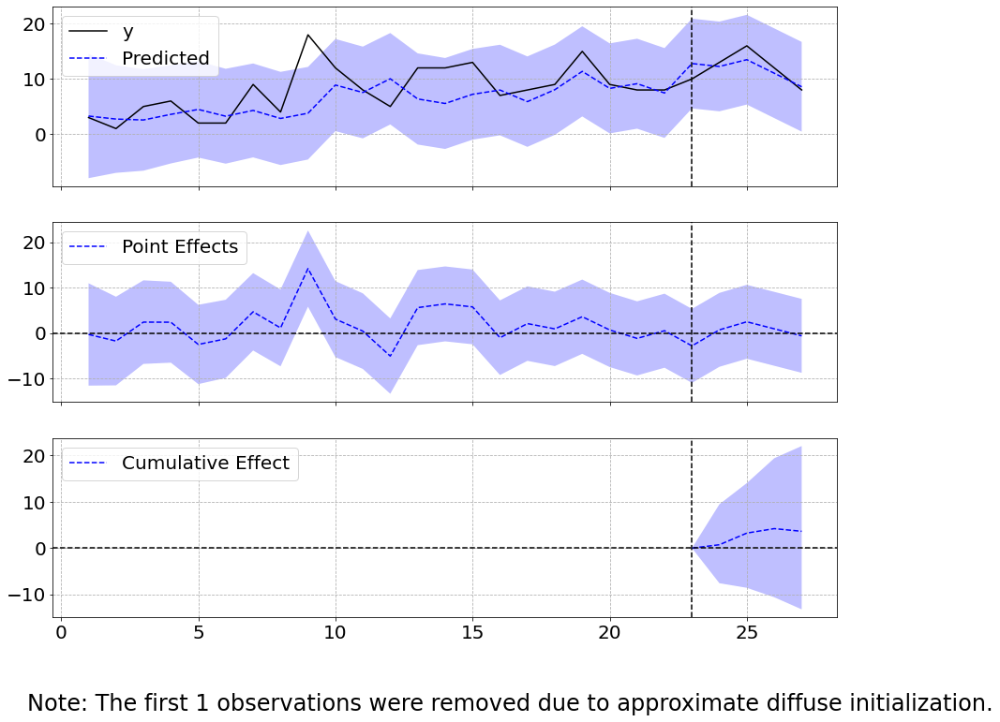



--------------------------------------------------------------------
Code = M54
Scipy computed Pearson r: 0.7169061879760223 and p-value: 8.090774112148194e-05
Causal Impact p-value = 0.0
counts in post = 36

Passes Bonferroni

sigma2.irregular    0.507071
sigma2.level        0.000069
beta.covariate      0.716429
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    12.0               48.0
Prediction (s.d.)         20.34 (2.02)       81.37 (8.1)
95% CI                    [16.54, 24.47]     [66.15, 97.89]

Absolute effect (s.d.)    -8.34 (2.02)       -33.37 (8.1)
95% CI                    [-12.47, -4.54]    [-49.89, -18.15]

Relative effect (s.d.)    -41.01% (9.95%)    -41.01% (9.95%)
95% CI                    [-61.31%, -22.3%]  [-61.31%, -22.3%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis repo

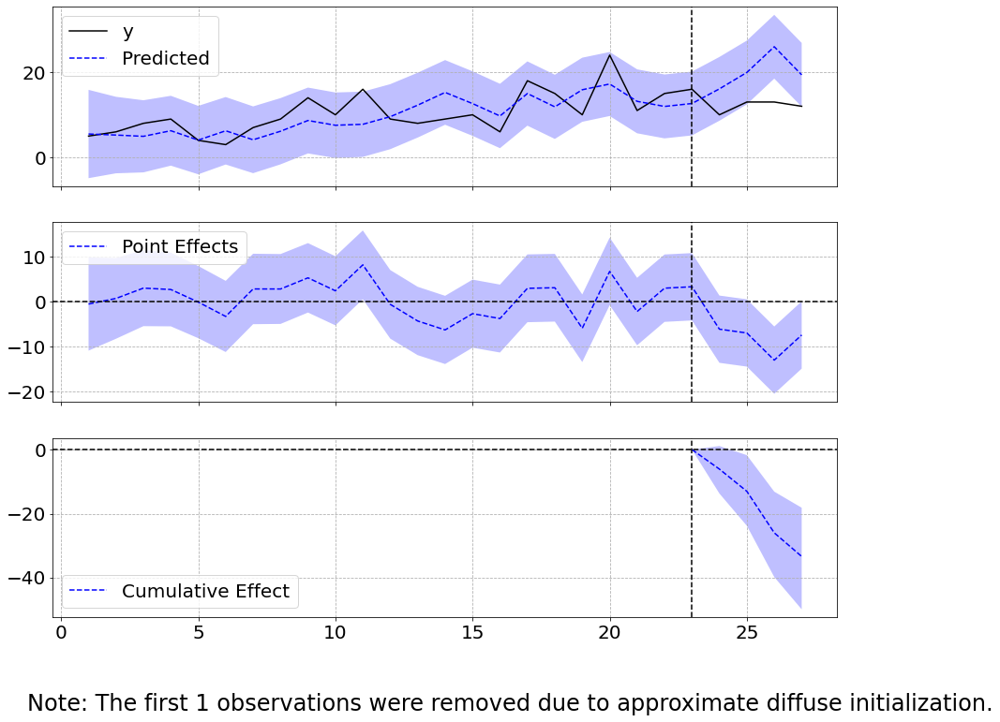



--------------------------------------------------------------------
Code = M79
Scipy computed Pearson r: 0.5127333873347213 and p-value: 0.010408035826448293
Causal Impact p-value = 0.4085914085914086
counts in post = 13


sigma2.irregular    0.769065
sigma2.level        0.000069
beta.covariate      0.512582
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.25               17.0
Prediction (s.d.)         3.97 (0.99)        15.89 (3.96)
95% CI                    [2.03, 5.91]       [8.13, 23.65]

Absolute effect (s.d.)    0.28 (0.99)        1.11 (3.96)
95% CI                    [-1.66, 2.22]      [-6.65, 8.87]

Relative effect (s.d.)    6.95% (24.92%)     6.95% (24.92%)
95% CI                    [-41.86%, 55.83%]  [-41.86%, 55.83%]

Posterior tail-area probability p: 0.41
Posterior prob. of a causal effect: 59.14%

For more details run the command: print(impact.summary('report'))
Analysis report {Caus

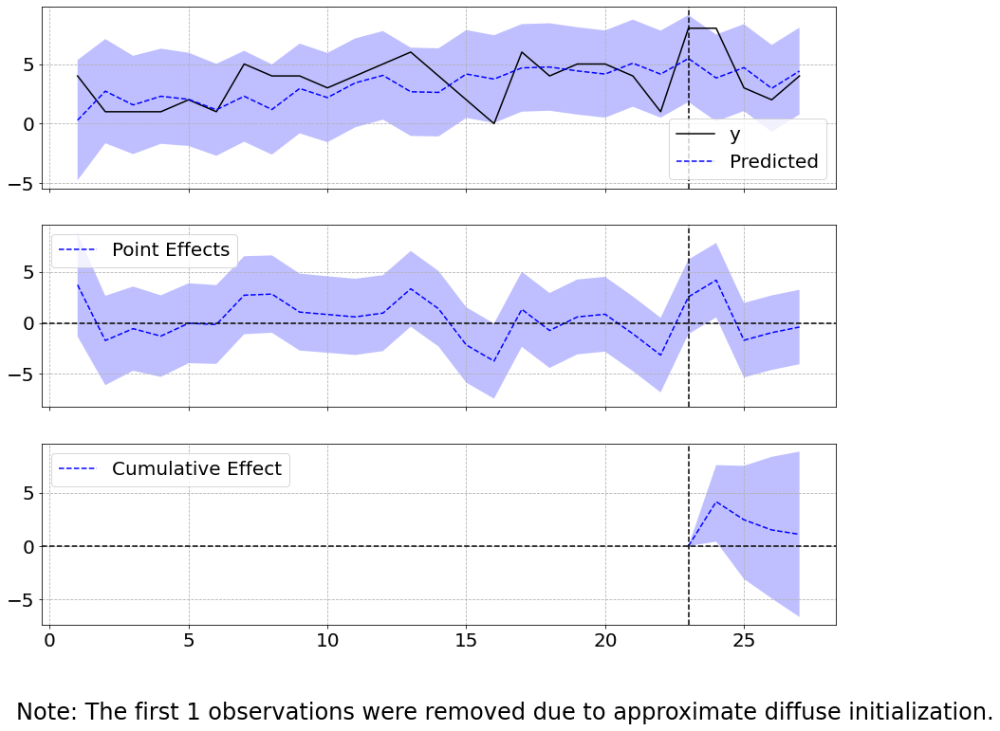



--------------------------------------------------------------------
Code = N39
Scipy computed Pearson r: 0.7316330050669827 and p-value: 4.852373732862798e-05
Causal Impact p-value = 0.02097902097902098
counts in post = 14

Significant without Bonferroni correction

sigma2.irregular    0.484929
sigma2.level        0.000069
beta.covariate      0.731016
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    5.0                20.0
Prediction (s.d.)         3.45 (0.78)        13.79 (3.1)
95% CI                    [1.91, 4.95]       [7.63, 19.8]

Absolute effect (s.d.)    1.55 (0.78)        6.21 (3.1)
95% CI                    [0.05, 3.09]       [0.2, 12.37]

Relative effect (s.d.)    44.98% (22.51%)    44.98% (22.51%)
95% CI                    [1.44%, 89.67%]    [1.44%, 89.67%]

Posterior tail-area probability p: 0.02
Posterior prob. of a causal effect: 97.9%

For more details run the command: print(impact.su

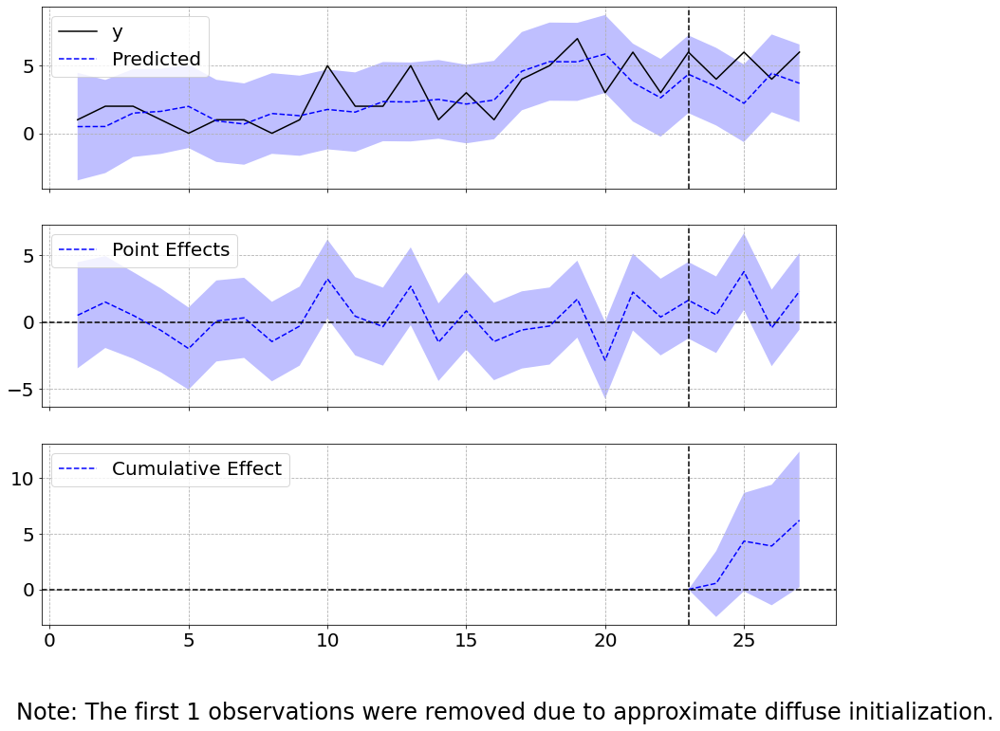



--------------------------------------------------------------------
Code = N52
Scipy computed Pearson r: -0.01990299603868008 and p-value: 0.9264533038744704
Causal Impact p-value = 0.0
counts in post = 11

Passes Bonferroni

sigma2.irregular    1.041461
sigma2.level        0.000144
beta.covariate     -0.019508
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.0                12.0
Prediction (s.d.)         0.54 (0.37)        2.15 (1.48)
95% CI                    [-0.22, 1.24]      [-0.86, 4.95]

Absolute effect (s.d.)    2.46 (0.37)        9.85 (1.48)
95% CI                    [1.76, 3.22]       [7.05, 12.86]

Relative effect (s.d.)    458.22% (69.02%)   458.22% (69.02%)
95% CI                    [327.83%, 598.37%] [327.83%, 598.37%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {

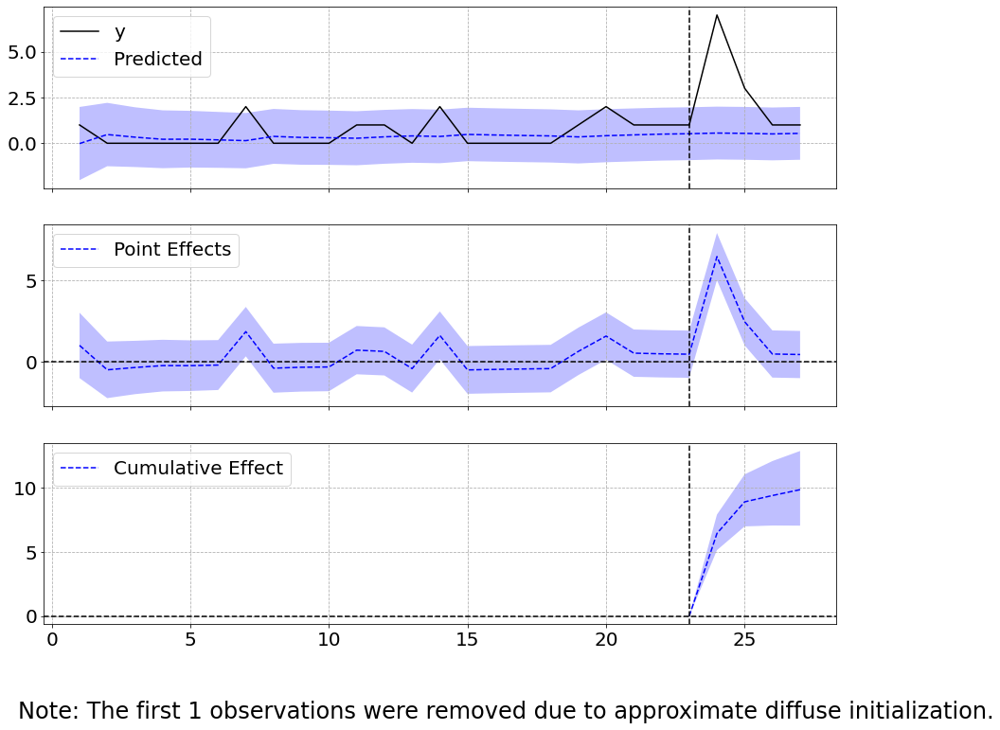



--------------------------------------------------------------------
Code = N64
Scipy computed Pearson r: 0.30314516752497855 and p-value: 0.14987801810265486
Causal Impact p-value = 0.4065934065934066
counts in post = 6


sigma2.irregular    0.946196
sigma2.level        0.000144
beta.covariate      0.301822
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.5                6.0
Prediction (s.d.)         1.65 (0.54)        6.59 (2.16)
95% CI                    [0.53, 2.65]       [2.14, 10.6]

Absolute effect (s.d.)    -0.15 (0.54)       -0.59 (2.16)
95% CI                    [-1.15, 0.97]      [-4.6, 3.86]

Relative effect (s.d.)    -9.01% (32.74%)    -9.01% (32.74%)
95% CI                    [-69.75%, 58.59%]  [-69.75%, 58.59%]

Posterior tail-area probability p: 0.41
Posterior prob. of a causal effect: 59.34%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

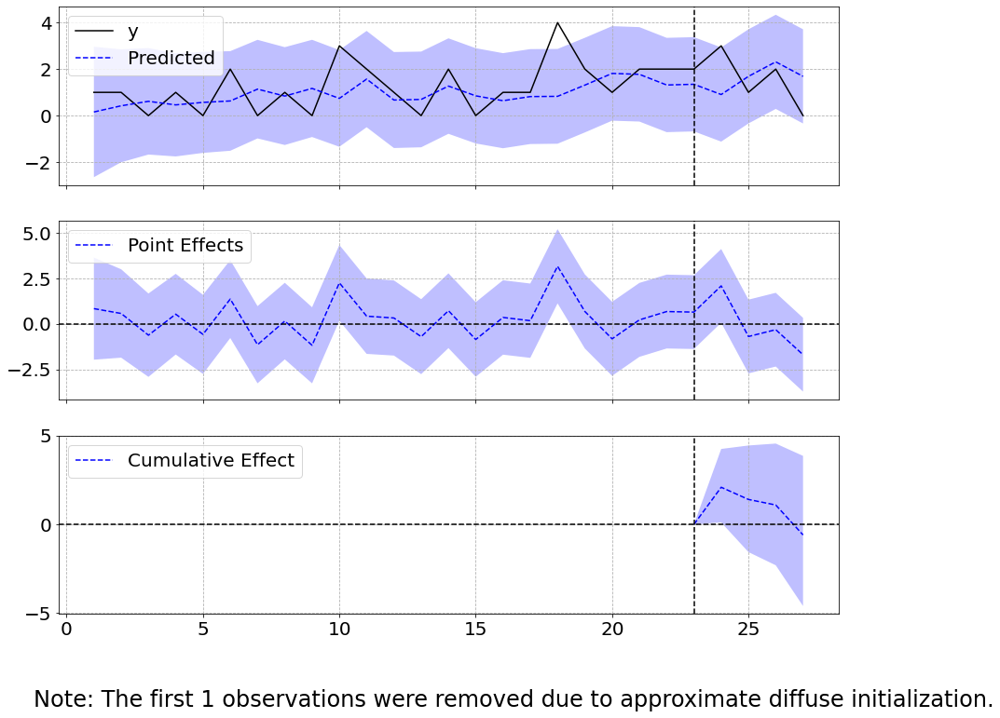



--------------------------------------------------------------------
Code = N76
Scipy computed Pearson r: 0.4974708841383207 and p-value: 0.013381367795127535
Causal Impact p-value = 0.11588411588411589
counts in post = 22


sigma2.irregular    0.780777
sigma2.level        0.000144
beta.covariate      0.494306
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    6.25               25.0
Prediction (s.d.)         5.02 (1.12)        20.07 (4.46)
95% CI                    [2.74, 7.12]       [10.97, 28.46]

Absolute effect (s.d.)    1.23 (1.12)        4.93 (4.46)
95% CI                    [-0.87, 3.51]      [-3.46, 14.03]

Relative effect (s.d.)    24.55% (22.22%)    24.55% (22.22%)
95% CI                    [-17.25%, 69.87%]  [-17.25%, 69.87%]

Posterior tail-area probability p: 0.12
Posterior prob. of a causal effect: 88.41%

For more details run the command: print(impact.summary('report'))
Analysis report {

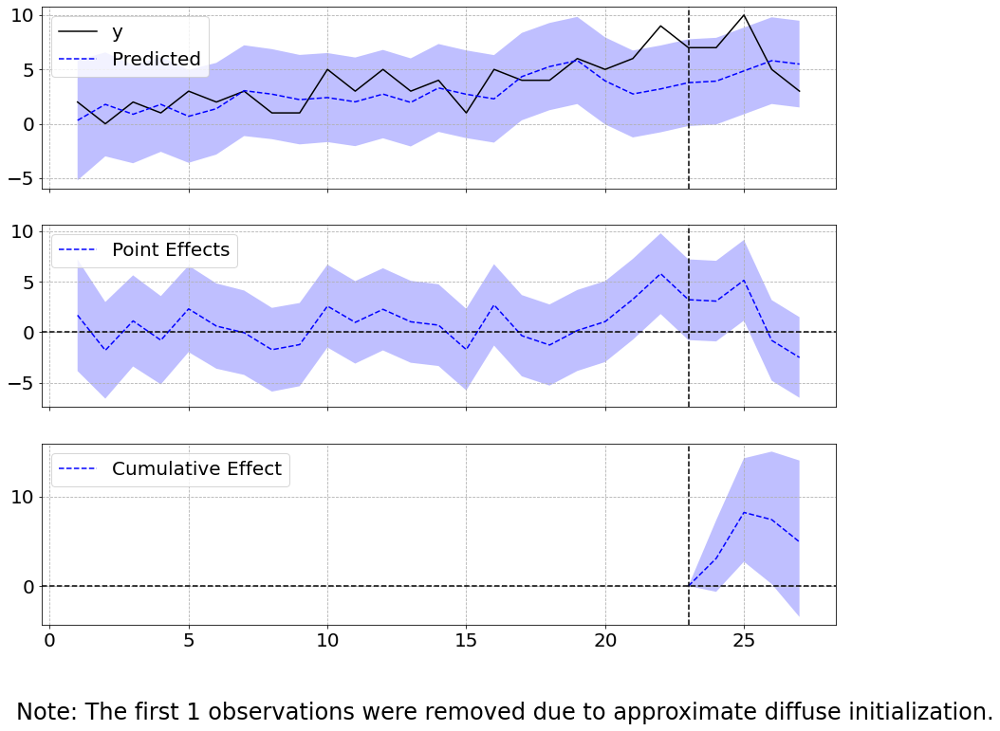



--------------------------------------------------------------------
Code = N92
Scipy computed Pearson r: 0.09102409296760597 and p-value: 0.672295221273267
Causal Impact p-value = 0.015984015984015984
counts in post = 10

Significant without Bonferroni correction

sigma2.irregular    1.031041
sigma2.level        0.000144
beta.covariate      0.089533
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.5                14.0
Prediction (s.d.)         2.05 (0.67)        8.22 (2.67)
95% CI                    [0.71, 3.33]       [2.83, 13.3]

Absolute effect (s.d.)    1.45 (0.67)        5.78 (2.67)
95% CI                    [0.17, 2.79]       [0.7, 11.17]

Relative effect (s.d.)    70.4% (32.53%)     70.4% (32.53%)
95% CI                    [8.48%, 136.0%]    [8.48%, 136.0%]

Posterior tail-area probability p: 0.02
Posterior prob. of a causal effect: 98.4%

For more details run the command: print(impact.summ

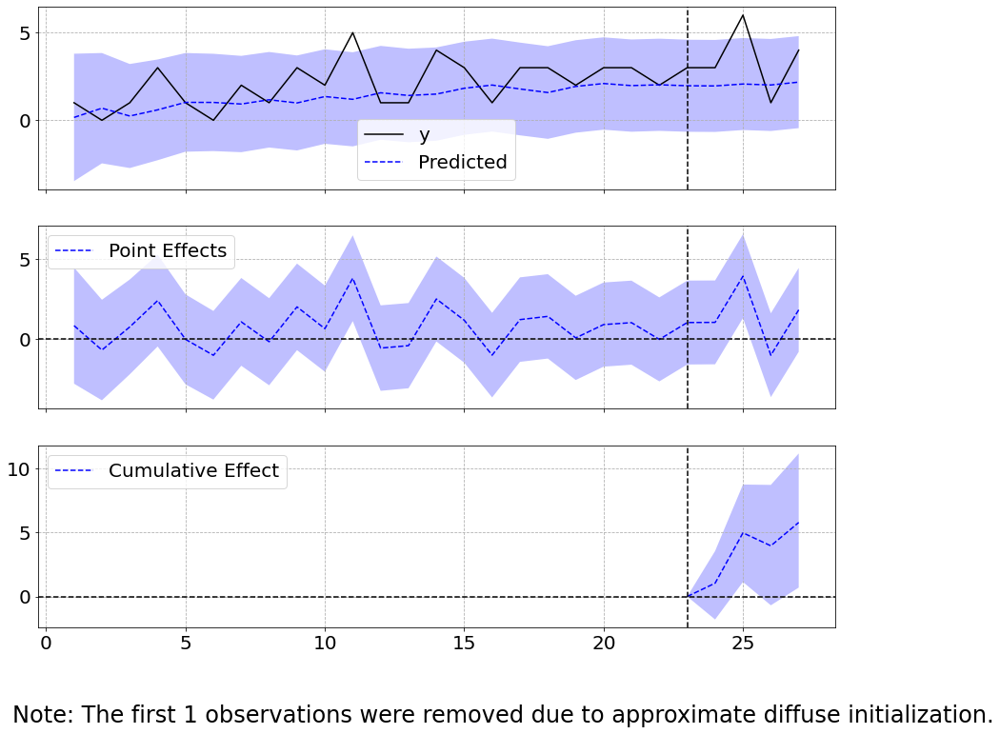



--------------------------------------------------------------------
Code = N93
Scipy computed Pearson r: 0.2157106597348553 and p-value: 0.31138005157600823
Causal Impact p-value = 0.003996003996003996
counts in post = 8

Significant without Bonferroni correction

sigma2.irregular    0.992934
sigma2.level        0.000144
beta.covariate      0.213262
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         0.87 (0.57)        3.49 (2.29)
95% CI                    [-0.19, 2.05]      [-0.76, 8.21]

Absolute effect (s.d.)    1.63 (0.57)        6.51 (2.29)
95% CI                    [0.45, 2.69]       [1.79, 10.76]

Relative effect (s.d.)    186.46% (65.55%)   186.46% (65.55%)
95% CI                    [51.17%, 308.11%]  [51.17%, 308.11%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.6%

For more details run the command: print(impact

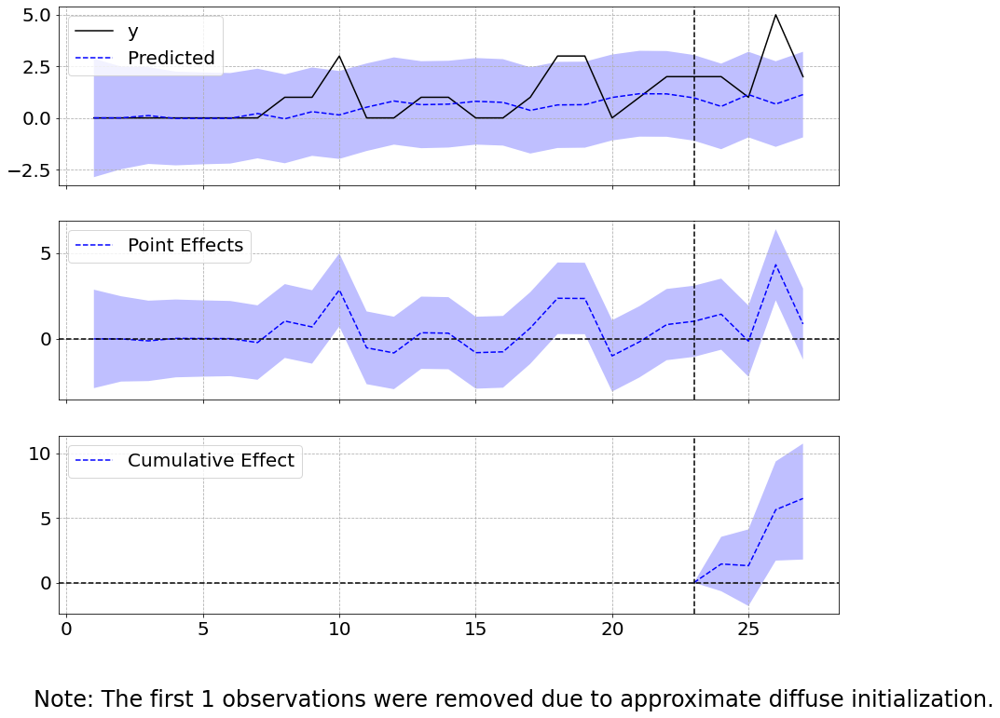



--------------------------------------------------------------------
Code = O24
Scipy computed Pearson r: 0.7698031857370153 and p-value: 1.091358897428284e-05
Causal Impact p-value = 0.0
counts in post = 6

Passes Bonferroni

sigma2.irregular    0.424093
sigma2.level        0.000144
beta.covariate      0.771391
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.5                6.0
Prediction (s.d.)         0.07 (0.15)        0.27 (0.62)
95% CI                    [-0.24, 0.36]      [-0.97, 1.44]

Absolute effect (s.d.)    1.43 (0.15)        5.73 (0.62)
95% CI                    [1.14, 1.74]       [4.56, 6.97]

Relative effect (s.d.)    2128.9% (228.91%)  2128.9% (228.91%)
95% CI                    [1692.39%, 2589.69%][1692.39%, 2589.69%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report

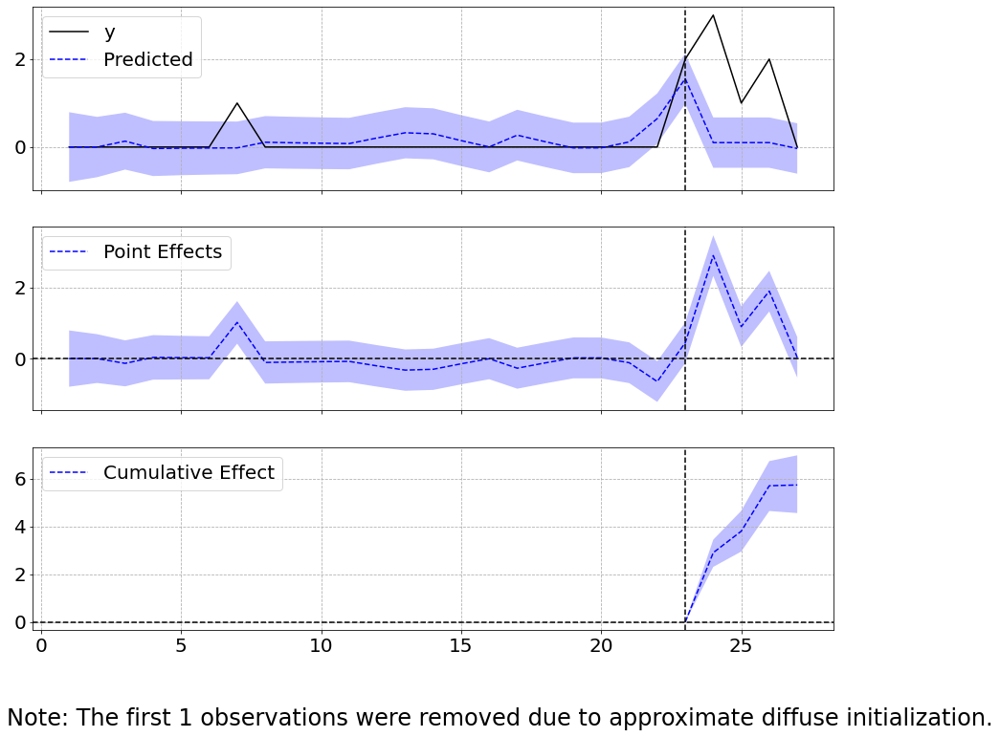



--------------------------------------------------------------------
Code = O99
Scipy computed Pearson r: 0.8101753477128497 and p-value: 1.6031715814337326e-06
Causal Impact p-value = 0.0
counts in post = 8

Passes Bonferroni

sigma2.irregular    0.357037
sigma2.level        0.000144
beta.covariate      0.807398
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         0.65 (0.66)        2.6 (2.62)
95% CI                    [-0.66, 1.91]      [-2.65, 7.64]

Absolute effect (s.d.)    1.85 (0.66)        7.4 (2.62)
95% CI                    [0.59, 3.16]       [2.36, 12.65]

Relative effect (s.d.)    284.54% (100.91%)  284.54% (100.91%)
95% CI                    [90.82%, 486.36%]  [90.82%, 486.36%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {C

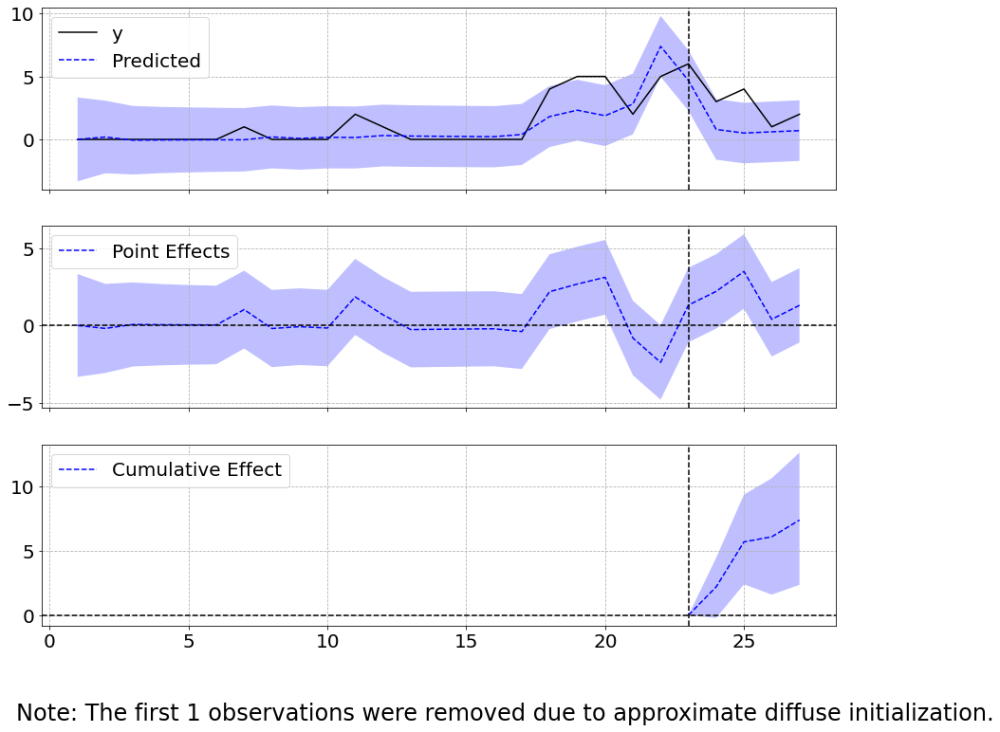



--------------------------------------------------------------------
Code = R00
Scipy computed Pearson r: 0.6571459250163911 and p-value: 0.00048521771835200285
Causal Impact p-value = 0.08391608391608392
counts in post = 7


sigma2.irregular    0.590218
sigma2.level        0.000144
beta.covariate      0.654299
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.75               11.0
Prediction (s.d.)         2.06 (0.52)        8.26 (2.07)
95% CI                    [1.05, 3.07]       [4.18, 12.3]

Absolute effect (s.d.)    0.69 (0.52)        2.74 (2.07)
95% CI                    [-0.32, 1.7]       [-1.3, 6.82]

Relative effect (s.d.)    33.19% (25.06%)    33.19% (25.06%)
95% CI                    [-15.71%, 82.52%]  [-15.71%, 82.52%]

Posterior tail-area probability p: 0.08
Posterior prob. of a causal effect: 91.61%

For more details run the command: print(impact.summary('report'))
Analysis report {Caus

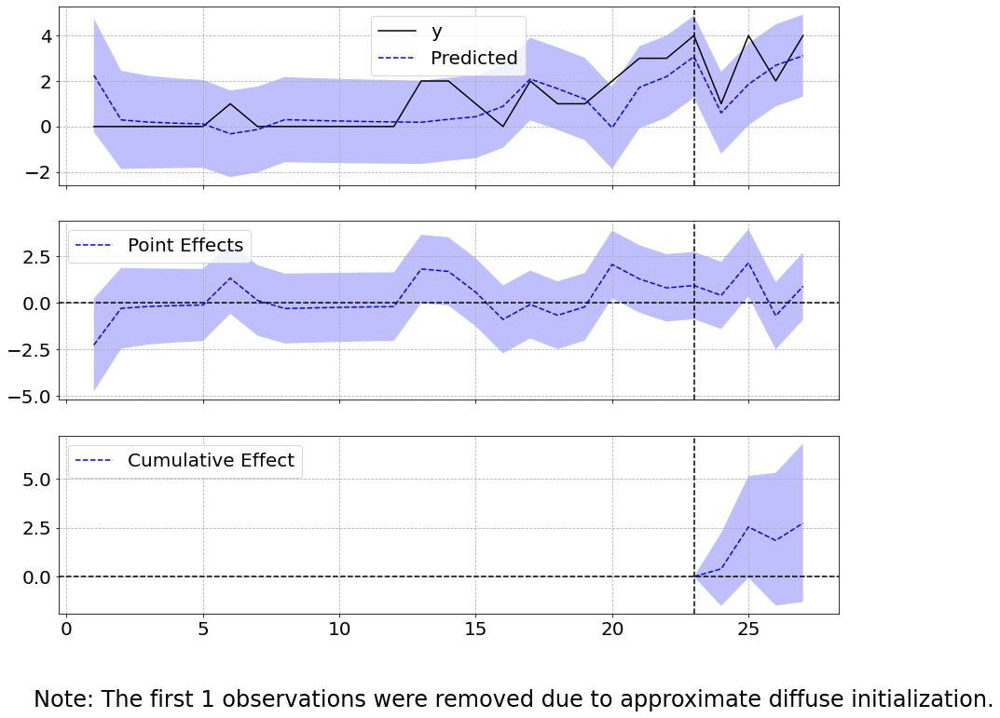



--------------------------------------------------------------------
Code = R03
Scipy computed Pearson r: 0.5194377364790879 and p-value: 0.00928699823569203
Causal Impact p-value = 0.006993006993006993
counts in post = 6

Significant without Bonferroni correction

sigma2.irregular    0.761791
sigma2.level        0.000069
beta.covariate      0.519890
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         1.1 (0.58)         4.39 (2.32)
95% CI                    [-0.04, 2.24]      [-0.17, 8.94]

Absolute effect (s.d.)    1.4 (0.58)         5.61 (2.32)
95% CI                    [0.26, 2.54]       [1.06, 10.17]

Relative effect (s.d.)    127.57% (52.9%)    127.57% (52.9%)
95% CI                    [24.08%, 231.46%]  [24.08%, 231.46%]

Posterior tail-area probability p: 0.01
Posterior prob. of a causal effect: 99.3%

For more details run the command: print(impact

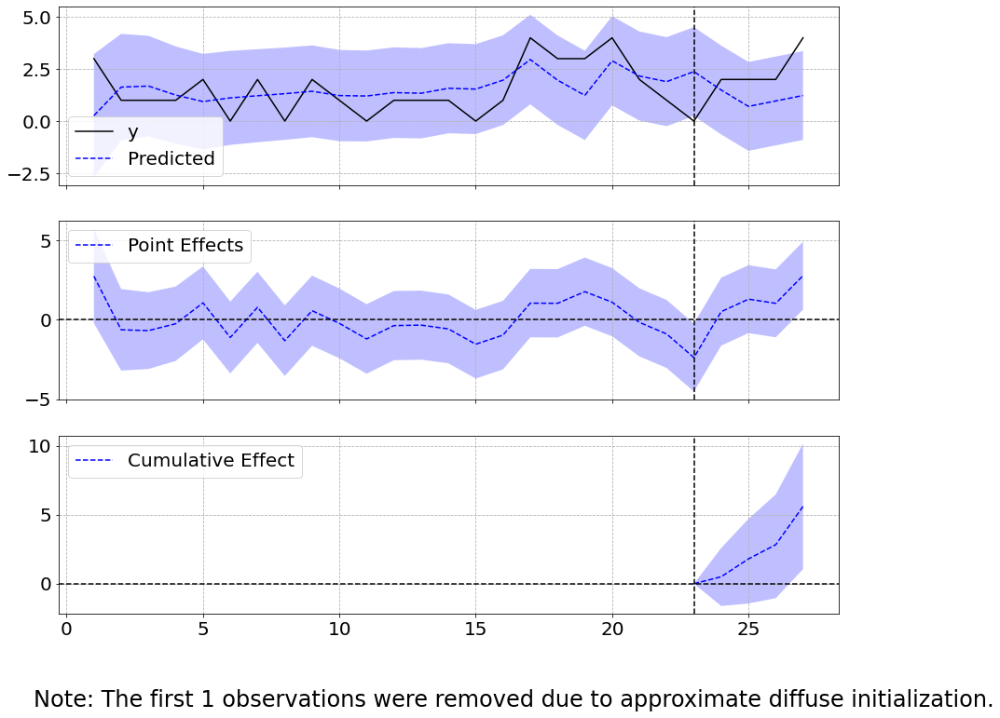



--------------------------------------------------------------------
Code = R05
Scipy computed Pearson r: 0.6125216202816217 and p-value: 0.0014640864750523235
Causal Impact p-value = 0.17682317682317683
counts in post = 10


sigma2.irregular    0.648980
sigma2.level        0.000144
beta.covariate      0.609521
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         1.64 (0.93)        6.56 (3.71)
95% CI                    [-0.19, 3.44]      [-0.78, 13.77]

Absolute effect (s.d.)    0.86 (0.93)        3.44 (3.71)
95% CI                    [-0.94, 2.69]      [-3.77, 10.78]

Relative effect (s.d.)    52.43% (56.54%)    52.43% (56.54%)
95% CI                    [-57.39%, 164.25%] [-57.39%, 164.25%]

Posterior tail-area probability p: 0.18
Posterior prob. of a causal effect: 82.32%

For more details run the command: print(impact.summary('report'))
Analysis report 

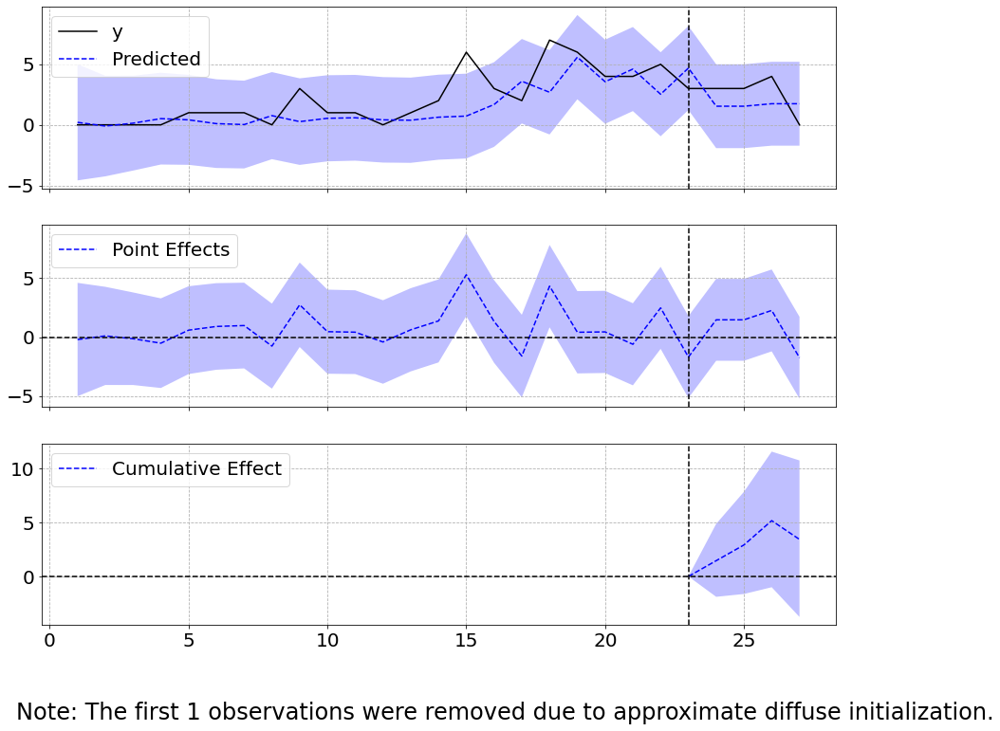



--------------------------------------------------------------------
Code = R06
Scipy computed Pearson r: 0.5470479461985969 and p-value: 0.005667301574325901
Causal Impact p-value = 0.0
counts in post = 17

Passes Bonferroni

sigma2.irregular    0.729187
sigma2.level        0.000144
beta.covariate      0.545292
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    5.25               21.0
Prediction (s.d.)         1.8 (0.8)          7.18 (3.19)
95% CI                    [0.25, 3.37]       [1.0, 13.49]

Absolute effect (s.d.)    3.45 (0.8)         13.82 (3.19)
95% CI                    [1.88, 5.0]        [7.51, 20.0]

Relative effect (s.d.)    192.37% (44.39%)   192.37% (44.39%)
95% CI                    [104.51%, 278.52%] [104.51%, 278.52%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {C

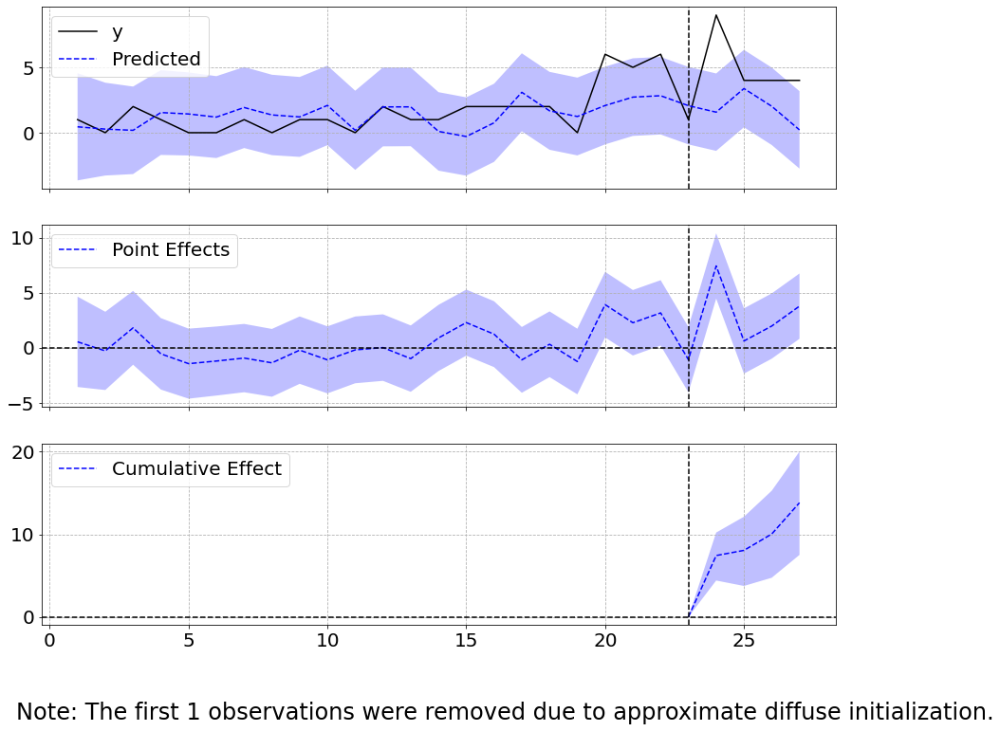



--------------------------------------------------------------------
Code = R07
Scipy computed Pearson r: 0.21826677827944896 and p-value: 0.30554097238834715
Causal Impact p-value = 0.0
counts in post = 22

Passes Bonferroni

sigma2.irregular    0.986303
sigma2.level        0.000144
beta.covariate      0.216028
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    6.0                24.0
Prediction (s.d.)         1.63 (0.81)        6.53 (3.23)
95% CI                    [0.02, 3.19]       [0.08, 12.75]

Absolute effect (s.d.)    4.37 (0.81)        17.47 (3.23)
95% CI                    [2.81, 5.98]       [11.25, 23.92]

Relative effect (s.d.)    267.78% (49.5%)    267.78% (49.5%)
95% CI                    [172.44%, 366.5%]  [172.44%, 366.5%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {

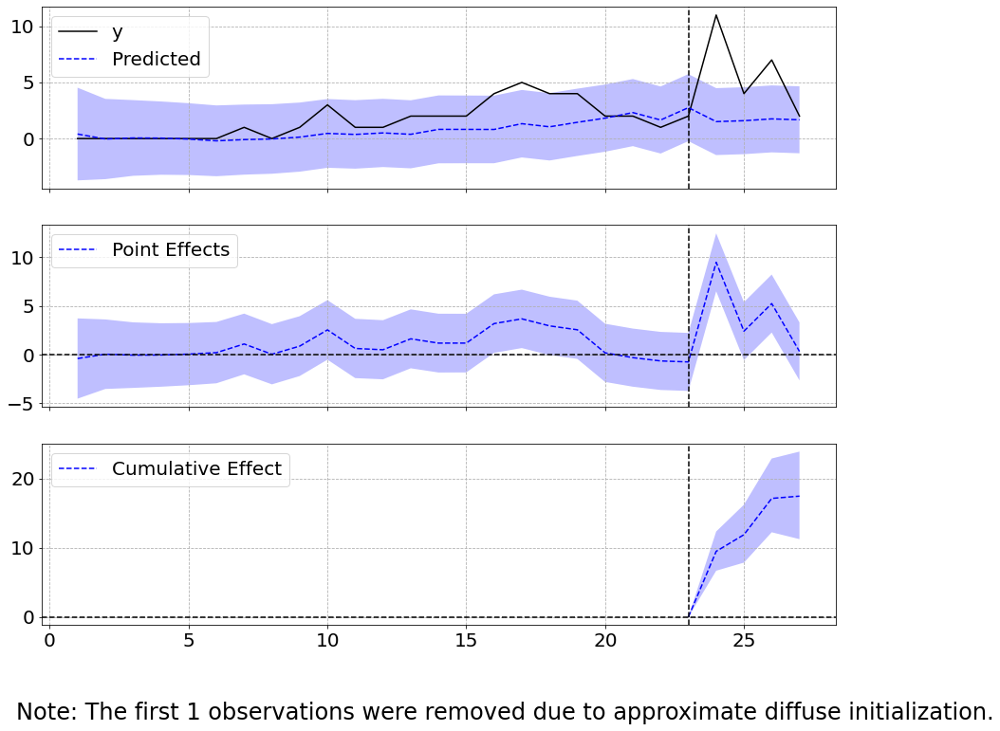



--------------------------------------------------------------------
Code = R10
Scipy computed Pearson r: 0.4645316237199356 and p-value: 0.02219996321519325
Causal Impact p-value = 0.28771228771228774
counts in post = 24


sigma2.irregular    0.814305
sigma2.level        0.000144
beta.covariate      0.461106
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    8.25               33.0
Prediction (s.d.)         9.54 (1.95)        38.15 (7.79)
95% CI                    [5.65, 13.28]      [22.59, 53.13]

Absolute effect (s.d.)    -1.29 (1.95)       -5.15 (7.79)
95% CI                    [-5.03, 2.6]       [-20.13, 10.41]

Relative effect (s.d.)    -13.51% (20.42%)   -13.51% (20.42%)
95% CI                    [-52.77%, 27.28%]  [-52.77%, 27.28%]

Posterior tail-area probability p: 0.29
Posterior prob. of a causal effect: 71.23%

For more details run the command: print(impact.summary('report'))
Analysis report

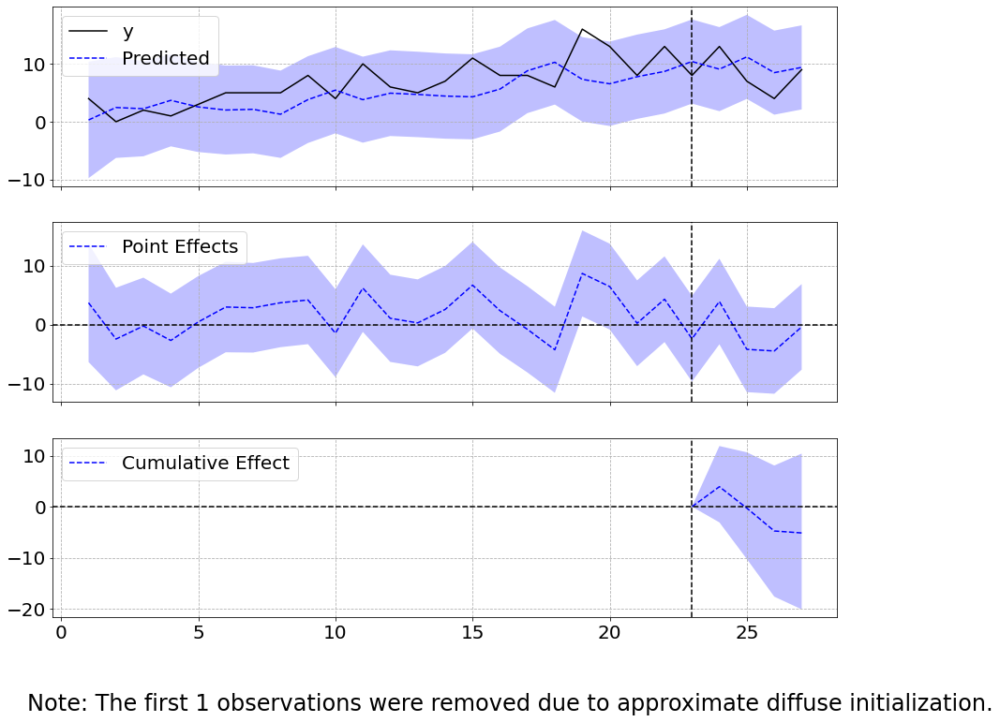



--------------------------------------------------------------------
Code = R11
Scipy computed Pearson r: 0.6948782680518888 and p-value: 0.0001644006155398982
Causal Impact p-value = 0.000999000999000999
counts in post = 9

Significant without Bonferroni correction

sigma2.irregular    0.536633
sigma2.level        0.000144
beta.covariate      0.691352
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.25               9.0
Prediction (s.d.)         0.6 (0.48)         2.41 (1.94)
95% CI                    [-0.35, 1.55]      [-1.38, 6.21]

Absolute effect (s.d.)    1.65 (0.48)        6.59 (1.94)
95% CI                    [0.7, 2.6]         [2.79, 10.38]

Relative effect (s.d.)    273.43% (80.35%)   273.43% (80.35%)
95% CI                    [115.82%, 430.77%] [115.82%, 430.77%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.9%

For more details run the command: print(impa

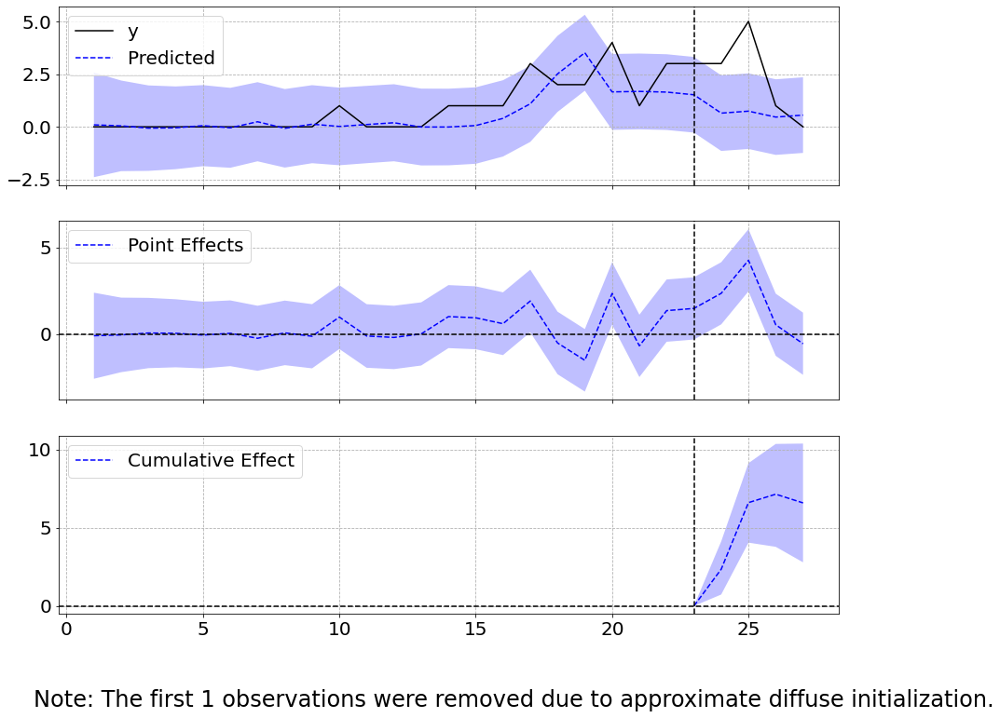



--------------------------------------------------------------------
Code = R19
Scipy computed Pearson r: 0.19191593616907618 and p-value: 0.368976025538584
Causal Impact p-value = 0.22277722277722278
counts in post = 10


sigma2.irregular    1.001426
sigma2.level        0.000144
beta.covariate      0.189428
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.75               11.0
Prediction (s.d.)         1.86 (1.1)         7.45 (4.4)
95% CI                    [-0.19, 4.12]      [-0.77, 16.49]

Absolute effect (s.d.)    0.89 (1.1)         3.55 (4.4)
95% CI                    [-1.37, 2.94]      [-5.49, 11.77]

Relative effect (s.d.)    47.73% (59.13%)    47.73% (59.13%)
95% CI                    [-73.67%, 158.1%]  [-73.67%, 158.1%]

Posterior tail-area probability p: 0.22
Posterior prob. of a causal effect: 77.72%

For more details run the command: print(impact.summary('report'))
Analysis report {Causa

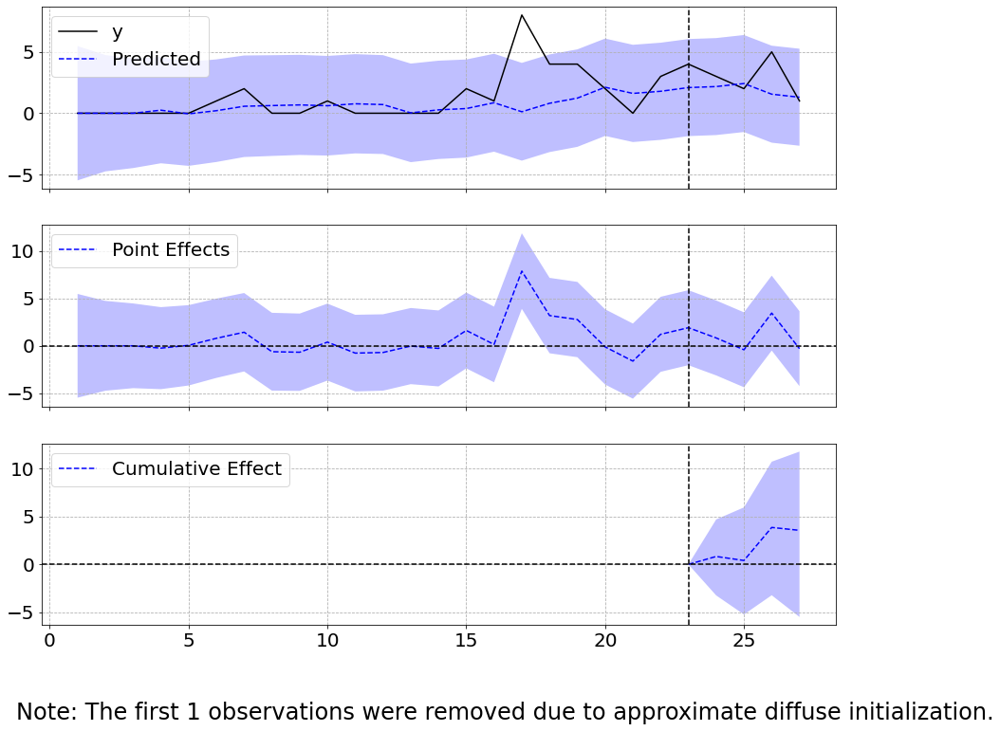



--------------------------------------------------------------------
Code = R20
Scipy computed Pearson r: 0.19245856565376251 and p-value: 0.3675979499200666
Causal Impact p-value = 0.0
counts in post = 8

Passes Bonferroni

sigma2.irregular    1.004833
sigma2.level        0.000069
beta.covariate      0.192589
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         0.6 (0.34)         2.42 (1.37)
95% CI                    [-0.03, 1.31]      [-0.14, 5.24]

Absolute effect (s.d.)    1.4 (0.34)         5.58 (1.37)
95% CI                    [0.69, 2.03]       [2.76, 8.14]

Relative effect (s.d.)    230.59% (56.72%)   230.59% (56.72%)
95% CI                    [114.02%, 336.36%] [114.02%, 336.36%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {Caus

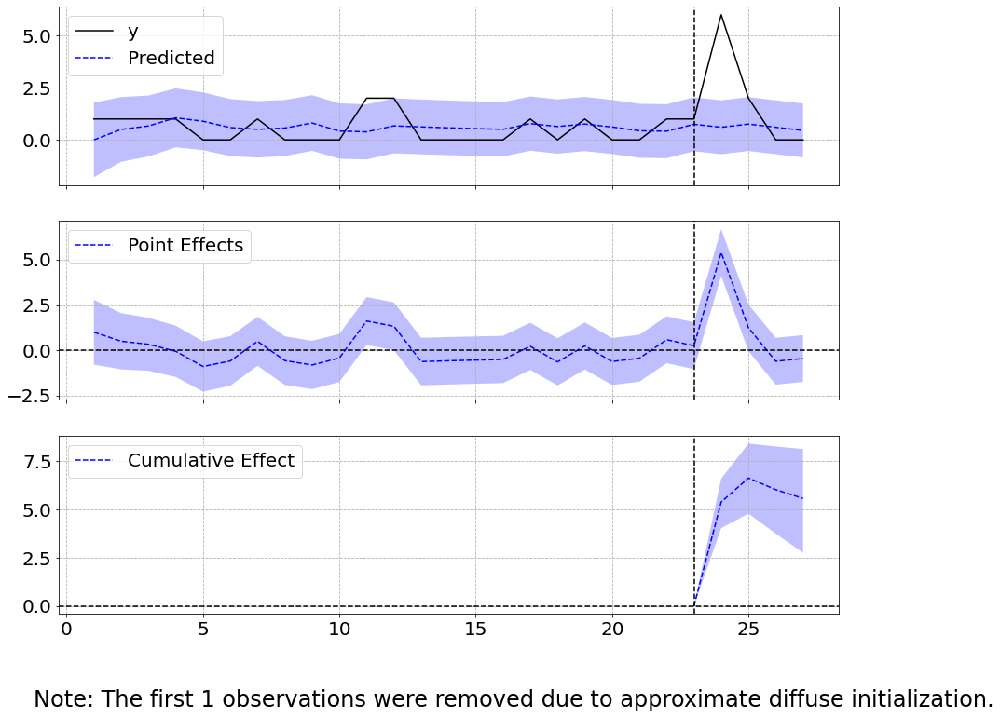



--------------------------------------------------------------------
Code = R30
Scipy computed Pearson r: 0.5036070334681466 and p-value: 0.012111688595673333
Causal Impact p-value = 0.03296703296703297
counts in post = 8

Significant without Bonferroni correction

sigma2.irregular    0.776840
sigma2.level        0.000144
beta.covariate      0.501312
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.75               11.0
Prediction (s.d.)         1.51 (0.68)        6.05 (2.7)
95% CI                    [0.2, 2.85]        [0.81, 11.41]

Absolute effect (s.d.)    1.24 (0.68)        4.95 (2.7)
95% CI                    [-0.1, 2.55]       [-0.41, 10.19]

Relative effect (s.d.)    81.68% (44.67%)    81.68% (44.67%)
95% CI                    [-6.8%, 168.3%]    [-6.8%, 168.3%]

Posterior tail-area probability p: 0.03
Posterior prob. of a causal effect: 96.7%

For more details run the command: print(impact.su

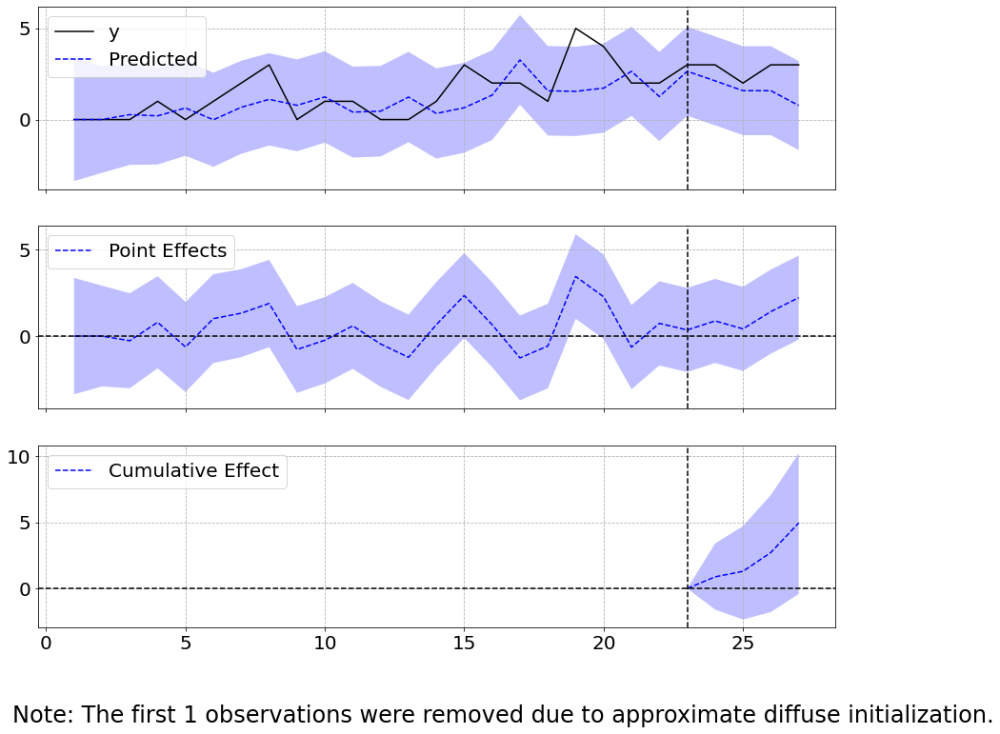



--------------------------------------------------------------------
Code = R51
Scipy computed Pearson r: 0.613337583433156 and p-value: 0.0014369254603288444
Causal Impact p-value = 0.001998001998001998
counts in post = 6

Significant without Bonferroni correction

sigma2.irregular    0.650734
sigma2.level        0.000069
beta.covariate      0.613028
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.75               7.0
Prediction (s.d.)         4.09 (0.76)        16.35 (3.03)
95% CI                    [2.58, 5.55]       [10.34, 22.2]

Absolute effect (s.d.)    -2.34 (0.76)       -9.35 (3.03)
95% CI                    [-3.8, -0.83]      [-15.2, -3.34]

Relative effect (s.d.)    -57.2% (18.51%)    -57.2% (18.51%)
95% CI                    [-92.96%, -20.42%] [-92.96%, -20.42%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.8%

For more details run the command: print(imp

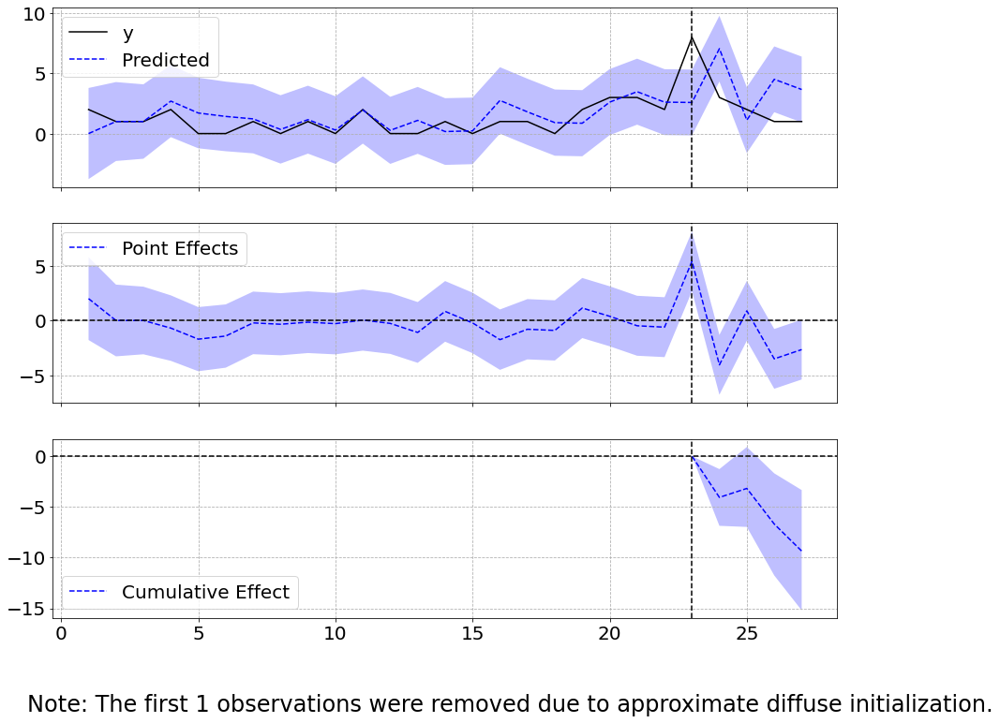



--------------------------------------------------------------------
Code = R53
Scipy computed Pearson r: 0.23340804267283508 and p-value: 0.2723494069618007
Causal Impact p-value = 0.00999000999000999
counts in post = 14

Significant without Bonferroni correction

sigma2.irregular    0.985584
sigma2.level        0.000144
beta.covariate      0.232265
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.75               15.0
Prediction (s.d.)         1.67 (0.88)        6.67 (3.51)
95% CI                    [0.01, 3.45]       [0.04, 13.81]

Absolute effect (s.d.)    2.08 (0.88)        8.33 (3.51)
95% CI                    [0.3, 3.74]        [1.19, 14.96]

Relative effect (s.d.)    124.84% (52.66%)   124.84% (52.66%)
95% CI                    [17.84%, 224.27%]  [17.84%, 224.27%]

Posterior tail-area probability p: 0.01
Posterior prob. of a causal effect: 99.0%

For more details run the command: print(impac

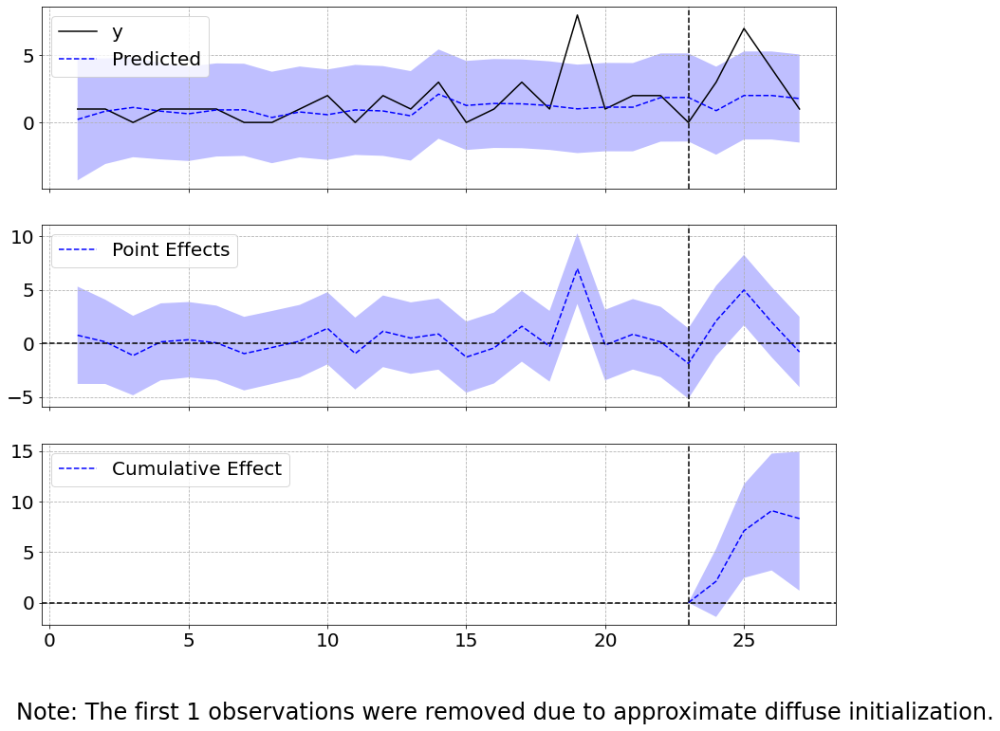



--------------------------------------------------------------------
Code = R59
Scipy computed Pearson r: -0.2650042755876464 and p-value: 0.21076438294083283
Causal Impact p-value = 0.0
counts in post = 7

Passes Bonferroni

sigma2.irregular    0.969178
sigma2.level        0.000144
beta.covariate     -0.265126
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.75               7.0
Prediction (s.d.)         0.48 (0.31)        1.93 (1.23)
95% CI                    [-0.09, 1.12]      [-0.34, 4.48]

Absolute effect (s.d.)    1.27 (0.31)        5.07 (1.23)
95% CI                    [0.63, 1.84]       [2.52, 7.34]

Relative effect (s.d.)    262.03% (63.57%)   262.03% (63.57%)
95% CI                    [130.58%, 379.79%] [130.58%, 379.79%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {Cau

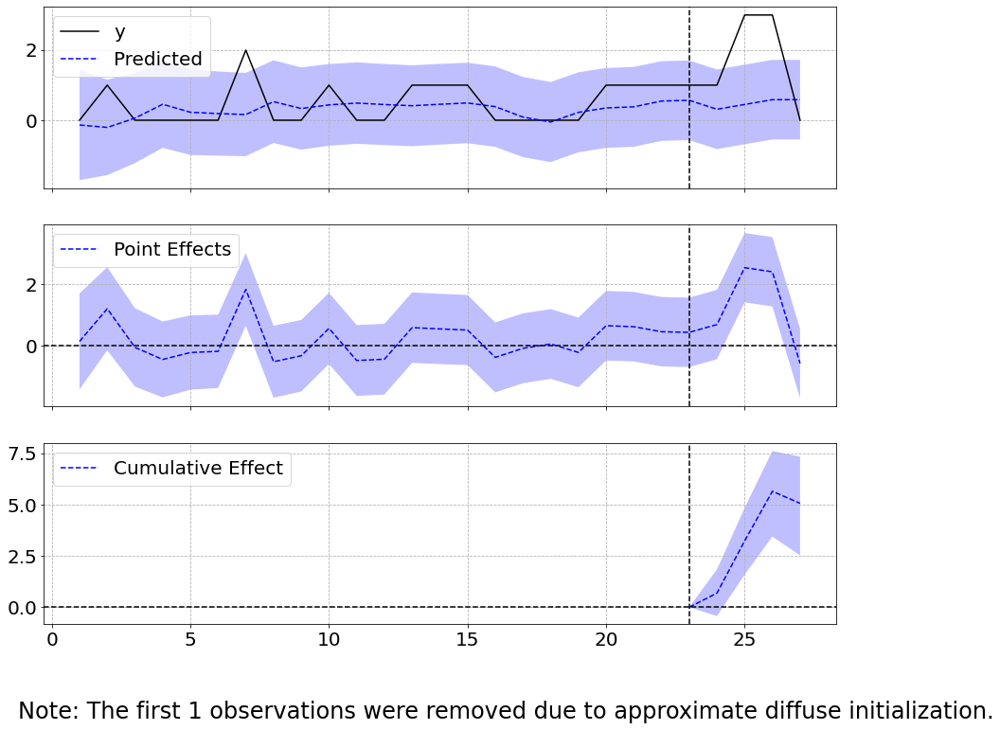



--------------------------------------------------------------------
Code = R62
Scipy computed Pearson r: 0.09128709291752767 and p-value: 0.6713999888619099
Causal Impact p-value = 0.14485514485514486
counts in post = 7


sigma2.irregular    1.029814
sigma2.level        0.000144
beta.covariate      0.089948
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.25               9.0
Prediction (s.d.)         1.55 (0.65)        6.21 (2.59)
95% CI                    [0.26, 2.81]       [1.06, 11.22]

Absolute effect (s.d.)    0.7 (0.65)         2.79 (2.59)
95% CI                    [-0.56, 1.99]      [-2.22, 7.94]

Relative effect (s.d.)    45.0% (41.79%)     45.0% (41.79%)
95% CI                    [-35.81%, 128.0%]  [-35.81%, 128.0%]

Posterior tail-area probability p: 0.14
Posterior prob. of a causal effect: 85.51%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalI

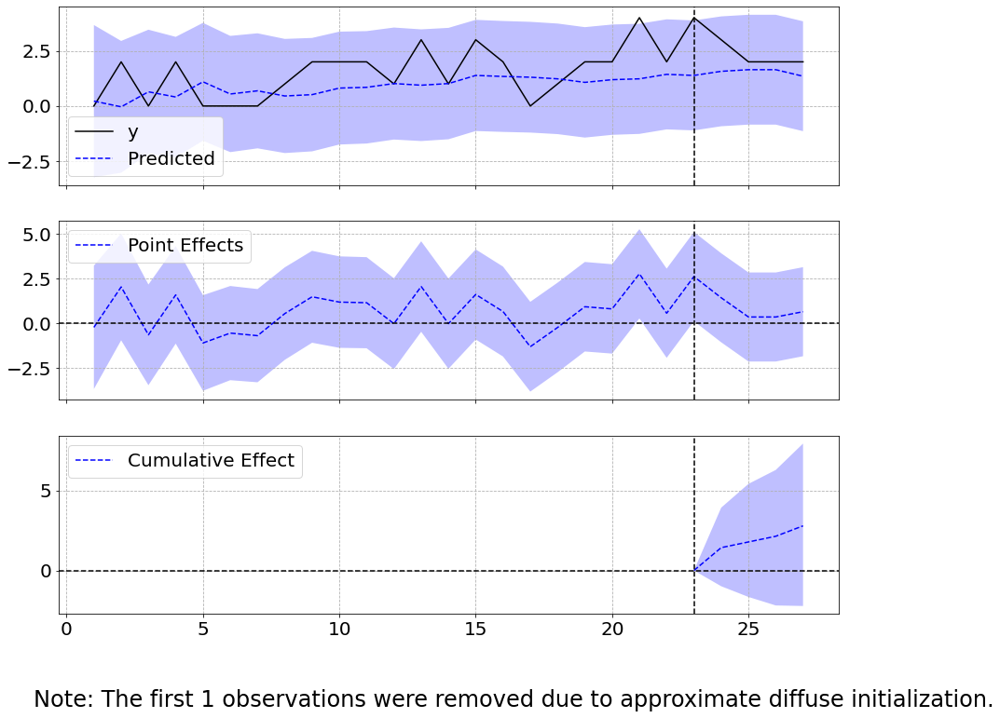



--------------------------------------------------------------------
Code = R73
Scipy computed Pearson r: 0.5547814521504889 and p-value: 0.004898216267682139
Causal Impact p-value = 0.12787212787212787
counts in post = 26


sigma2.irregular    0.721226
sigma2.level        0.000144
beta.covariate      0.553112
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    8.5                34.0
Prediction (s.d.)         6.74 (1.53)        26.97 (6.14)
95% CI                    [3.74, 9.76]       [14.97, 39.04]

Absolute effect (s.d.)    1.76 (1.53)        7.03 (6.14)
95% CI                    [-1.26, 4.76]      [-5.04, 19.03]

Relative effect (s.d.)    26.06% (22.76%)    26.06% (22.76%)
95% CI                    [-18.67%, 70.56%]  [-18.67%, 70.56%]

Posterior tail-area probability p: 0.13
Posterior prob. of a causal effect: 87.21%

For more details run the command: print(impact.summary('report'))
Analysis report {

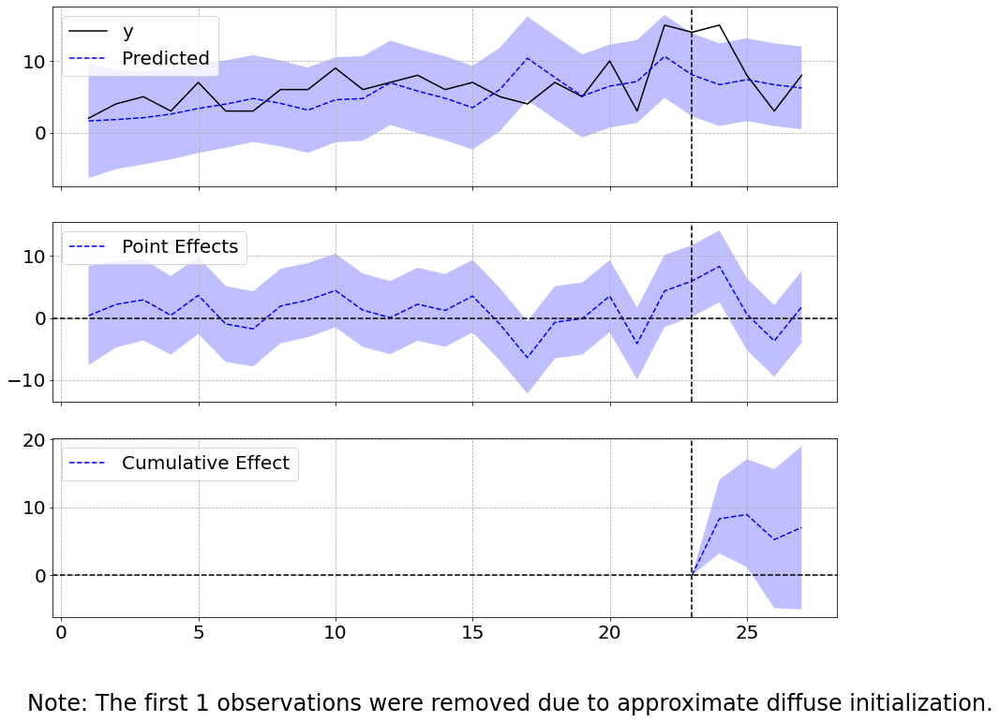



--------------------------------------------------------------------
Code = R74
Scipy computed Pearson r: 0.11473490277495285 and p-value: 0.5934479358434949
Causal Impact p-value = 0.15884115884115885
counts in post = 8


sigma2.irregular    1.028727
sigma2.level        0.000144
beta.covariate      0.114209
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.25               9.0
Prediction (s.d.)         1.5 (0.78)         6.0 (3.1)
95% CI                    [0.01, 3.05]       [0.03, 12.19]

Absolute effect (s.d.)    0.75 (0.78)        3.0 (3.1)
95% CI                    [-0.8, 2.24]       [-3.19, 8.97]

Relative effect (s.d.)    49.93% (51.65%)    49.93% (51.65%)
95% CI                    [-53.11%, 149.36%] [-53.11%, 149.36%]

Posterior tail-area probability p: 0.16
Posterior prob. of a causal effect: 84.12%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalImp

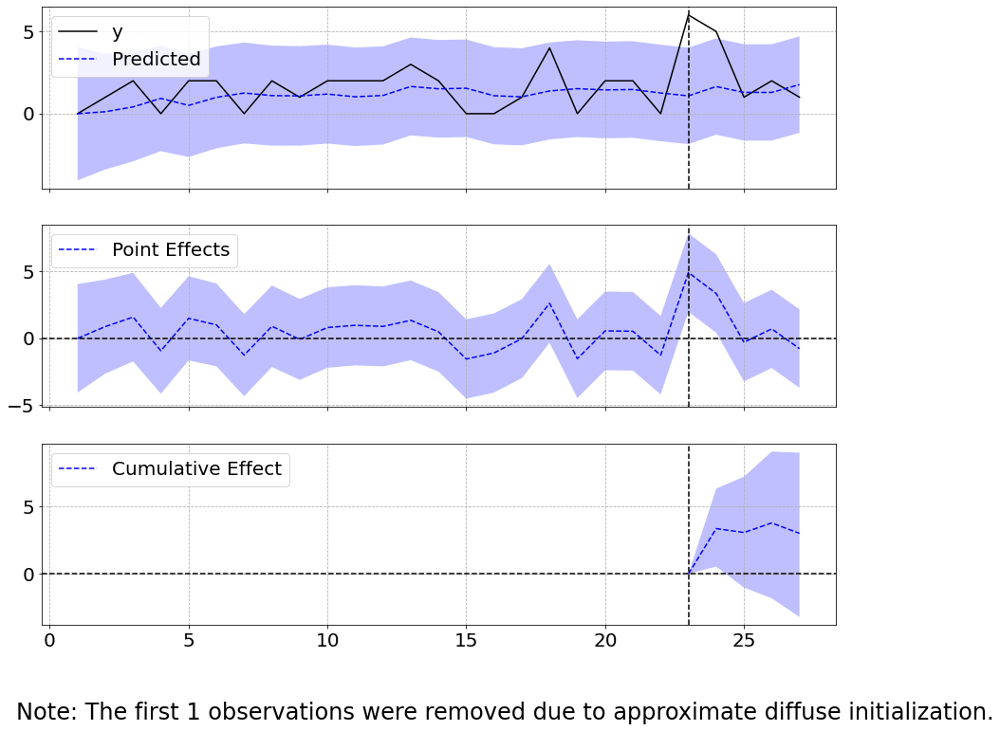



--------------------------------------------------------------------
Code = R87
Scipy computed Pearson r: 0.36911142388612583 and p-value: 0.0758934351612848
Causal Impact p-value = 0.001998001998001998
counts in post = 13

Significant without Bonferroni correction

sigma2.irregular    0.900373
sigma2.level        0.000144
beta.covariate      0.368328
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.0                16.0
Prediction (s.d.)         1.79 (0.74)        7.15 (2.95)
95% CI                    [0.46, 3.35]       [1.83, 13.39]

Absolute effect (s.d.)    2.21 (0.74)        8.85 (2.95)
95% CI                    [0.65, 3.54]       [2.61, 14.17]

Relative effect (s.d.)    123.74% (41.24%)   123.74% (41.24%)
95% CI                    [36.46%, 198.13%]  [36.46%, 198.13%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.8%

For more details run the command: print(impac

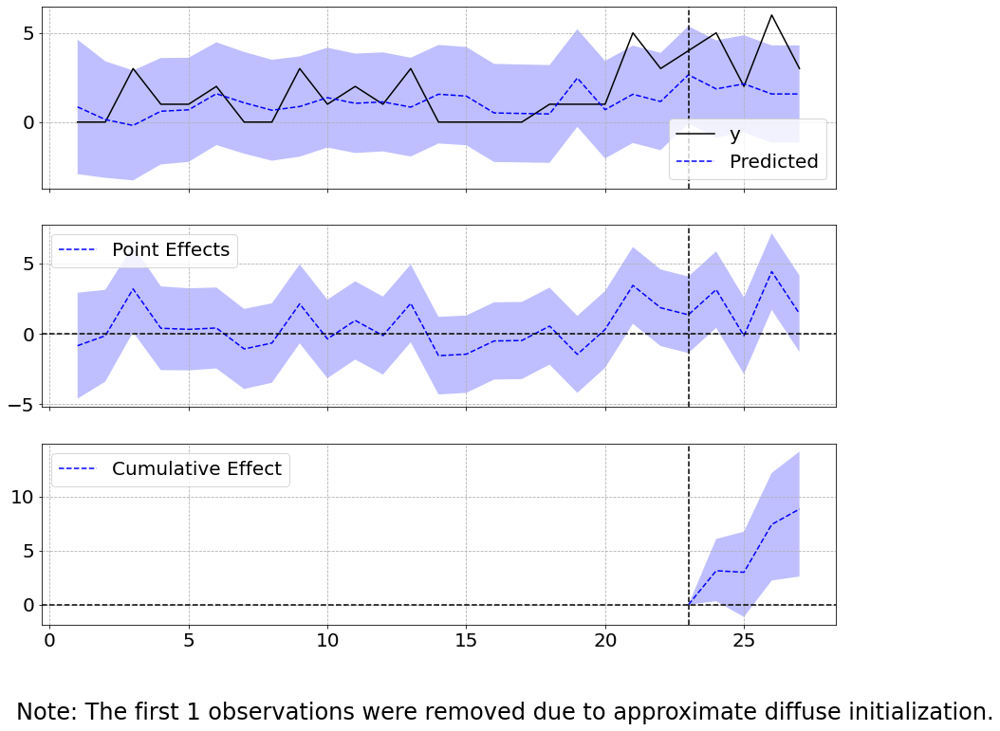



--------------------------------------------------------------------
Code = R94
Scipy computed Pearson r: 0.3118855975741413 and p-value: 0.13790104769731007
Causal Impact p-value = 0.007992007992007992
counts in post = 13

Significant without Bonferroni correction

sigma2.irregular    0.940654
sigma2.level        0.000144
beta.covariate      0.310634
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.75               15.0
Prediction (s.d.)         1.73 (0.79)        6.91 (3.17)
95% CI                    [0.18, 3.29]       [0.73, 13.15]

Absolute effect (s.d.)    2.02 (0.79)        8.09 (3.17)
95% CI                    [0.46, 3.57]       [1.85, 14.27]

Relative effect (s.d.)    116.95% (45.86%)   116.95% (45.86%)
95% CI                    [26.71%, 206.47%]  [26.71%, 206.47%]

Posterior tail-area probability p: 0.01
Posterior prob. of a causal effect: 99.2%

For more details run the command: print(impa

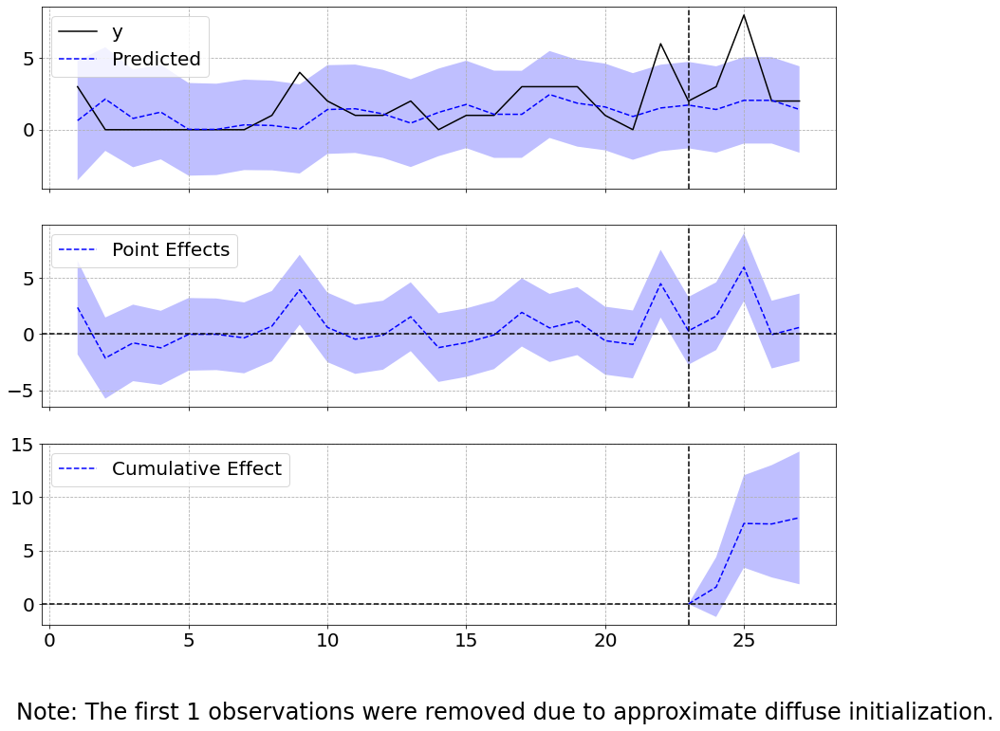



--------------------------------------------------------------------
Code = Z00
Scipy computed Pearson r: 0.7574931304999262 and p-value: 1.8180679931174272e-05
Causal Impact p-value = 0.16583416583416583
counts in post = 63


sigma2.irregular    0.443937
sigma2.level        0.000144
beta.covariate      0.755170
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    22.0               88.0
Prediction (s.d.)         25.48 (3.64)       101.92 (14.56)
95% CI                    [18.01, 32.27]     [72.02, 129.09]

Absolute effect (s.d.)    -3.48 (3.64)       -13.92 (14.56)
95% CI                    [-10.27, 3.99]     [-41.09, 15.98]

Relative effect (s.d.)    -13.66% (14.28%)   -13.66% (14.28%)
95% CI                    [-40.32%, 15.68%]  [-40.32%, 15.68%]

Posterior tail-area probability p: 0.17
Posterior prob. of a causal effect: 83.42%

For more details run the command: print(impact.summary('report'))
Analysi

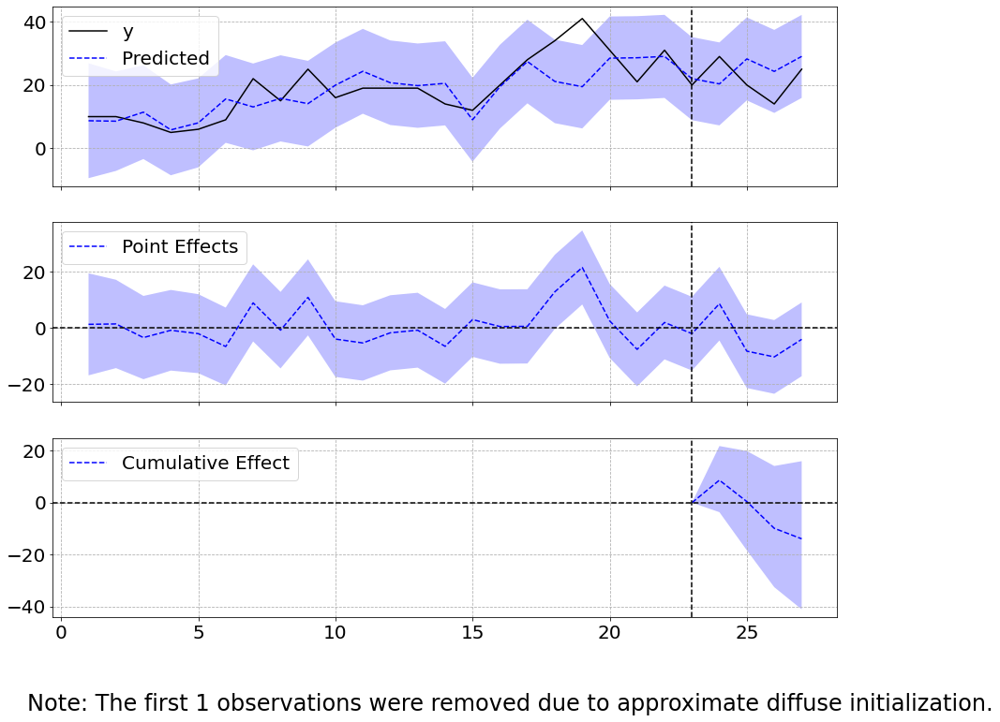



--------------------------------------------------------------------
Code = Z01
Scipy computed Pearson r: 0.7529460221890176 and p-value: 2.179006501975951e-05
Causal Impact p-value = 0.004995004995004995
counts in post = 24

Significant without Bonferroni correction

sigma2.irregular    0.450806
sigma2.level        0.000144
beta.covariate      0.750332
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    7.25               29.0
Prediction (s.d.)         10.03 (1.15)       40.13 (4.61)
95% CI                    [7.69, 12.21]      [30.77, 48.85]

Absolute effect (s.d.)    -2.78 (1.15)       -11.13 (4.61)
95% CI                    [-4.96, -0.44]     [-19.85, -1.77]

Relative effect (s.d.)    -27.74% (11.49%)   -27.74% (11.49%)
95% CI                    [-49.45%, -4.41%]  [-49.45%, -4.41%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.5%

For more details run the command: pri

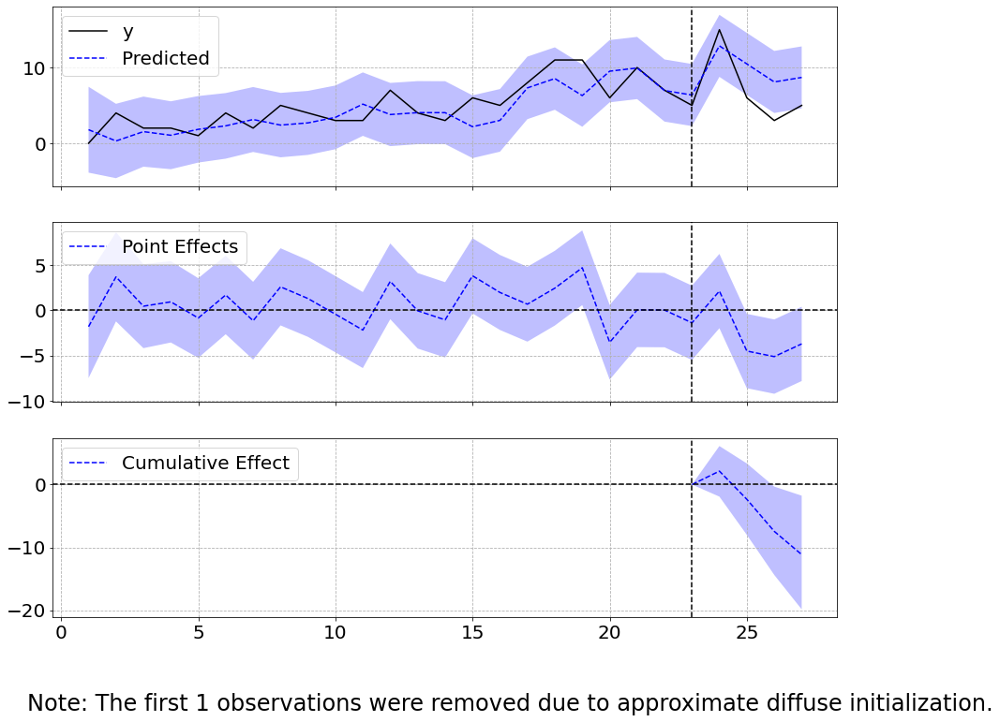



--------------------------------------------------------------------
Code = Z03
Scipy computed Pearson r: 0.9638009049773755 and p-value: 4.0754901846424254e-14
Causal Impact p-value = 0.0
counts in post = 6

Passes Bonferroni

sigma2.irregular    0.074375
sigma2.level        0.000069
beta.covariate      0.963431
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.5                6.0
Prediction (s.d.)         3.15 (0.16)        12.58 (0.65)
95% CI                    [2.83, 3.47]       [11.33, 13.86]

Absolute effect (s.d.)    -1.65 (0.16)       -6.58 (0.65)
95% CI                    [-1.97, -1.33]     [-7.86, -5.33]

Relative effect (s.d.)    -52.32% (5.13%)    -52.32% (5.13%)
95% CI                    [-62.47%, -42.35%] [-62.47%, -42.35%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis repor

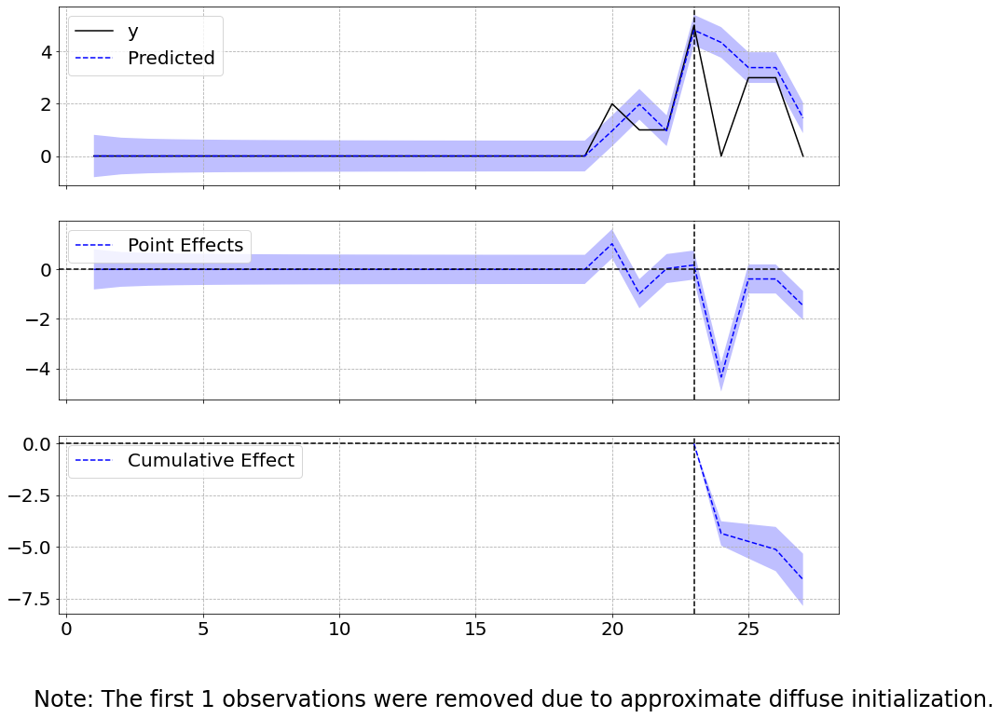



--------------------------------------------------------------------
Code = Z09
Scipy computed Pearson r: 0.014866671454396407 and p-value: 0.9450317648649113
Causal Impact p-value = 0.07092907092907093
counts in post = 7


sigma2.irregular    1.035685
sigma2.level        0.000144
beta.covariate      0.012846
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         0.96 (0.65)        3.85 (2.61)
95% CI                    [-0.3, 2.26]       [-1.2, 9.04]

Absolute effect (s.d.)    1.04 (0.65)        4.15 (2.61)
95% CI                    [-0.26, 2.3]       [-1.04, 9.2]

Relative effect (s.d.)    107.83% (67.87%)   107.83% (67.87%)
95% CI                    [-27.08%, 238.97%] [-27.08%, 238.97%]

Posterior tail-area probability p: 0.07
Posterior prob. of a causal effect: 92.91%

For more details run the command: print(impact.summary('report'))
Analysis report {Causa

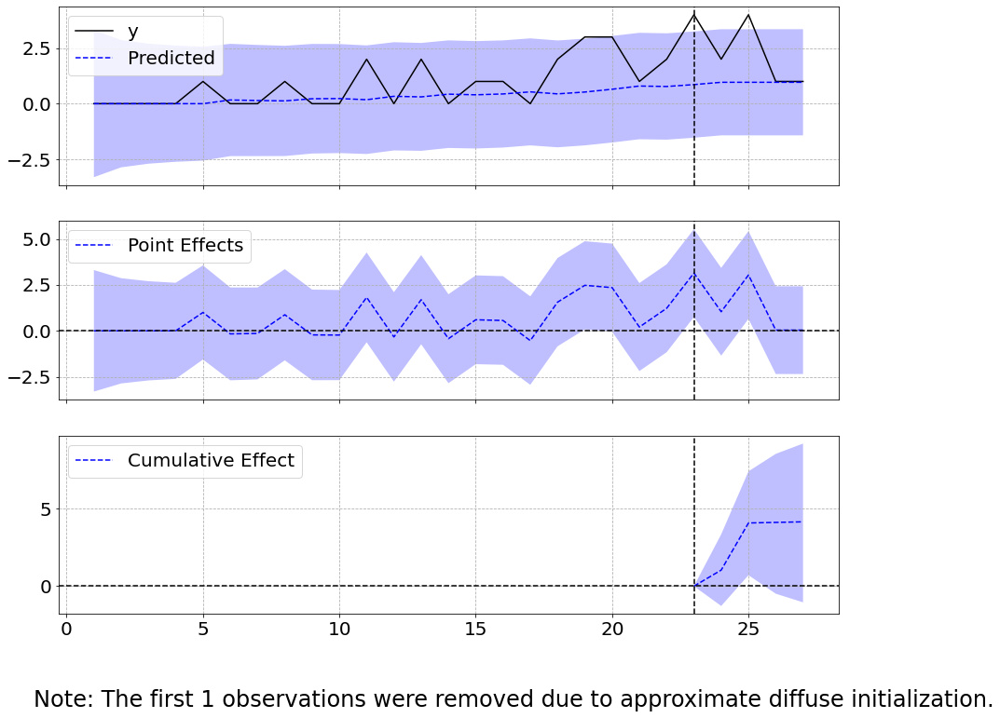



--------------------------------------------------------------------
Code = Z11
Scipy computed Pearson r: 0.5622951863767172 and p-value: 0.004236927185385309
Causal Impact p-value = 0.37962037962037964
counts in post = 31


sigma2.irregular    0.712281
sigma2.level        0.000144
beta.covariate      0.560147
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    8.5                34.0
Prediction (s.d.)         9.21 (1.92)        36.86 (7.69)
95% CI                    [5.36, 12.9]       [21.45, 51.59]

Absolute effect (s.d.)    -0.71 (1.92)       -2.86 (7.69)
95% CI                    [-4.4, 3.14]       [-17.59, 12.55]

Relative effect (s.d.)    -7.76% (20.86%)    -7.76% (20.86%)
95% CI                    [-47.73%, 34.06%]  [-47.73%, 34.06%]

Posterior tail-area probability p: 0.38
Posterior prob. of a causal effect: 62.04%

For more details run the command: print(impact.summary('report'))
Analysis report

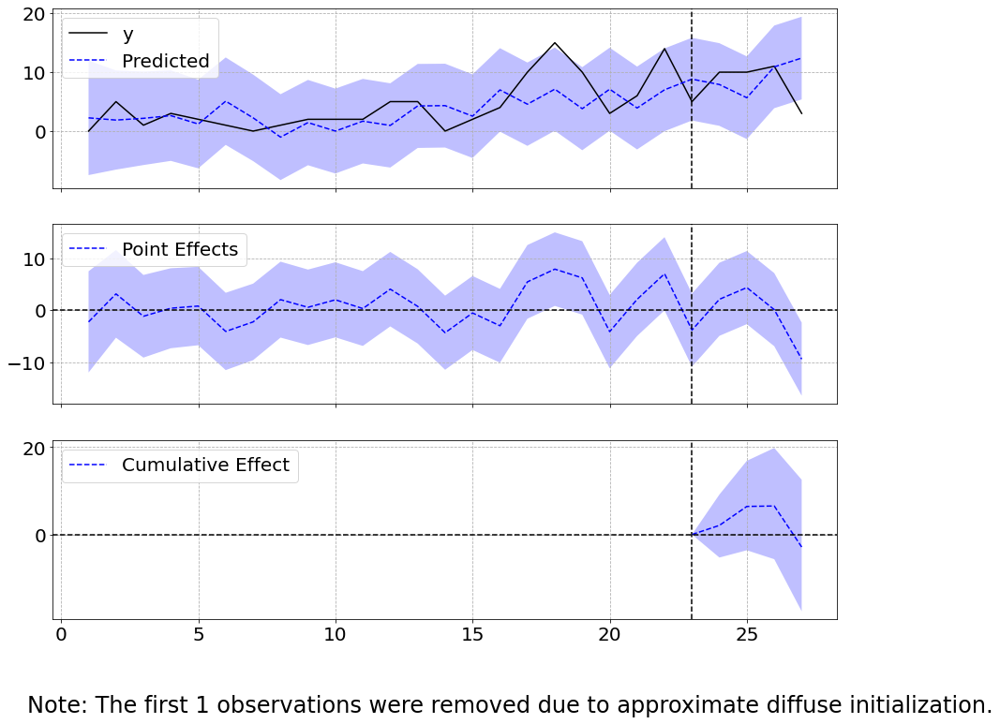



--------------------------------------------------------------------
Code = Z12
Scipy computed Pearson r: -0.04694265255488887 and p-value: 0.8275739937346829
Causal Impact p-value = 0.012987012987012988
counts in post = 23

Significant without Bonferroni correction

sigma2.irregular    1.036333
sigma2.level        0.000144
beta.covariate     -0.049169
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    7.5                30.0
Prediction (s.d.)         3.68 (1.74)        14.73 (6.96)
95% CI                    [0.17, 6.99]       [0.69, 27.96]

Absolute effect (s.d.)    3.82 (1.74)        15.27 (6.96)
95% CI                    [0.51, 7.33]       [2.04, 29.31]

Relative effect (s.d.)    103.67% (47.24%)   103.67% (47.24%)
95% CI                    [13.86%, 199.01%]  [13.86%, 199.01%]

Posterior tail-area probability p: 0.01
Posterior prob. of a causal effect: 98.7%

For more details run the command: print(i

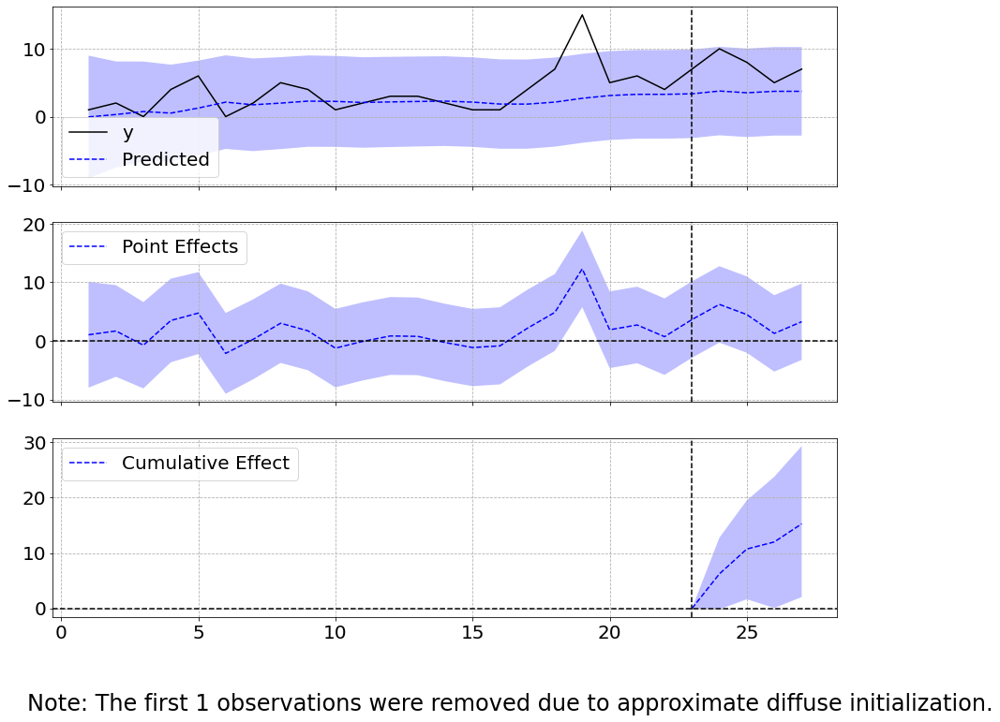



--------------------------------------------------------------------
Code = Z13
Scipy computed Pearson r: 0.4148365446559862 and p-value: 0.04383629560031171
Causal Impact p-value = 0.3256743256743257
counts in post = 6


sigma2.irregular    0.861947
sigma2.level        0.000144
beta.covariate      0.413443
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.25               9.0
Prediction (s.d.)         2.74 (1.21)        10.96 (4.86)
95% CI                    [0.31, 5.07]       [1.23, 20.26]

Absolute effect (s.d.)    -0.49 (1.21)       -1.96 (4.86)
95% CI                    [-2.82, 1.94]      [-11.26, 7.77]

Relative effect (s.d.)    -17.89% (44.31%)   -17.89% (44.31%)
95% CI                    [-102.77%, 70.91%] [-102.77%, 70.91%]

Posterior tail-area probability p: 0.33
Posterior prob. of a causal effect: 67.43%

For more details run the command: print(impact.summary('report'))
Analysis report {Ca

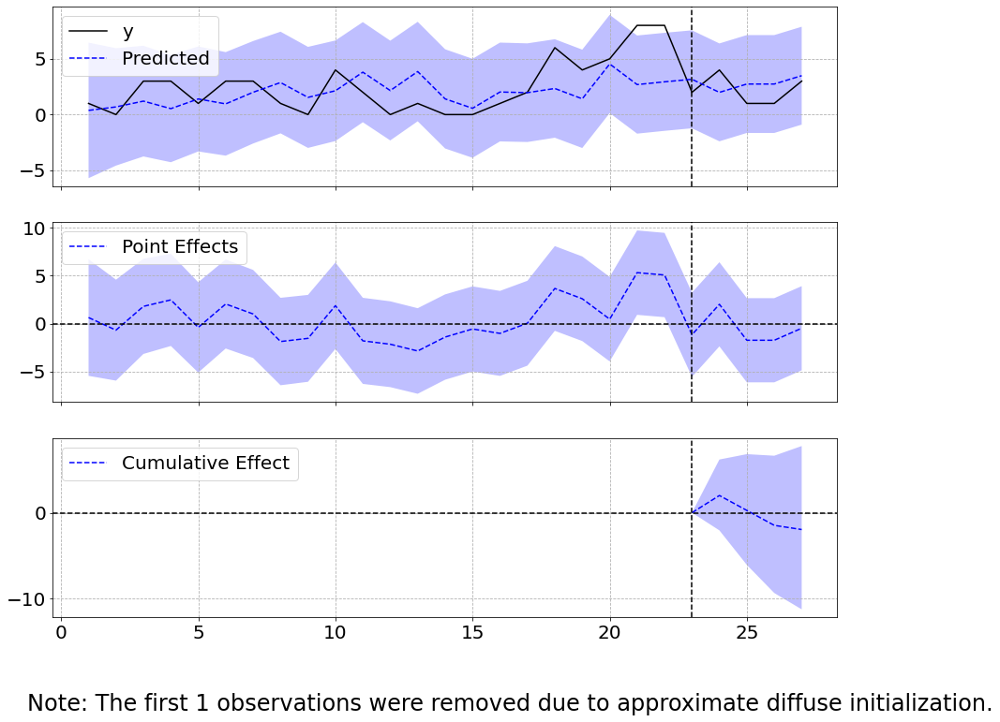



--------------------------------------------------------------------
Code = Z20
Scipy computed Pearson r: 0.9357594588854833 and p-value: 1.964994153176339e-11
Causal Impact p-value = 0.0
counts in post = 42

Passes Bonferroni

sigma2.irregular    0.129811
sigma2.level        0.000069
beta.covariate      0.936243
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    12.0               48.0
Prediction (s.d.)         18.12 (0.98)       72.47 (3.92)
95% CI                    [16.18, 20.02]     [64.71, 80.06]

Absolute effect (s.d.)    -6.12 (0.98)       -24.47 (3.92)
95% CI                    [-8.02, -4.18]     [-32.06, -16.71]

Relative effect (s.d.)    -33.77% (5.4%)     -33.77% (5.4%)
95% CI                    [-44.24%, -23.05%] [-44.24%, -23.05%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis re

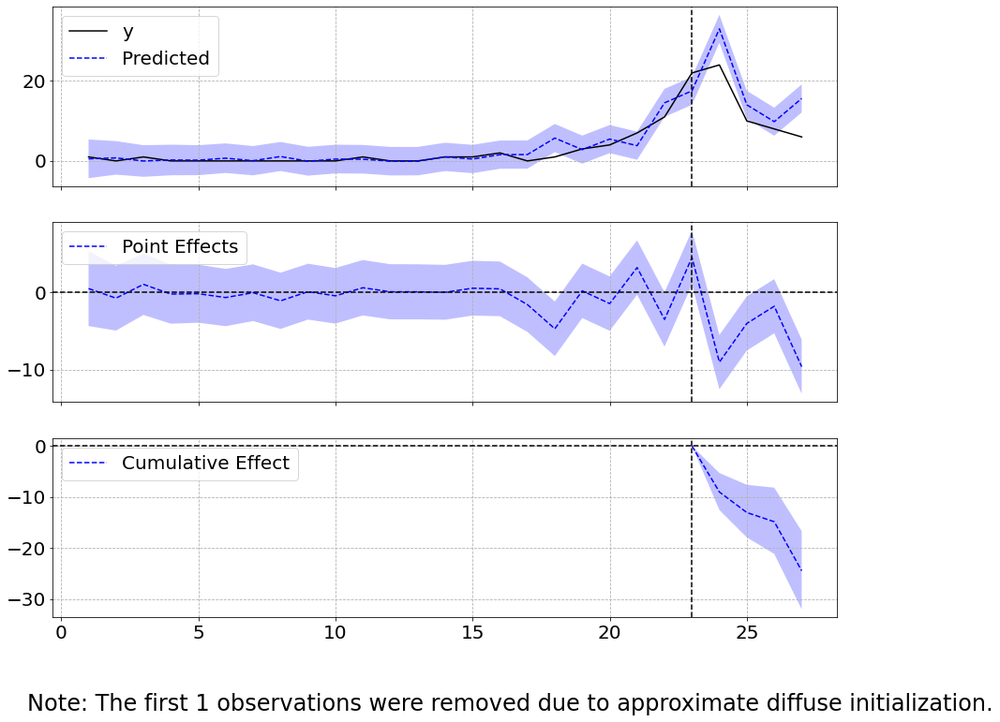



--------------------------------------------------------------------
Code = Z23
Scipy computed Pearson r: 0.79302941767633 and p-value: 3.809135980109565e-06
Causal Impact p-value = 0.41858141858141856
counts in post = 11


sigma2.irregular    0.385470
sigma2.level        0.000144
beta.covariate      0.790428
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    3.75               15.0
Prediction (s.d.)         3.64 (0.67)        14.55 (2.7)
95% CI                    [2.35, 4.99]       [9.41, 19.97]

Absolute effect (s.d.)    0.11 (0.67)        0.45 (2.7)
95% CI                    [-1.24, 1.4]       [-4.97, 5.59]

Relative effect (s.d.)    3.06% (18.53%)     3.06% (18.53%)
95% CI                    [-34.18%, 38.44%]  [-34.18%, 38.44%]

Posterior tail-area probability p: 0.42
Posterior prob. of a causal effect: 58.14%

For more details run the command: print(impact.summary('report'))
Analysis report {Causal

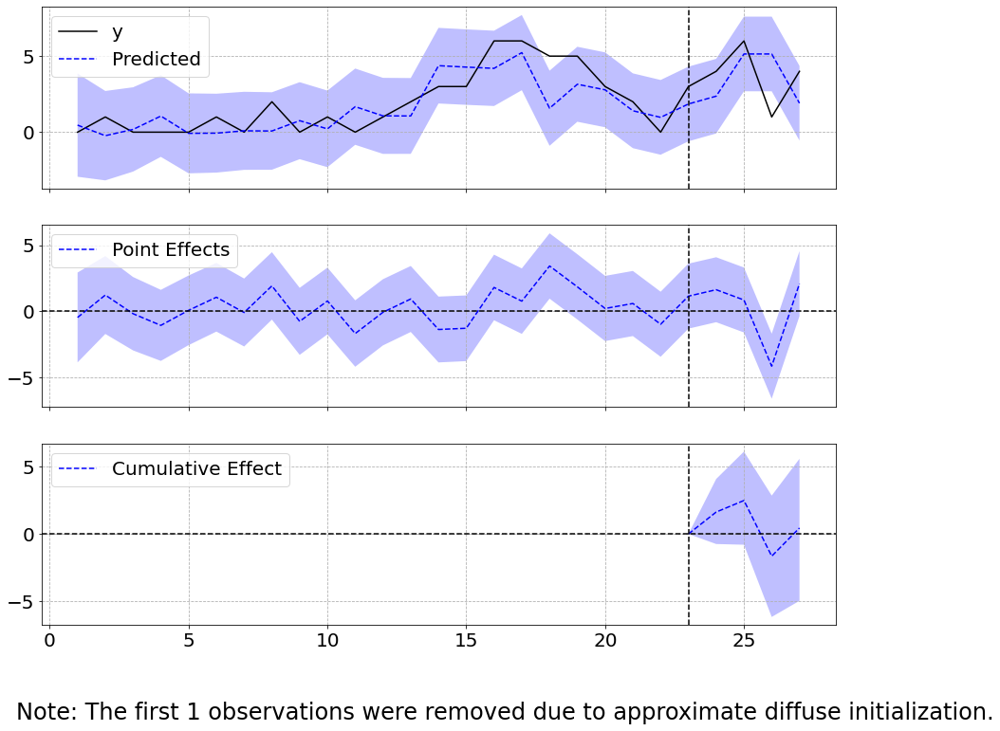



--------------------------------------------------------------------
Code = Z30
Scipy computed Pearson r: -0.19215526093159674 and p-value: 0.36836786242107344
Causal Impact p-value = 0.0
counts in post = 37

Passes Bonferroni

sigma2.irregular    1.001994
sigma2.level        0.000144
beta.covariate     -0.192384
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    12.25              49.0
Prediction (s.d.)         2.58 (0.99)        10.34 (3.97)
95% CI                    [0.74, 4.63]       [2.94, 18.52]

Absolute effect (s.d.)    9.67 (0.99)        38.66 (3.97)
95% CI                    [7.62, 11.51]      [30.48, 46.06]

Relative effect (s.d.)    374.09% (38.45%)   374.09% (38.45%)
95% CI                    [294.93%, 445.63%] [294.93%, 445.63%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis repo

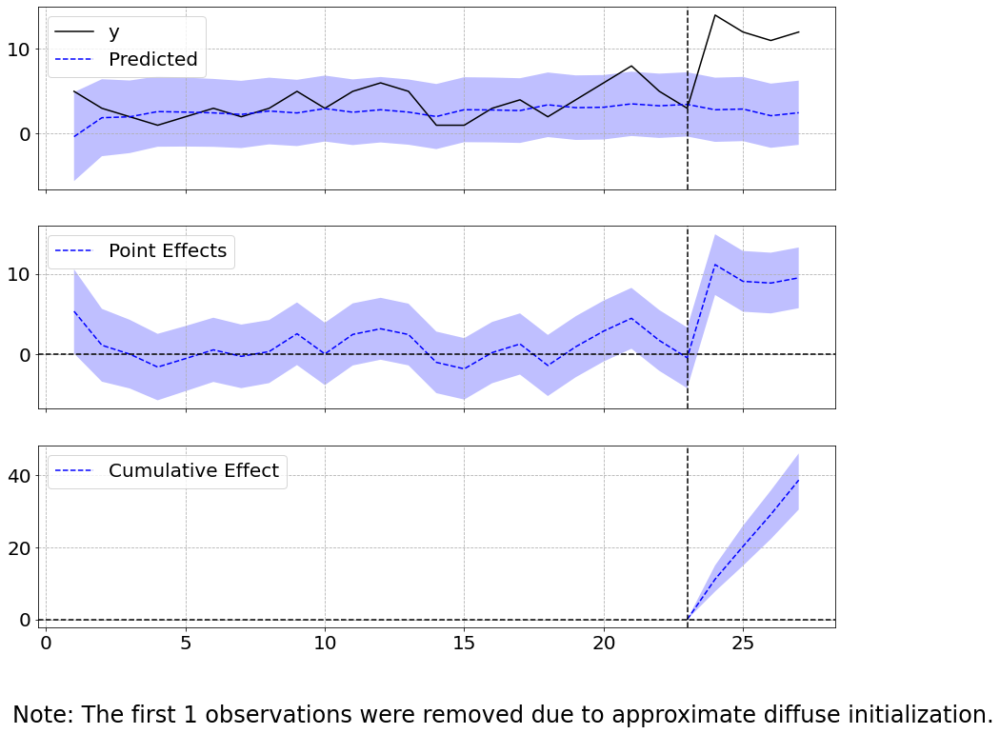



--------------------------------------------------------------------
Code = Z34
Scipy computed Pearson r: 0.7344340150379047 and p-value: 4.386474650407369e-05
Causal Impact p-value = 0.008991008991008992
counts in post = 14

Significant without Bonferroni correction

sigma2.irregular    0.477299
sigma2.level        0.000144
beta.covariate      0.731541
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    4.0                16.0
Prediction (s.d.)         1.5 (1.02)         6.0 (4.09)
95% CI                    [-0.49, 3.52]      [-1.97, 14.06]

Absolute effect (s.d.)    2.5 (1.02)         10.0 (4.09)
95% CI                    [0.48, 4.49]       [1.94, 17.97]

Relative effect (s.d.)    166.47% (68.12%)   166.47% (68.12%)
95% CI                    [32.23%, 299.26%]  [32.23%, 299.26%]

Posterior tail-area probability p: 0.01
Posterior prob. of a causal effect: 99.1%

For more details run the command: print(im

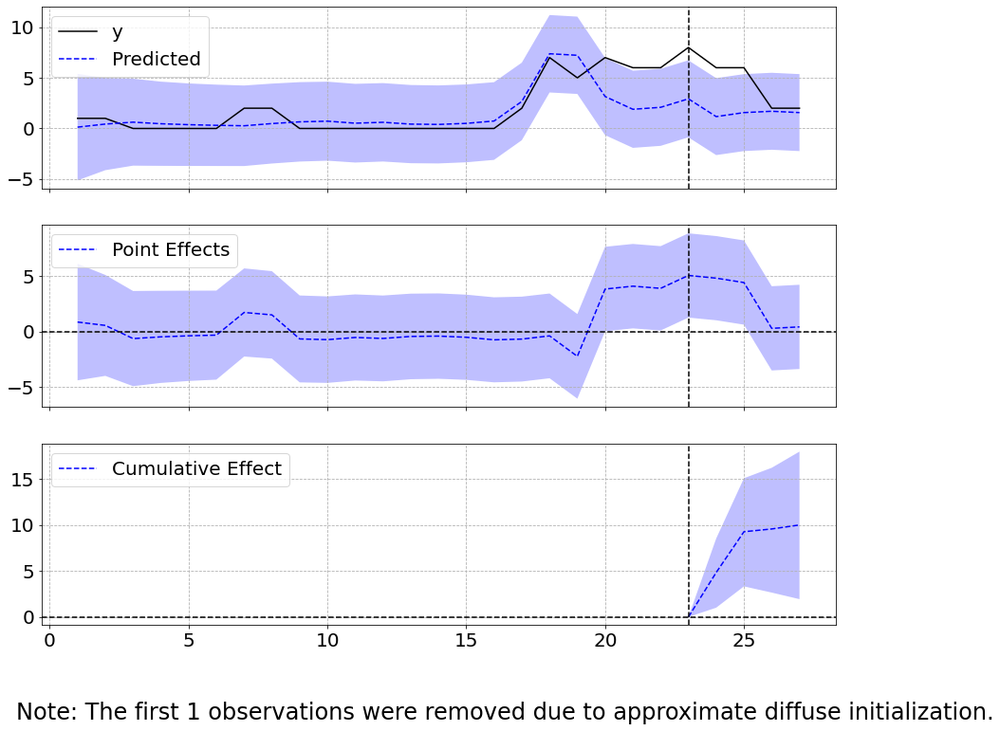



--------------------------------------------------------------------
Code = Z68
Scipy computed Pearson r: 0.2232730602028302 and p-value: 0.29430196954269
Causal Impact p-value = 0.10789210789210789
counts in post = 20


sigma2.irregular    0.989414
sigma2.level        0.000144
beta.covariate      0.223038
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    6.5                26.0
Prediction (s.d.)         9.07 (2.18)        36.26 (8.73)
95% CI                    [4.79, 13.35]      [19.15, 53.39]

Absolute effect (s.d.)    -2.57 (2.18)       -10.26 (8.73)
95% CI                    [-6.85, 1.71]      [-27.39, 6.85]

Relative effect (s.d.)    -28.3% (24.09%)    -28.3% (24.09%)
95% CI                    [-75.53%, 18.89%]  [-75.53%, 18.89%]

Posterior tail-area probability p: 0.11
Posterior prob. of a causal effect: 89.21%

For more details run the command: print(impact.summary('report'))
Analysis report {Ca

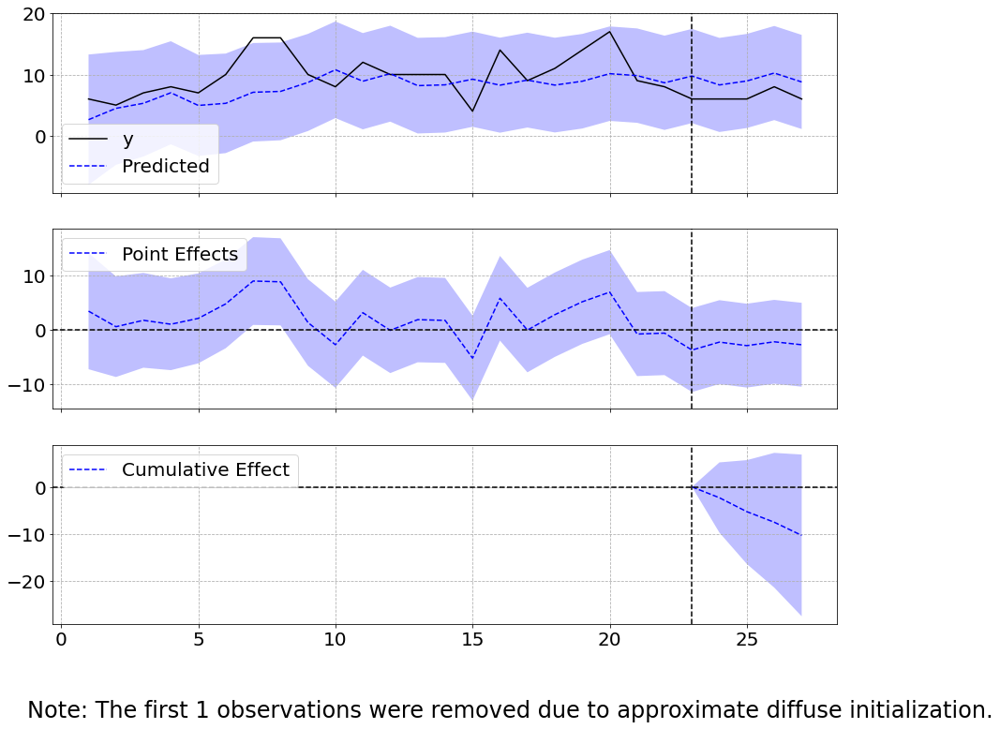



--------------------------------------------------------------------
Code = Z71
Scipy computed Pearson r: 0.14278166870198586 and p-value: 0.505688215655669
Causal Impact p-value = 0.07092907092907093
counts in post = 7


sigma2.irregular    1.017615
sigma2.level        0.000144
beta.covariate      0.140855
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         4.4 (1.26)         17.61 (5.05)
95% CI                    [1.93, 6.88]       [7.72, 27.53]

Absolute effect (s.d.)    -1.9 (1.26)        -7.61 (5.05)
95% CI                    [-4.38, 0.57]      [-17.53, 2.28]

Relative effect (s.d.)    -43.2% (28.71%)    -43.2% (28.71%)
95% CI                    [-99.6%, 12.94%]   [-99.6%, 12.94%]

Posterior tail-area probability p: 0.07
Posterior prob. of a causal effect: 92.91%

For more details run the command: print(impact.summary('report'))
Analysis report {Caus

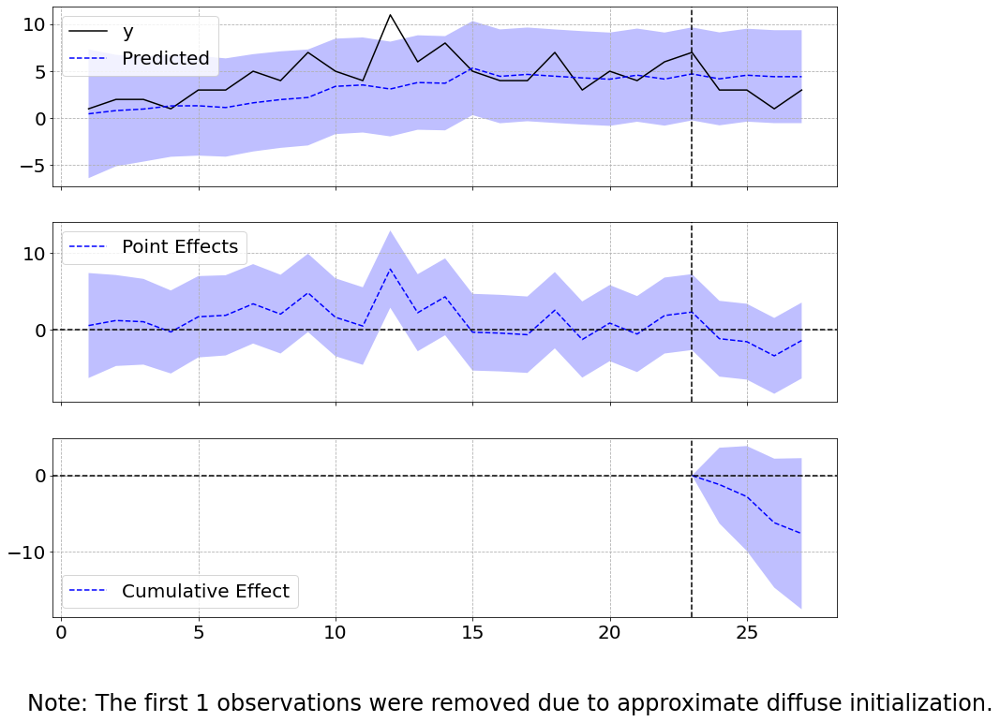



--------------------------------------------------------------------
Code = Z86
Scipy computed Pearson r: 0.3267476887141291 and p-value: 0.11913674386022954
Causal Impact p-value = 0.0
counts in post = 6

Passes Bonferroni

sigma2.irregular    0.929365
sigma2.level        0.000144
beta.covariate      0.325853
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.5                10.0
Prediction (s.d.)         0.37 (0.4)         1.47 (1.62)
95% CI                    [-0.42, 1.16]      [-1.69, 4.66]

Absolute effect (s.d.)    2.13 (0.4)         8.53 (1.62)
95% CI                    [1.34, 2.92]       [5.34, 11.69]

Relative effect (s.d.)    578.55% (109.82%)  578.55% (109.82%)
95% CI                    [362.54%, 793.03%] [362.54%, 793.03%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {C

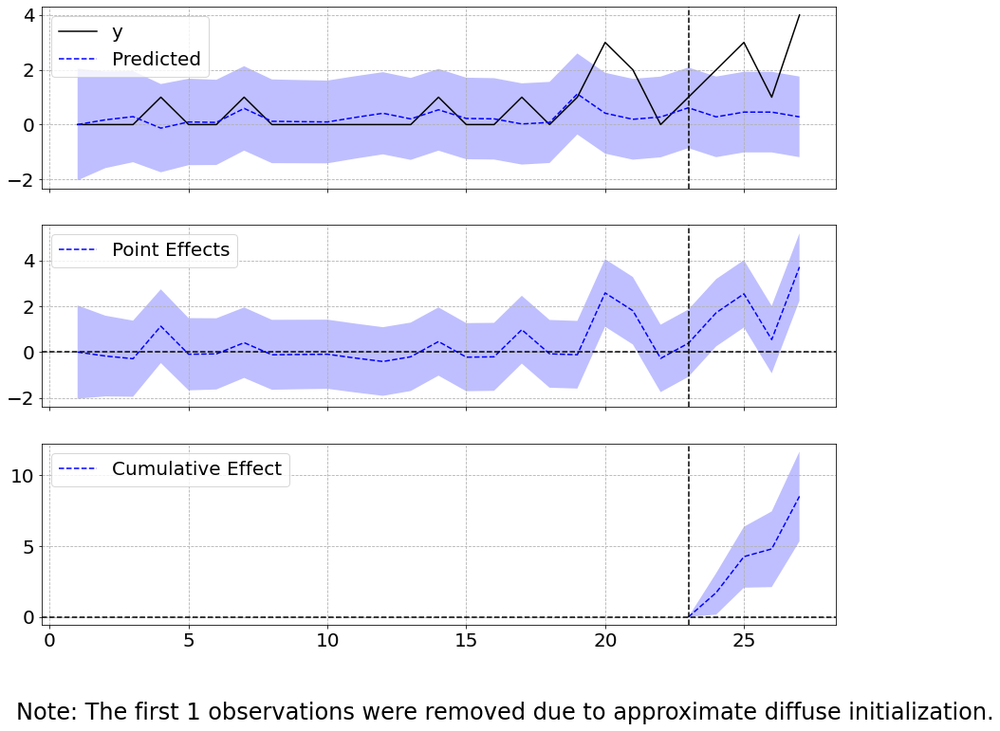



--------------------------------------------------------------------
Code = Z90
Scipy computed Pearson r: -0.18879795344127695 and p-value: 0.37695227096132194
Causal Impact p-value = 0.0
counts in post = 8

Passes Bonferroni

sigma2.irregular    1.006208
sigma2.level        0.000069
beta.covariate     -0.189154
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.75               11.0
Prediction (s.d.)         0.78 (0.42)        3.13 (1.7)
95% CI                    [-0.05, 1.62]      [-0.19, 6.47]

Absolute effect (s.d.)    1.97 (0.42)        7.87 (1.7)
95% CI                    [1.13, 2.8]        [4.53, 11.19]

Relative effect (s.d.)    251.39% (54.25%)   251.39% (54.25%)
95% CI                    [144.79%, 357.44%] [144.79%, 357.44%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {Ca

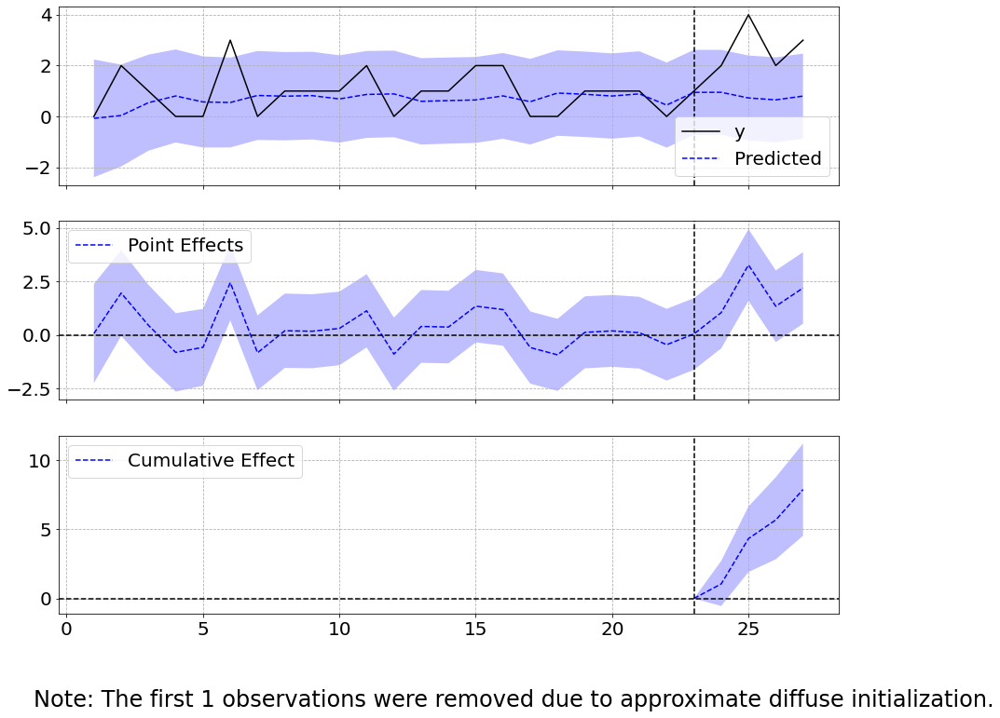



--------------------------------------------------------------------
Code = Z91
Scipy computed Pearson r: -0.04177304141587129 and p-value: 0.8463288087521016
Causal Impact p-value = 0.060939060939060936
counts in post = 7


sigma2.irregular    1.037798
sigma2.level        0.000144
beta.covariate     -0.043443
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    2.0                8.0
Prediction (s.d.)         1.07 (0.6)         4.27 (2.42)
95% CI                    [-0.08, 2.29]      [-0.31, 9.16]

Absolute effect (s.d.)    0.93 (0.6)         3.73 (2.42)
95% CI                    [-0.29, 2.08]      [-1.16, 8.31]

Relative effect (s.d.)    87.47% (56.62%)    87.47% (56.62%)
95% CI                    [-27.16%, 194.8%]  [-27.16%, 194.8%]

Posterior tail-area probability p: 0.06
Posterior prob. of a causal effect: 93.91%

For more details run the command: print(impact.summary('report'))
Analysis report {Caus

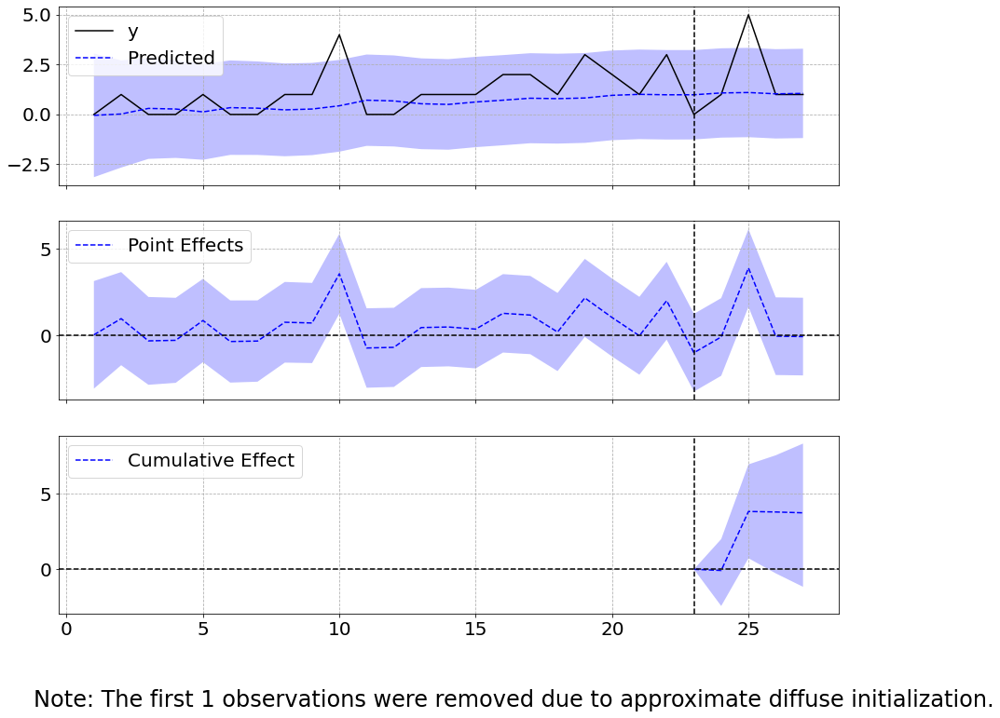



--------------------------------------------------------------------
Code = Z98
Scipy computed Pearson r: 0.4320312475098437 and p-value: 0.035008367518945066
Causal Impact p-value = 0.003996003996003996
counts in post = 6

Significant without Bonferroni correction

sigma2.irregular    0.846806
sigma2.level        0.000144
beta.covariate      0.430417
dtype: float64
Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    1.75               7.0
Prediction (s.d.)         0.64 (0.41)        2.54 (1.63)
95% CI                    [-0.17, 1.42]      [-0.68, 5.7]

Absolute effect (s.d.)    1.11 (0.41)        4.46 (1.63)
95% CI                    [0.33, 1.92]       [1.3, 7.68]

Relative effect (s.d.)    175.09% (63.94%)   175.09% (63.94%)
95% CI                    [51.15%, 301.81%]  [51.15%, 301.81%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 99.6%

For more details run the command: print(impact.su

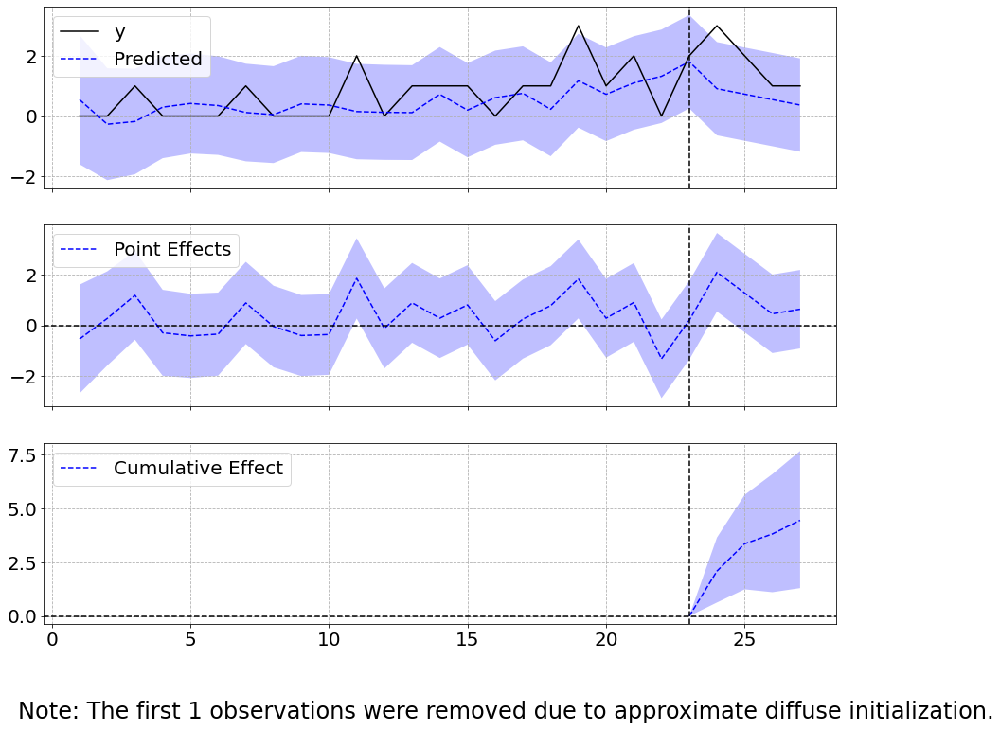

In [7]:
np.random.seed(12345)

pThres = 0.05/len(CandiCodes)

pValDict = {}
ctr, ctrBon = 0, 0
for cc in CandiCodes:
    if cc=='E11':
        continue
    print()
    print()
    print("--------------------------------------------------------------------")
    print('Code = ' + cc)
    covid = Covid[Covid['Code'] == cc]
    control = Control[Control['Code'] == cc]
    x = []
    z = []
    for ind in list(range(-24,0)) + list(range(2,12)):
        sub_df = covid[covid['RelOnsetMonth']==ind]
        if not sub_df.empty:
            x.append(sub_df.iloc[0]['count'])
        else:
            x.append(0)     
    for ind in list(range(-24,0)) + list(range(2,12)):
        sub_df = control[control['RelOnsetMonth']==ind]
        if not sub_df.empty:
            z.append(sub_df.iloc[0]['count'])
        else:
            z.append(0)     
    r, p = stats.pearsonr(x[:24],z[:24])
    print(f"Scipy computed Pearson r: {r} and p-value: {p}")
    data = pd.DataFrame({'observed': x, 'covariate': z}, columns=['observed', 'covariate'])
    
    pre_period = [0, 23]
    post_period = [24, 27]

    ci = CausalImpact(data, pre_period, post_period)

    p_value = ci.p_value
    pValDict[cc] = p_value
    print('Causal Impact p-value = ' + str(p_value))
    print('counts in post = ' + str(post_count[cc]))
    print()
    if p_value <pThres:
        print('Passes Bonferroni')
    elif p_value < 0.05:
        print('Significant without Bonferroni correction')
    print()
    print(ci.trained_model.params)
    print(ci.summary())
    print(ci.summary(output='report'))
    ci.plot()

## FDR correction


In [13]:
pList = np.array(list(pValDict.values()))
codeList = list(pValDict.keys())
res = statsmodels.stats.multitest.fdrcorrection(pList)[0]
sigres = np.array(codeList)[res]

array([0.01898102, 0.20679321, 0.07192807, 0.39460539, 0.38061938,
       0.01798202, 0.29270729, 0.        , 0.        , 0.        ,
       0.15884116, 0.14185814, 0.3016983 , 0.01698302, 0.        ,
       0.24175824, 0.28271728, 0.22777223, 0.03196803, 0.0989011 ,
       0.17782218, 0.23876124, 0.        , 0.45054945, 0.06393606,
       0.44055944, 0.35864136, 0.35264735, 0.32567433, 0.34265734,
       0.16683317, 0.46853147, 0.001998  , 0.24675325, 0.42257742,
       0.        , 0.        , 0.33266733, 0.        , 0.40859141,
       0.02097902, 0.        , 0.40659341, 0.11588412, 0.01598402,
       0.003996  , 0.        , 0.        , 0.08391608, 0.00699301,
       0.17682318, 0.        , 0.        , 0.28771229, 0.000999  ,
       0.22277722, 0.        , 0.03296703, 0.001998  , 0.00999001,
       0.        , 0.14485514, 0.12787213, 0.15884116, 0.001998  ,
       0.00799201, 0.16583417, 0.004995  , 0.        , 0.07092907,
       0.37962038, 0.01298701, 0.32567433, 0.        , 0.41858

B00-Herpesviral herpes simplex infections
G43-Migraine
L03-Cellulitis and acute lymphangitis
L65-Other nonscarring hair loss
L73-Other follicular disorders
M54-Dorsalgia
N39-Other disorders of urinary system
N93-Other abnormal uterine and vaginal bleeding
O24-Diabetes mellitus in pregnancy, childbirth, and the puerperium
O99-Other maternal diseases classifiable elsewhere but complicating pregnancy, childbirth and the puerperium
R03-Abnormal blood-pressure reading, without diagnosis
R11-Nausea and vomiting
R20-Disturbances of skin sensation
R51-Headache
R59-Enlarged lymph nodes

B00-Herpesviral herpes simplex infections
G43-Migraine
L03-Cellulitis and acute lymphangitis
L65-Other nonscarring hair loss
L73-Other follicular disorders
M54-Dorsalgia
N39-Other disorders of urinary system
N93-Other abnormal uterine and vaginal bleeding
O24-Diabetes mellitus in pregnancy, childbirth, and the puerperium
O99-Other maternal diseases classifiable elsewhere but complicating pregnancy, childbirth and the puerperium
R03-Abnormal blood-pressure reading, without diagnosis
R11-Nausea and vomiting
R20-Disturbances of skin sensation
R51-Headache
R59-Enlarged lymph nodes
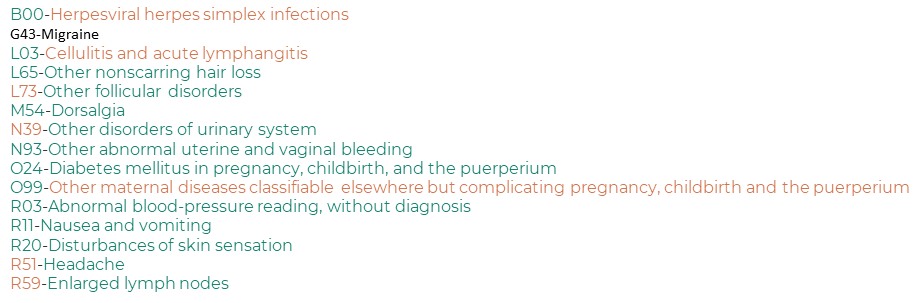